### Solution

Q3: See below

### Train the Reconstruction

In [29]:
import torch
import timm
import numpy as np

from einops import repeat, rearrange
from einops.layers.torch import Rearrange

from timm.models.layers import trunc_normal_
from timm.models.vision_transformer import Block


def random_indexes(size : int):
    forward_indexes = np.arange(size)
    np.random.shuffle(forward_indexes)
    backward_indexes = np.argsort(forward_indexes)
    return forward_indexes, backward_indexes

def take_indexes(sequences, indexes):
    return torch.gather(sequences, 0, repeat(indexes, 't b -> t b c', c=sequences.shape[-1]))

class PatchShuffle(torch.nn.Module):
    def __init__(self, ratio) -> None:
        super().__init__()
        self.ratio = ratio

    def forward(self, patches : torch.Tensor):
        T, B, C = patches.shape
        remain_T = int(T * (1 - self.ratio))

        indexes = [random_indexes(T) for _ in range(B)]
        forward_indexes = torch.as_tensor(np.stack([i[0] for i in indexes], axis=-1), dtype=torch.long).to(patches.device)
        backward_indexes = torch.as_tensor(np.stack([i[1] for i in indexes], axis=-1), dtype=torch.long).to(patches.device)

        patches = take_indexes(patches, forward_indexes)
        patches = patches[:remain_T]

        return patches, forward_indexes, backward_indexes

class MAE_Encoder(torch.nn.Module):
    def __init__(self,
                 image_size=32,
                 patch_size=2,
                 emb_dim=192,
                 num_layer=12,
                 num_head=3,
                 mask_ratio=0.75,
                 ) -> None:
        super().__init__()

        self.cls_token = torch.nn.Parameter(torch.zeros(1, 1, emb_dim))
        self.pos_embedding = torch.nn.Parameter(torch.zeros((image_size // patch_size) ** 2, 1, emb_dim))
        self.shuffle = PatchShuffle(mask_ratio)

        self.patchify = torch.nn.Conv2d(3, emb_dim, patch_size, patch_size)

        self.transformer = torch.nn.Sequential(*[Block(emb_dim, num_head) for _ in range(num_layer)])

        self.layer_norm = torch.nn.LayerNorm(emb_dim)

        self.init_weight()

    def init_weight(self):
        trunc_normal_(self.cls_token, std=.02)
        trunc_normal_(self.pos_embedding, std=.02)

    def forward(self, img):
        # print(img.size())
        patches = self.patchify(img)
        # print(patches.size())
        patches = rearrange(patches, 'b c h w -> (h w) b c')
        # print(patches.size(), self.pos_embedding.size())
        patches = patches + self.pos_embedding

        patches, forward_indexes, backward_indexes = self.shuffle(patches)

        patches = torch.cat([self.cls_token.expand(-1, patches.shape[1], -1), patches], dim=0)
        patches = rearrange(patches, 't b c -> b t c')
        features = self.layer_norm(self.transformer(patches))
        features = rearrange(features, 'b t c -> t b c')

        return features, backward_indexes

class MAE_Decoder(torch.nn.Module):
    def __init__(self,
                 image_size=32,
                 patch_size=2,
                 emb_dim=192,
                 num_layer=4,
                 num_head=3,
                 ) -> None:
        super().__init__()

        self.mask_token = torch.nn.Parameter(torch.zeros(1, 1, emb_dim))
        self.pos_embedding = torch.nn.Parameter(torch.zeros((image_size // patch_size) ** 2 + 1, 1, emb_dim))

        self.transformer = torch.nn.Sequential(*[Block(emb_dim, num_head) for _ in range(num_layer)])

        self.head = torch.nn.Linear(emb_dim, 3 * patch_size ** 2)
        self.patch2img = Rearrange('(h w) b (c p1 p2) -> b c (h p1) (w p2)', p1=patch_size, p2=patch_size, h=image_size//patch_size)

        self.init_weight()

    def init_weight(self):
        trunc_normal_(self.mask_token, std=.02)
        trunc_normal_(self.pos_embedding, std=.02)

    def forward(self, features, backward_indexes):
        T = features.shape[0]
        backward_indexes = torch.cat([torch.zeros(1, backward_indexes.shape[1]).to(backward_indexes), backward_indexes + 1], dim=0)
        features = torch.cat([features, self.mask_token.expand(backward_indexes.shape[0] - features.shape[0], features.shape[1], -1)], dim=0)
        features = take_indexes(features, backward_indexes)
        features = features + self.pos_embedding

        features = rearrange(features, 't b c -> b t c')
        features = self.transformer(features)
        features = rearrange(features, 'b t c -> t b c')
        features = features[1:] # remove global feature

        patches = self.head(features)
        mask = torch.zeros_like(patches)
        mask[T-1:] = 1
        mask = take_indexes(mask, backward_indexes[1:] - 1)
        img = self.patch2img(patches)
        mask = self.patch2img(mask)

        return img, mask

class MAE_ViT(torch.nn.Module):
    def __init__(self,
                 image_size=32,
                 patch_size=2,
                 emb_dim=192,
                 encoder_layer=12,
                 encoder_head=3,
                 decoder_layer=4,
                 decoder_head=3,
                 mask_ratio=0.75,
                 ) -> None:
        super().__init__()

        self.encoder = MAE_Encoder(image_size, patch_size, emb_dim, encoder_layer, encoder_head, mask_ratio)
        self.decoder = MAE_Decoder(image_size, patch_size, emb_dim, decoder_layer, decoder_head)

    def forward(self, img):
        features, backward_indexes = self.encoder(img)
        predicted_img, mask = self.decoder(features,  backward_indexes)
        return predicted_img, mask

class ViT_Classifier(torch.nn.Module):
    def __init__(self, encoder : MAE_Encoder, num_classes=10) -> None:
        super().__init__()
        self.cls_token = encoder.cls_token
        self.pos_embedding = encoder.pos_embedding
        self.patchify = encoder.patchify
        self.transformer = encoder.transformer
        self.layer_norm = encoder.layer_norm
        self.head = torch.nn.Linear(self.pos_embedding.shape[-1], num_classes)

    def forward(self, img):
        patches = self.patchify(img)
        patches = rearrange(patches, 'b c h w -> (h w) b c')
        patches = patches + self.pos_embedding
        patches = torch.cat([self.cls_token.expand(-1, patches.shape[1], -1), patches], dim=0)
        patches = rearrange(patches, 't b c -> b t c')
        features = self.layer_norm(self.transformer(patches))
        features = rearrange(features, 'b t c -> t b c')
        logits = self.head(features[0])
        return logits


import random
import torch
import numpy as np

def setup_seed(seed=42):
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    np.random.seed(seed)
    random.seed(seed)
    torch.backends.cudnn.deterministic = True

def denormalize(tensor):
    return tensor * 0.5 + 0.5  # Assuming normalization was (x - 0.5) / 0.5

In [30]:
import os
import argparse
import math
import torch
import torchvision
from torch.utils.tensorboard import SummaryWriter
from torchvision.transforms import ToTensor, Compose, Normalize
from tqdm import tqdm


seed = 42
batch_size = 256
max_device_batch_size = 512
base_learning_rate = 1.5e-4
weight_decay = 0.05
mask_ratio = 0.75
total_epoch = 200
warmup_epoch = 200
model_path = 'saved/vit-t-mae-cifar10.pt'

setup_seed(seed)

In [31]:
from torch.utils.data import random_split
batch_size = batch_size
load_batch_size = min(max_device_batch_size, batch_size)

assert batch_size % load_batch_size == 0
steps_per_update = batch_size // load_batch_size

train_dataset = torchvision.datasets.CIFAR10('data', train=True, download=False, transform=Compose([ToTensor(), Normalize(0.5, 0.5)]))
val_dataset = torchvision.datasets.CIFAR10('data', train=False, download=False, transform=Compose([ToTensor(), Normalize(0.5, 0.5)]))

dataloader = torch.utils.data.DataLoader(train_dataset, load_batch_size, shuffle=True, num_workers=4)
writer = SummaryWriter(os.path.join('logs', 'cifar10-real', 'mae-pretrain-real'))
device = 'cuda:0' if torch.cuda.is_available() else 'cpu'

model = MAE_ViT(image_size = 32, patch_size = 2, mask_ratio=mask_ratio).to(device)
optim = torch.optim.AdamW(model.parameters(), lr=base_learning_rate * batch_size / 256, betas=(0.9, 0.95), weight_decay=weight_decay)
lr_func = lambda epoch: min((epoch + 1) / (warmup_epoch + 1e-8), 0.5 * (math.cos(epoch / total_epoch * math.pi) + 1))
lr_scheduler = torch.optim.lr_scheduler.LambdaLR(optim, lr_lambda=lr_func, verbose=True)

100%|██████████| 196/196 [00:55<00:00,  3.51it/s]


In epoch 0, average traning loss is 0.23621577716299466.
=================== EPOCH:  0  ===================


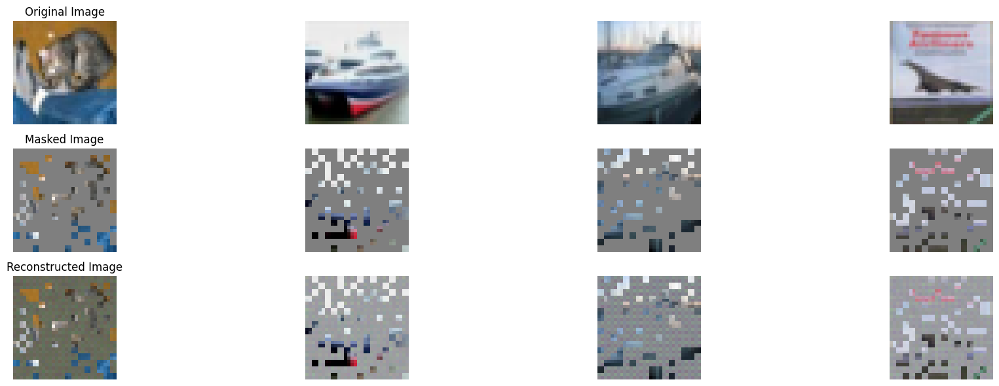

100%|██████████| 196/196 [00:57<00:00,  3.39it/s]


In epoch 1, average traning loss is 0.18385408187703212.
=================== EPOCH:  1  ===================


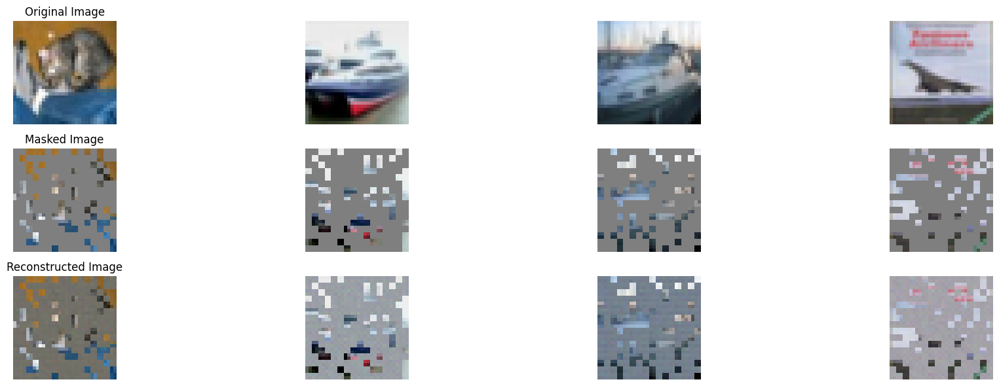

100%|██████████| 196/196 [00:59<00:00,  3.31it/s]


In epoch 2, average traning loss is 0.18039193559361963.
=================== EPOCH:  2  ===================


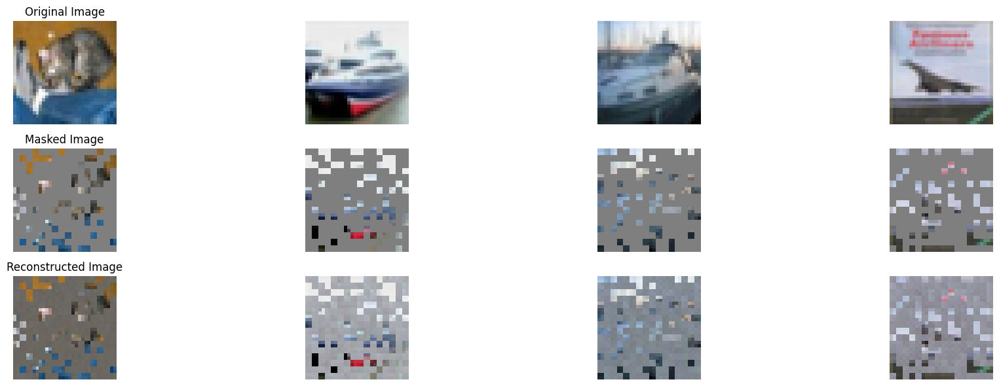

100%|██████████| 196/196 [01:00<00:00,  3.22it/s]


In epoch 3, average traning loss is 0.17693800190273595.
=================== EPOCH:  3  ===================


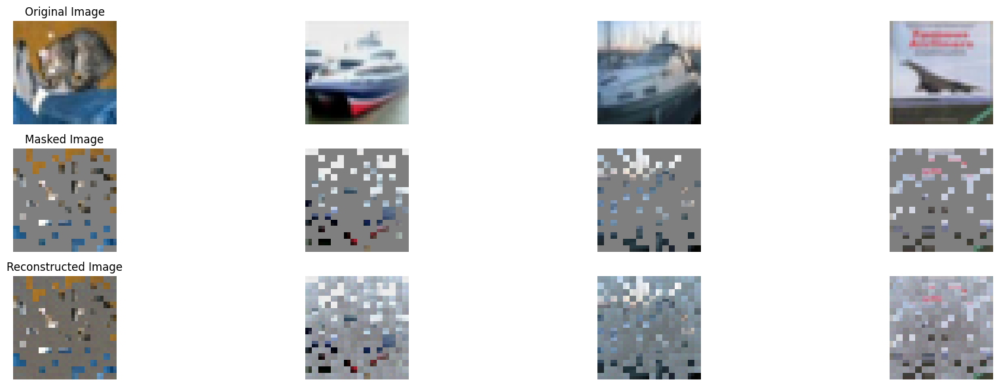

100%|██████████| 196/196 [01:01<00:00,  3.20it/s]


In epoch 4, average traning loss is 0.17186512425541878.
=================== EPOCH:  4  ===================


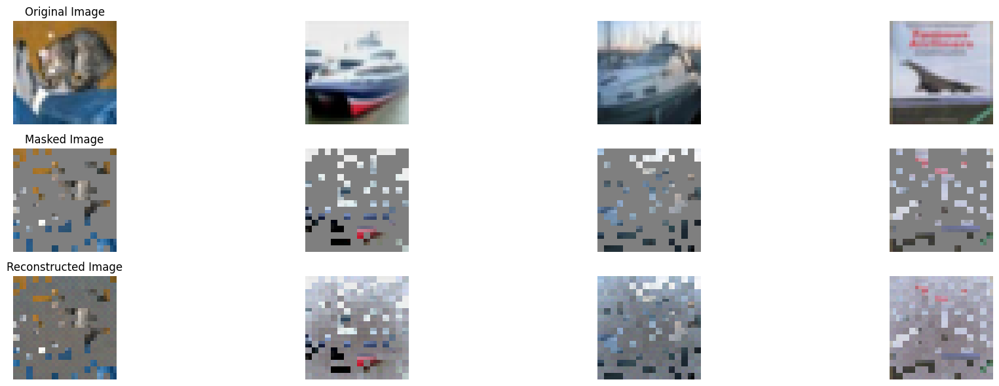

100%|██████████| 196/196 [01:00<00:00,  3.22it/s]


In epoch 5, average traning loss is 0.16495780061398232.
=================== EPOCH:  5  ===================


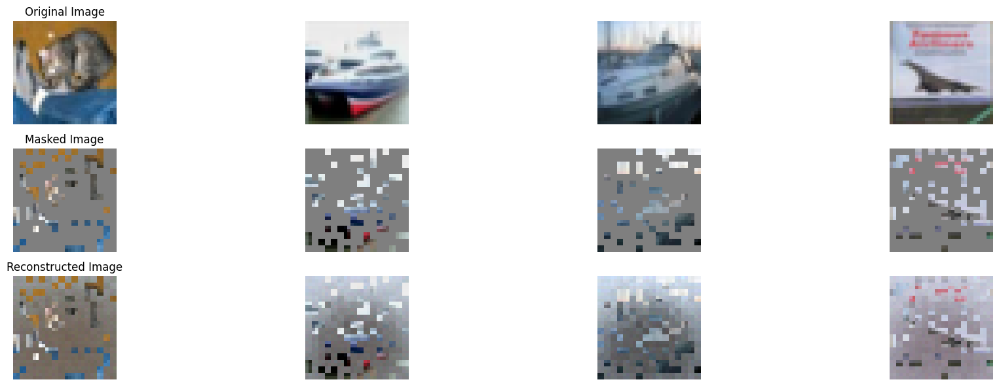

100%|██████████| 196/196 [00:59<00:00,  3.27it/s]


In epoch 6, average traning loss is 0.1616387122443744.
=================== EPOCH:  6  ===================


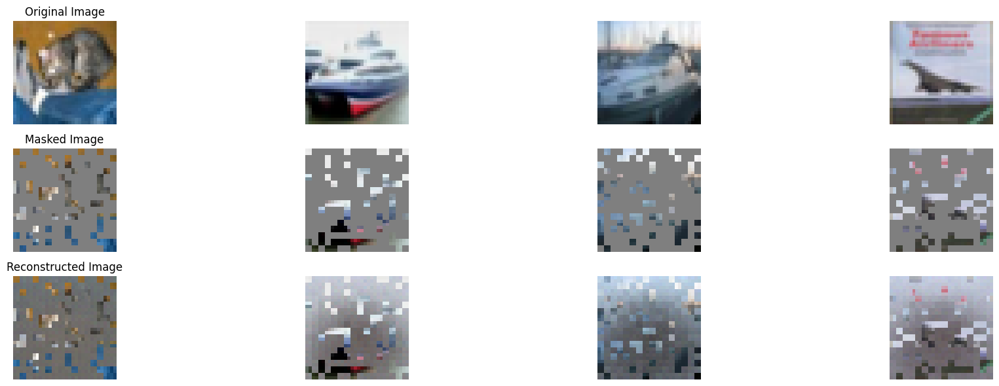

100%|██████████| 196/196 [01:01<00:00,  3.20it/s]


In epoch 7, average traning loss is 0.1599933555235668.
=================== EPOCH:  7  ===================


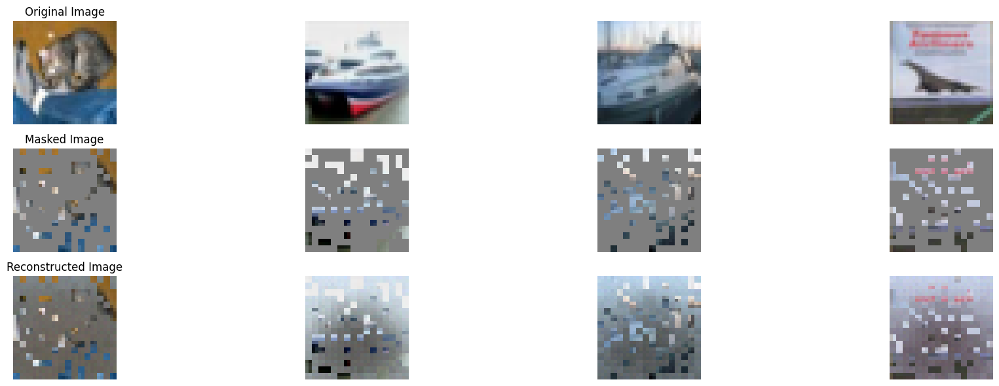

100%|██████████| 196/196 [01:01<00:00,  3.18it/s]


In epoch 8, average traning loss is 0.15807783748118245.
=================== EPOCH:  8  ===================


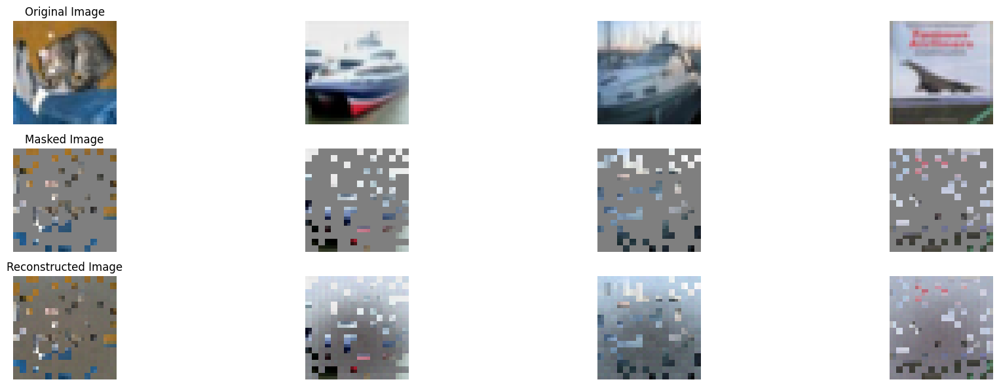

100%|██████████| 196/196 [01:00<00:00,  3.26it/s]


In epoch 9, average traning loss is 0.1554697772526011.
=================== EPOCH:  9  ===================


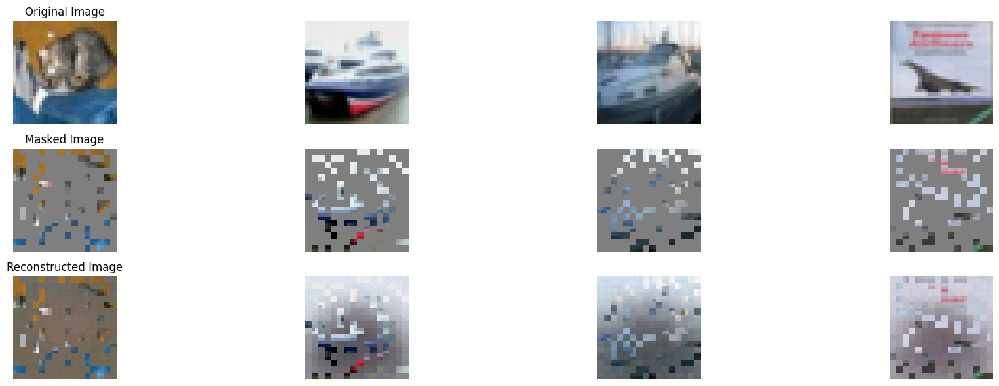

100%|██████████| 196/196 [01:01<00:00,  3.20it/s]


In epoch 10, average traning loss is 0.15152463940333347.
=================== EPOCH:  10  ===================


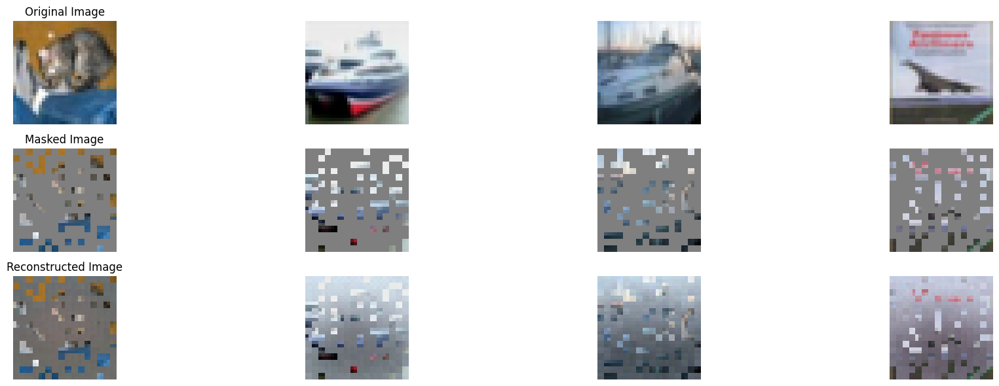

100%|██████████| 196/196 [01:01<00:00,  3.20it/s]


In epoch 11, average traning loss is 0.14709040978733373.
=================== EPOCH:  11  ===================


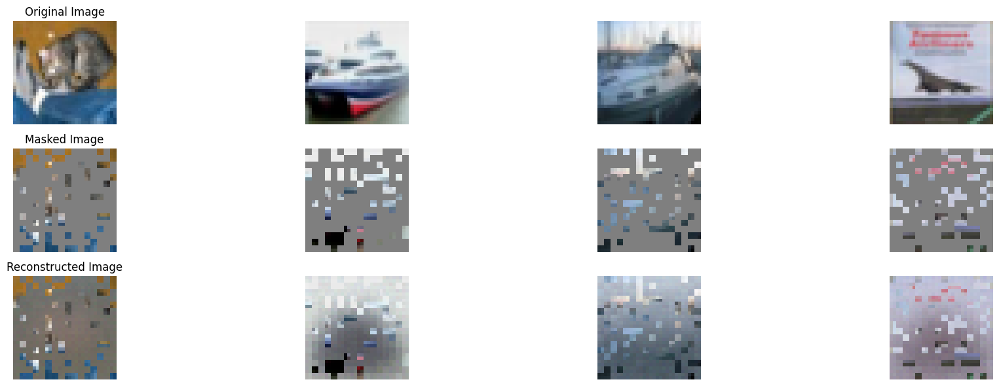

100%|██████████| 196/196 [01:00<00:00,  3.22it/s]


In epoch 12, average traning loss is 0.14447425708782916.
=================== EPOCH:  12  ===================


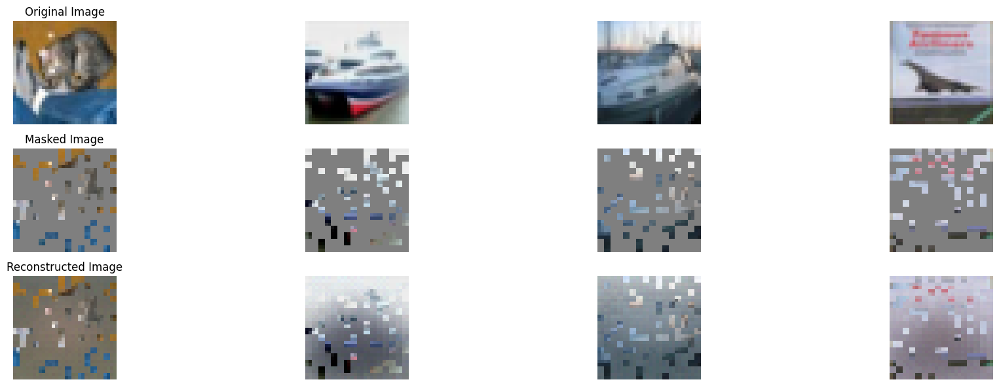

100%|██████████| 196/196 [01:00<00:00,  3.23it/s]


In epoch 13, average traning loss is 0.14316158688494138.
=================== EPOCH:  13  ===================


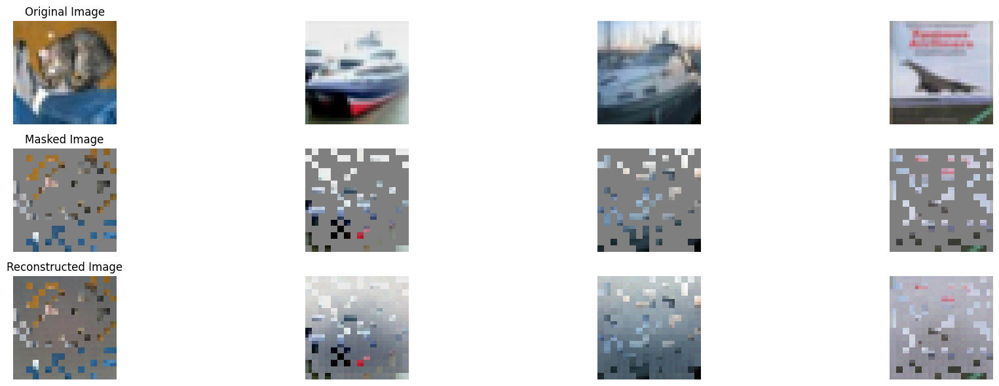

100%|██████████| 196/196 [01:00<00:00,  3.23it/s]


In epoch 14, average traning loss is 0.14180295405035115.
=================== EPOCH:  14  ===================


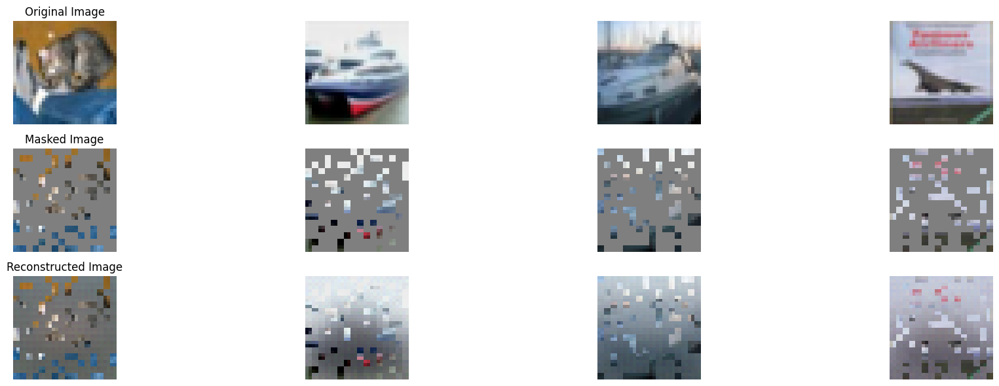

100%|██████████| 196/196 [01:00<00:00,  3.23it/s]


In epoch 15, average traning loss is 0.14082059195759344.
=================== EPOCH:  15  ===================


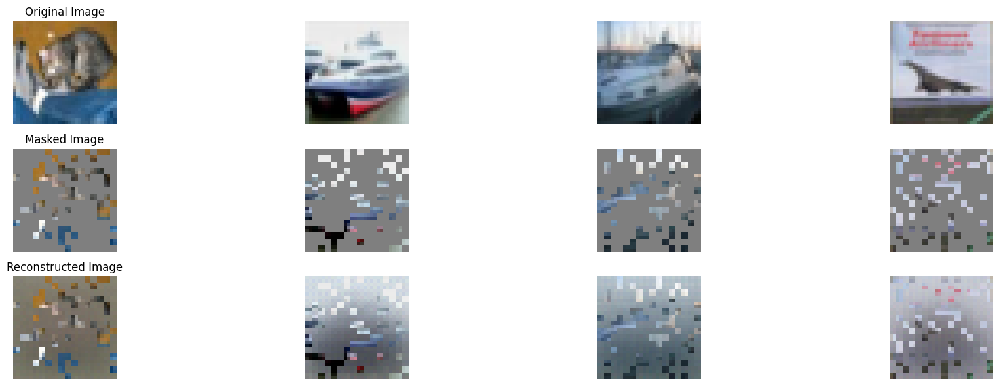

100%|██████████| 196/196 [01:00<00:00,  3.24it/s]


In epoch 16, average traning loss is 0.13986202048099772.
=================== EPOCH:  16  ===================


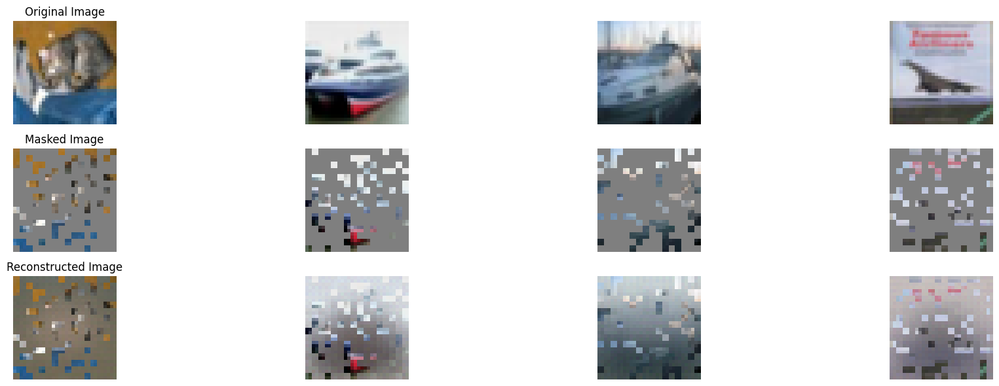

100%|██████████| 196/196 [01:00<00:00,  3.23it/s]


In epoch 17, average traning loss is 0.13850076108866807.
=================== EPOCH:  17  ===================


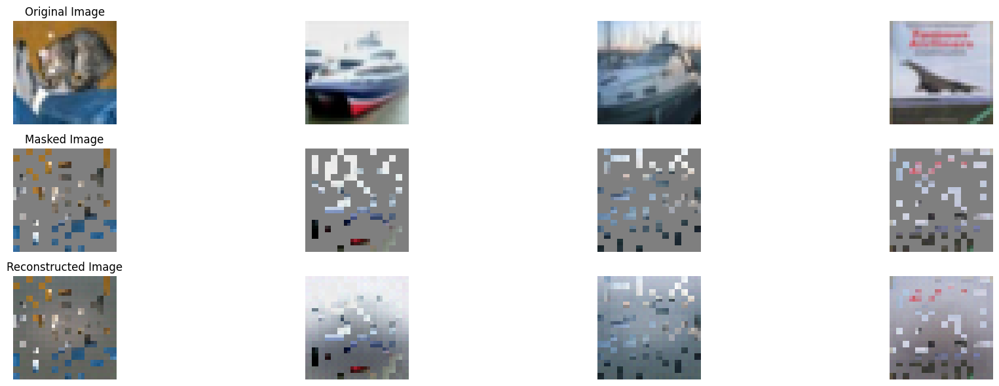

100%|██████████| 196/196 [01:00<00:00,  3.23it/s]


In epoch 18, average traning loss is 0.13620970132095472.
=================== EPOCH:  18  ===================


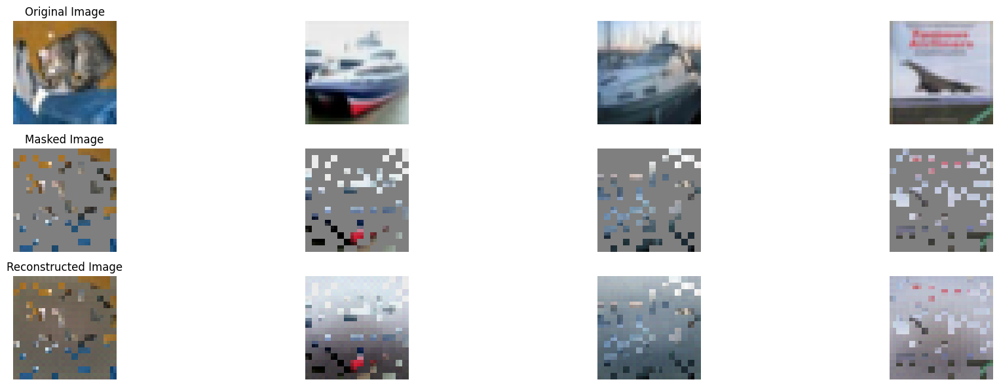

100%|██████████| 196/196 [01:00<00:00,  3.24it/s]


In epoch 19, average traning loss is 0.13167473369715166.
=================== EPOCH:  19  ===================


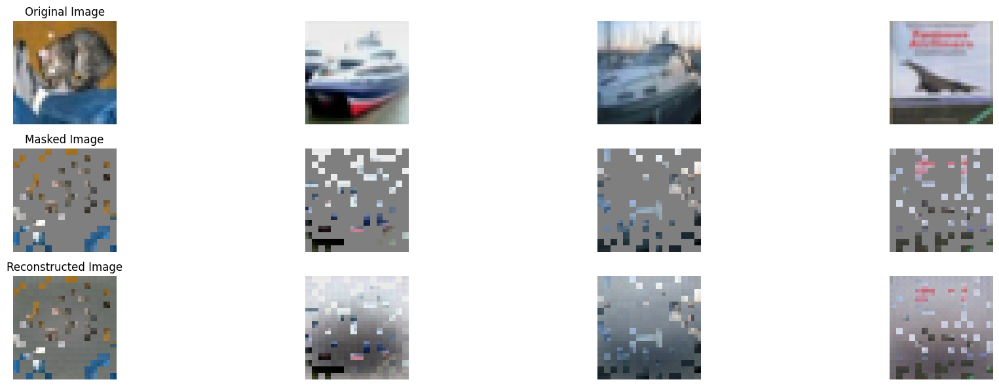

100%|██████████| 196/196 [01:00<00:00,  3.25it/s]


In epoch 20, average traning loss is 0.129025880133315.
=================== EPOCH:  20  ===================


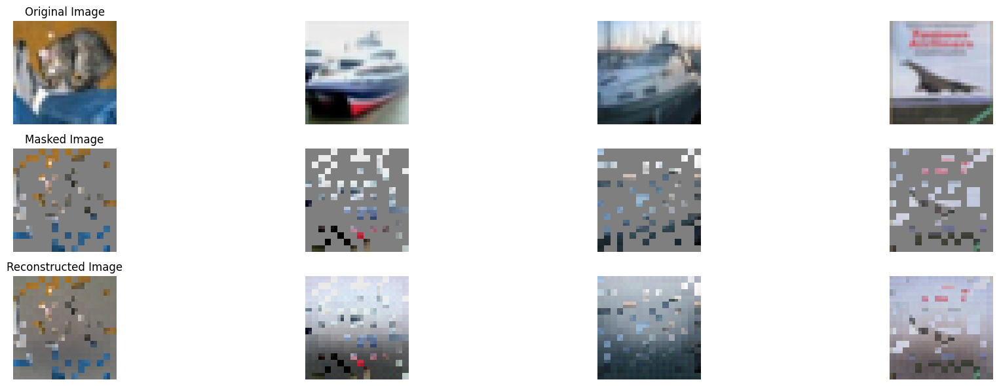

100%|██████████| 196/196 [00:59<00:00,  3.29it/s]


In epoch 21, average traning loss is 0.12718668880359252.
=================== EPOCH:  21  ===================


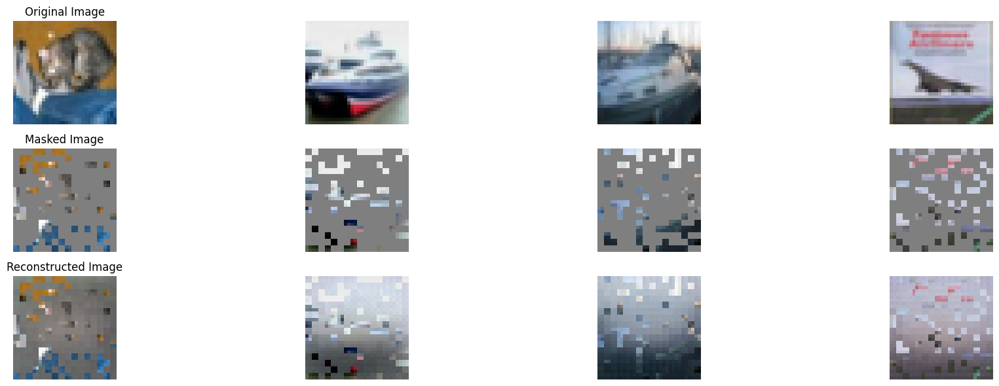

100%|██████████| 196/196 [01:00<00:00,  3.22it/s]


In epoch 22, average traning loss is 0.12623243033885956.
=================== EPOCH:  22  ===================


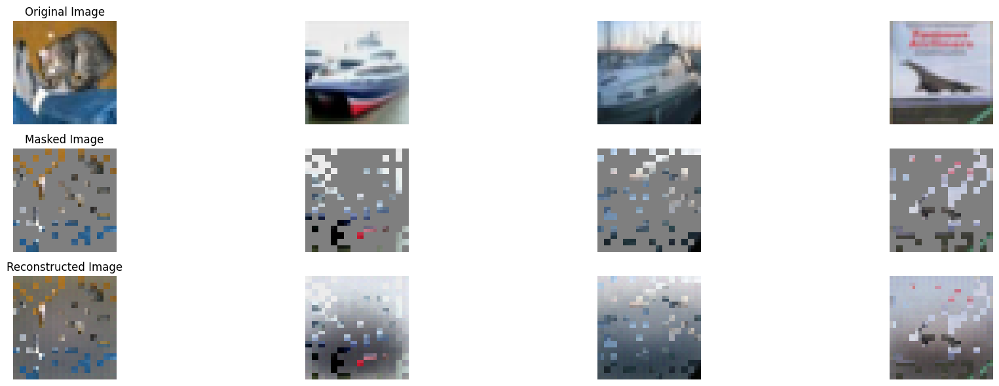

100%|██████████| 196/196 [01:00<00:00,  3.22it/s]


In epoch 23, average traning loss is 0.1249795388430357.
=================== EPOCH:  23  ===================


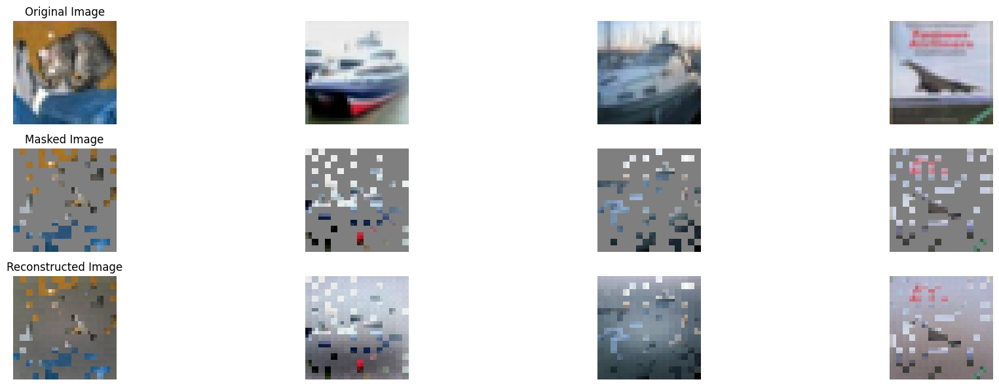

100%|██████████| 196/196 [01:00<00:00,  3.22it/s]


In epoch 24, average traning loss is 0.12410671651667478.
=================== EPOCH:  24  ===================


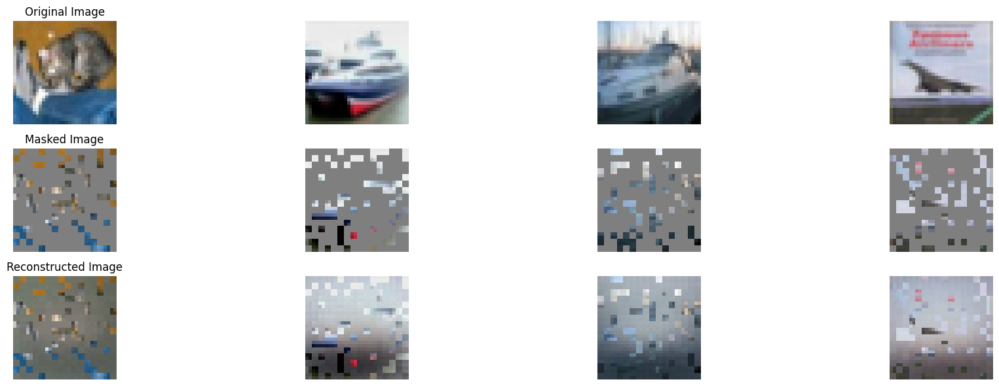

100%|██████████| 196/196 [01:00<00:00,  3.23it/s]


In epoch 25, average traning loss is 0.12388186856191985.
=================== EPOCH:  25  ===================


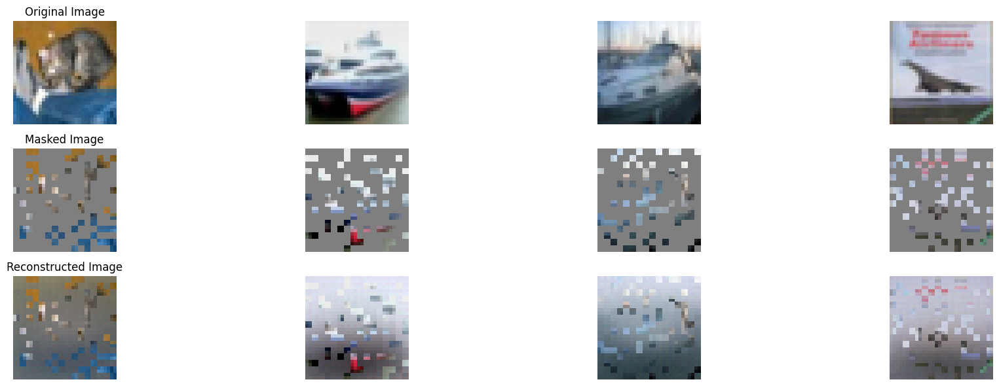

100%|██████████| 196/196 [01:00<00:00,  3.23it/s]


In epoch 26, average traning loss is 0.12290286941795933.
=================== EPOCH:  26  ===================


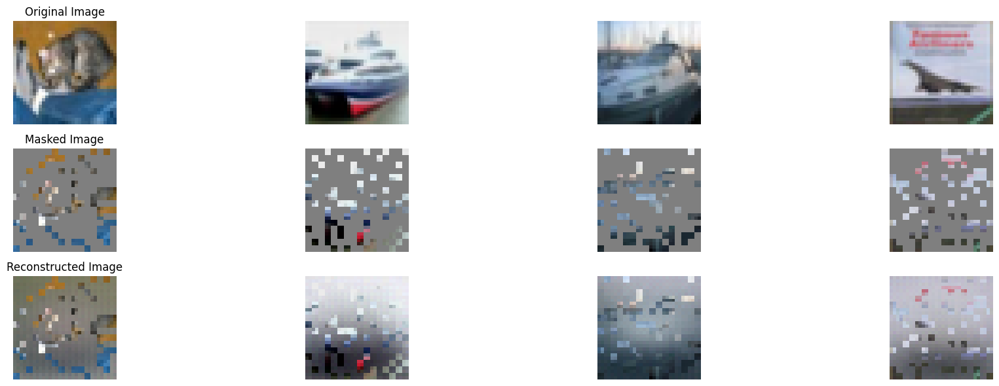

100%|██████████| 196/196 [01:00<00:00,  3.23it/s]


In epoch 27, average traning loss is 0.12211435280588208.
=================== EPOCH:  27  ===================


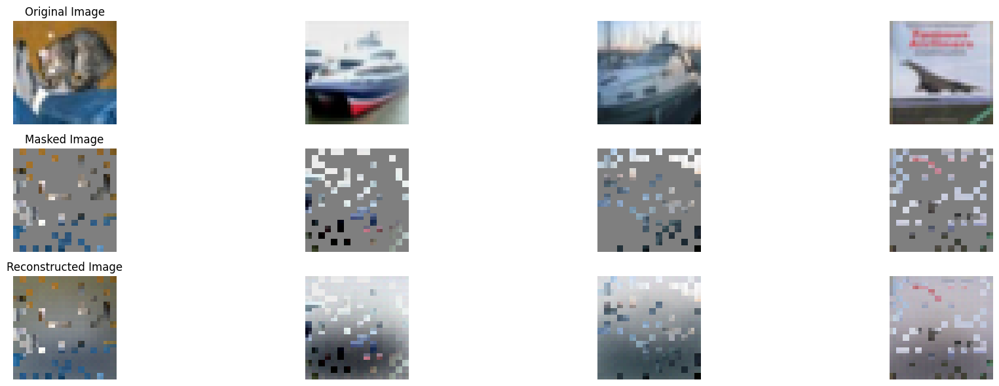

100%|██████████| 196/196 [01:00<00:00,  3.23it/s]


In epoch 28, average traning loss is 0.1209597825928002.
=================== EPOCH:  28  ===================


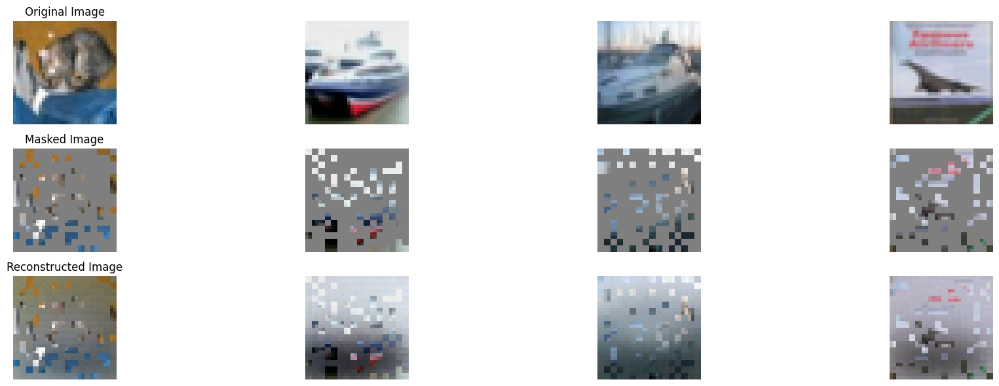

100%|██████████| 196/196 [01:00<00:00,  3.24it/s]


In epoch 29, average traning loss is 0.11921015492051232.
=================== EPOCH:  29  ===================


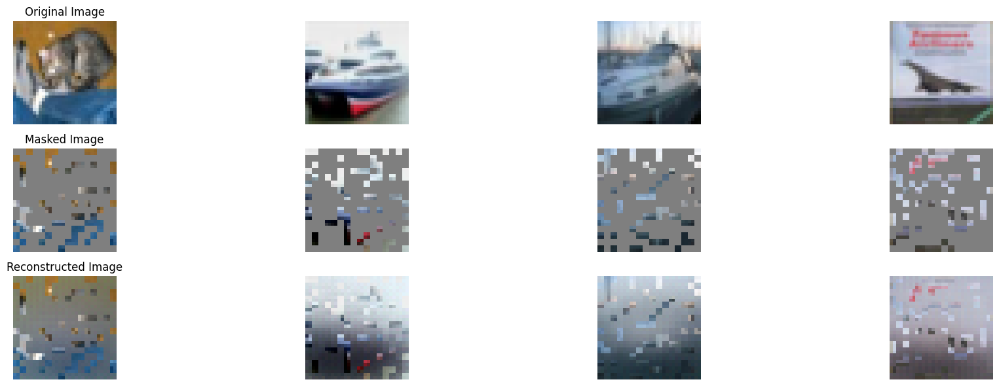

100%|██████████| 196/196 [01:00<00:00,  3.23it/s]


In epoch 30, average traning loss is 0.11666442161159855.
=================== EPOCH:  30  ===================


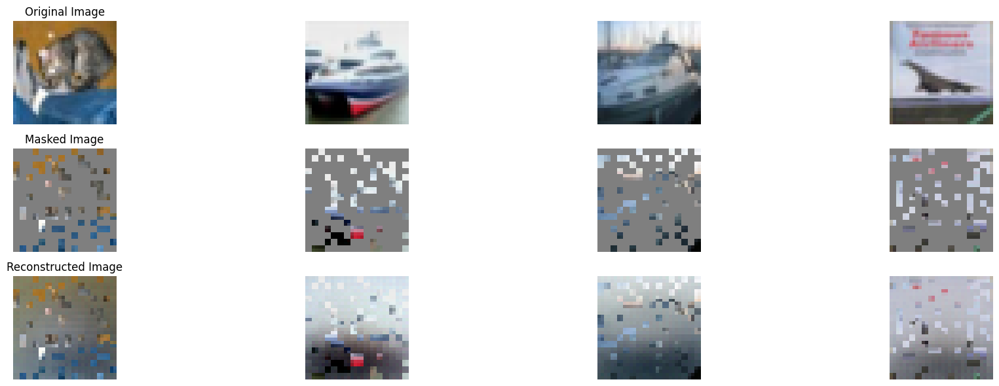

100%|██████████| 196/196 [01:00<00:00,  3.24it/s]


In epoch 31, average traning loss is 0.11463628131516125.
=================== EPOCH:  31  ===================


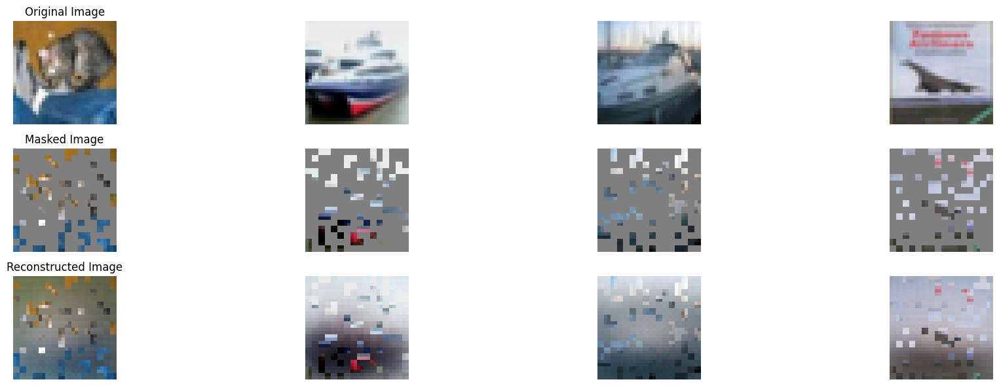

100%|██████████| 196/196 [01:00<00:00,  3.21it/s]


In epoch 32, average traning loss is 0.113022171150969.
=================== EPOCH:  32  ===================


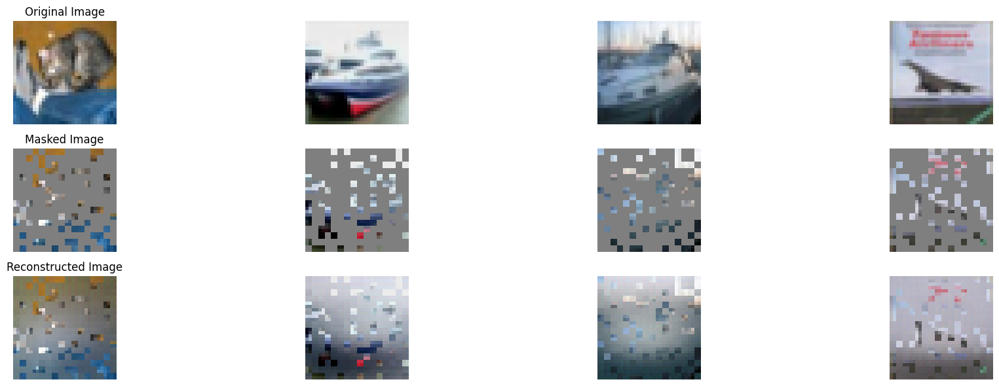

100%|██████████| 196/196 [01:00<00:00,  3.24it/s]


In epoch 33, average traning loss is 0.11153132533084373.
=================== EPOCH:  33  ===================


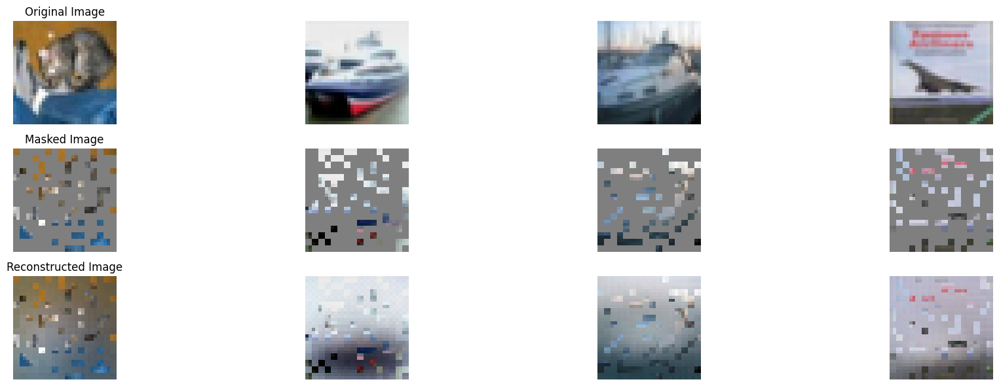

100%|██████████| 196/196 [01:00<00:00,  3.22it/s]


In epoch 34, average traning loss is 0.11033103196900718.
=================== EPOCH:  34  ===================


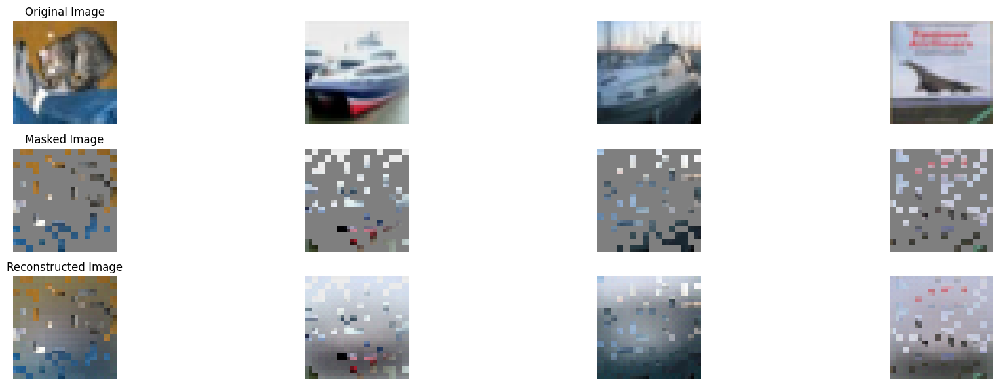

100%|██████████| 196/196 [00:59<00:00,  3.27it/s]


In epoch 35, average traning loss is 0.1084438993842626.
=================== EPOCH:  35  ===================


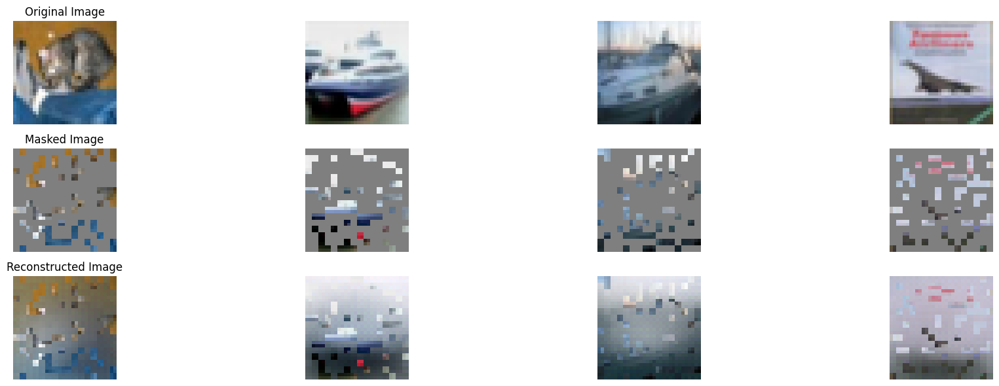

100%|██████████| 196/196 [01:00<00:00,  3.26it/s]


In epoch 36, average traning loss is 0.10724982322782886.
=================== EPOCH:  36  ===================


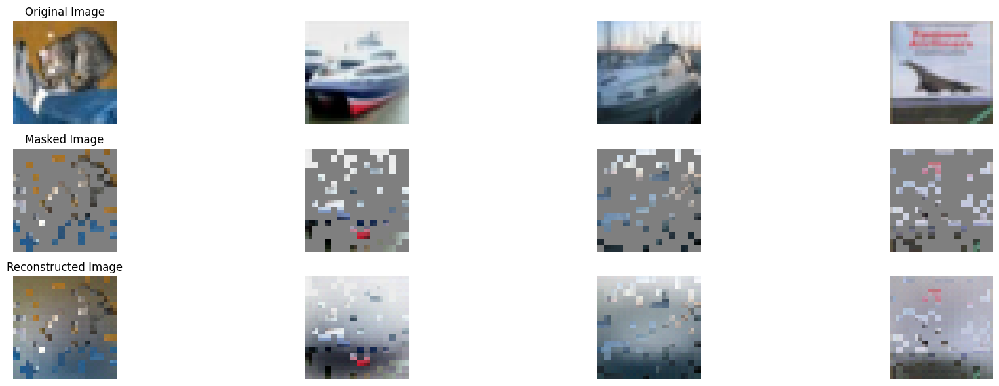

100%|██████████| 196/196 [01:01<00:00,  3.19it/s]


In epoch 37, average traning loss is 0.10614889411597836.
=================== EPOCH:  37  ===================


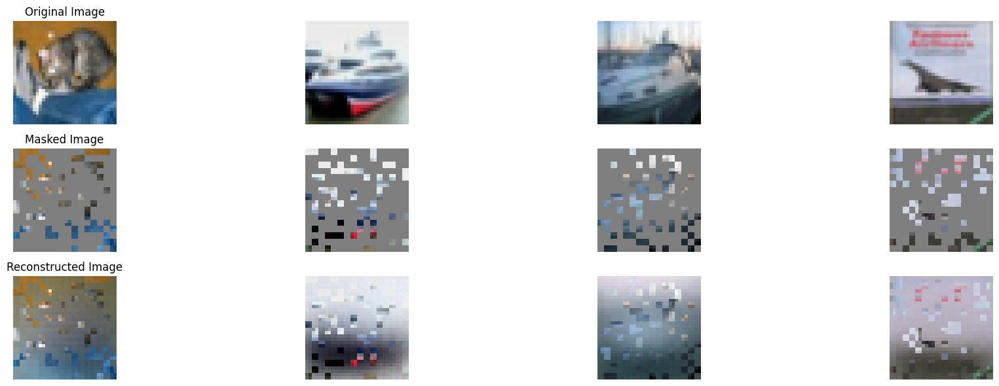

100%|██████████| 196/196 [01:00<00:00,  3.23it/s]


In epoch 38, average traning loss is 0.10475041340960532.
=================== EPOCH:  38  ===================


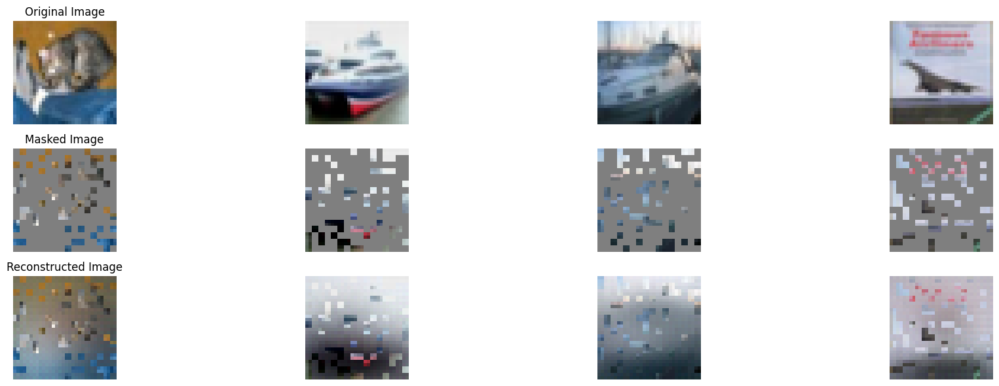

100%|██████████| 196/196 [01:00<00:00,  3.25it/s]


In epoch 39, average traning loss is 0.10344005052988627.
=================== EPOCH:  39  ===================


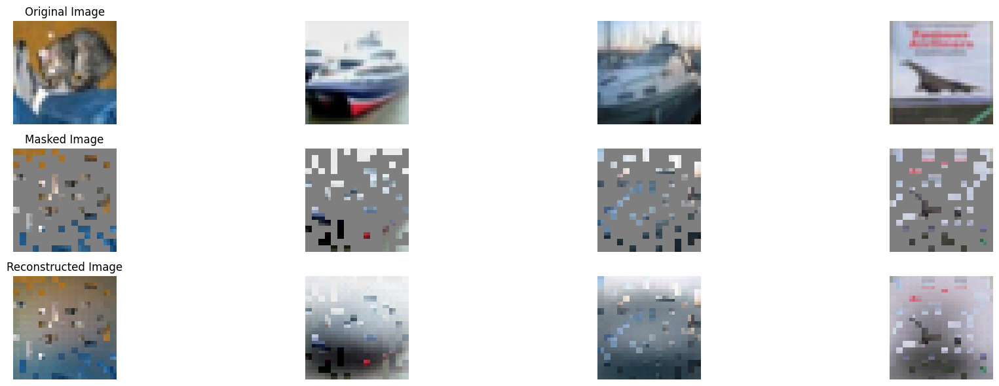

100%|██████████| 196/196 [01:00<00:00,  3.27it/s]


In epoch 40, average traning loss is 0.10233611450055424.
=================== EPOCH:  40  ===================


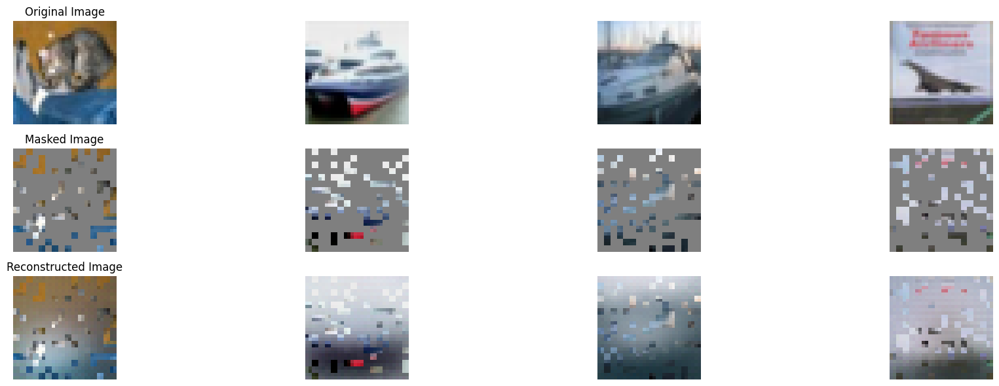

100%|██████████| 196/196 [01:01<00:00,  3.21it/s]


In epoch 41, average traning loss is 0.1010668330198648.
=================== EPOCH:  41  ===================


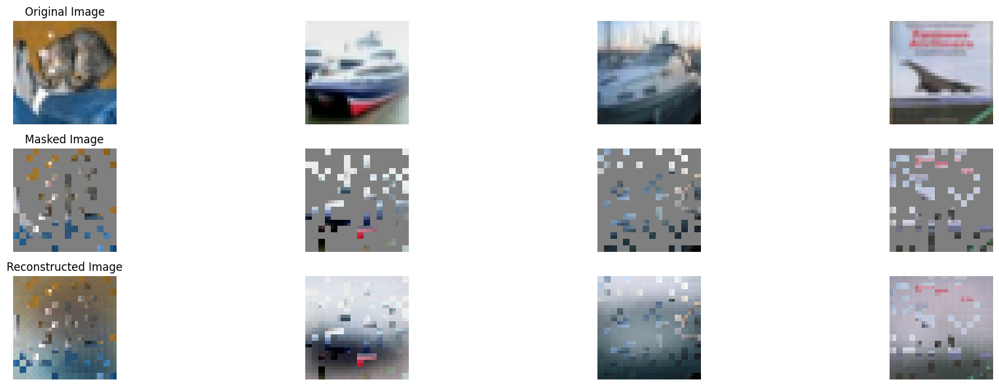

100%|██████████| 196/196 [00:59<00:00,  3.28it/s]


In epoch 42, average traning loss is 0.09962501631555509.
=================== EPOCH:  42  ===================


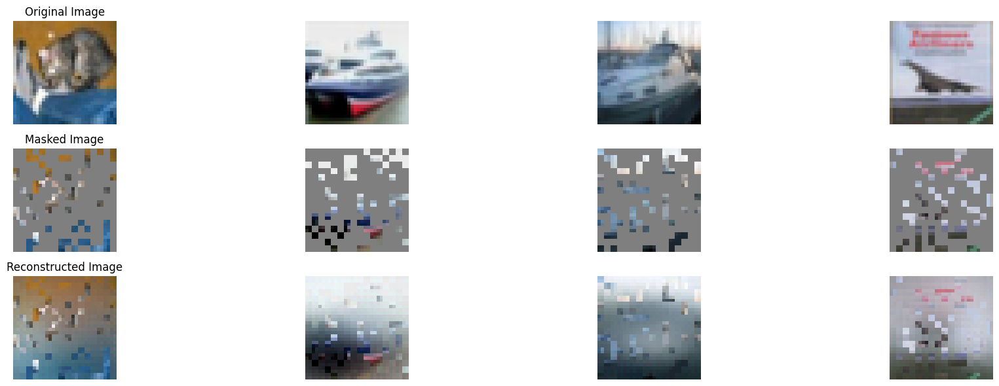

100%|██████████| 196/196 [01:01<00:00,  3.21it/s]


In epoch 43, average traning loss is 0.09803372142570359.
=================== EPOCH:  43  ===================


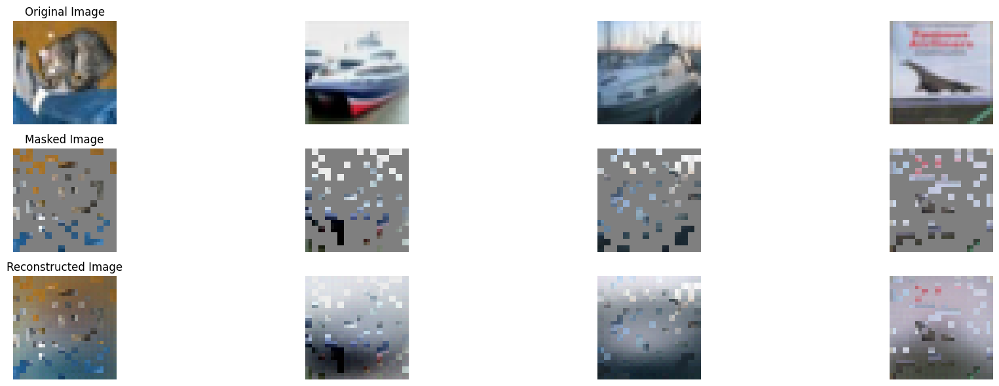

100%|██████████| 196/196 [01:00<00:00,  3.24it/s]


In epoch 44, average traning loss is 0.09670821927031692.
=================== EPOCH:  44  ===================


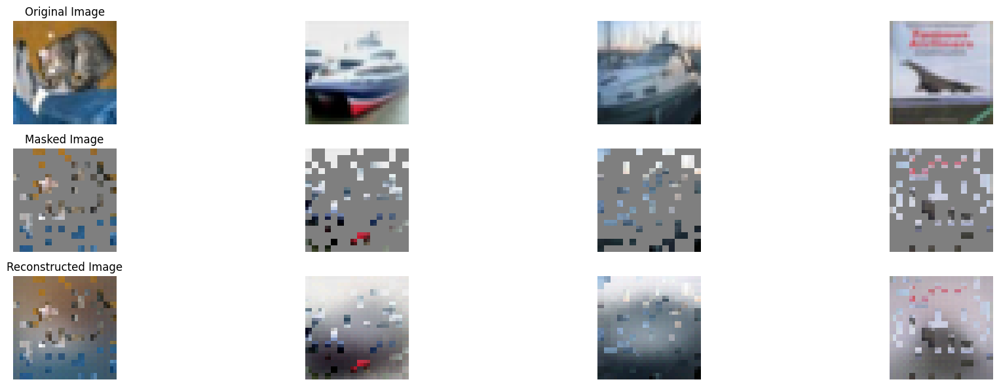

100%|██████████| 196/196 [00:59<00:00,  3.29it/s]


In epoch 45, average traning loss is 0.09529229192709436.
=================== EPOCH:  45  ===================


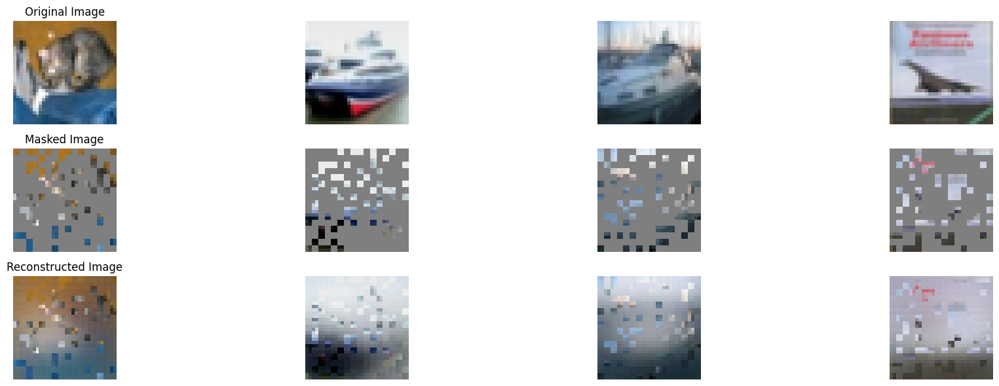

100%|██████████| 196/196 [01:00<00:00,  3.25it/s]


In epoch 46, average traning loss is 0.09397537291658167.
=================== EPOCH:  46  ===================


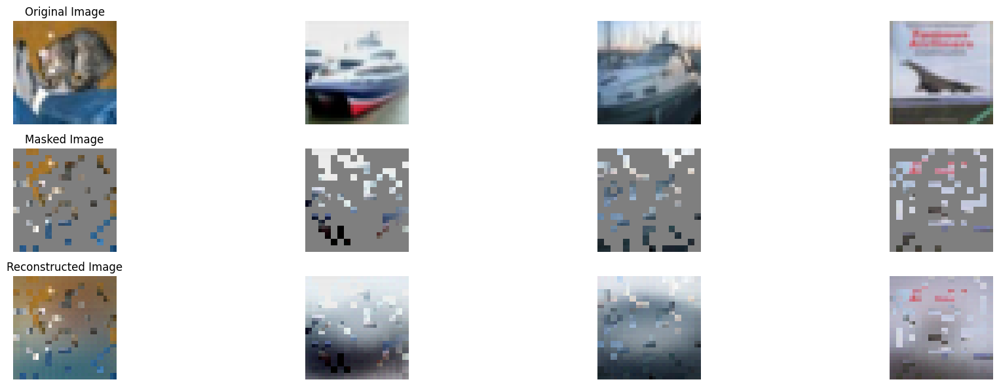

100%|██████████| 196/196 [00:59<00:00,  3.29it/s]


In epoch 47, average traning loss is 0.09276642239823633.
=================== EPOCH:  47  ===================


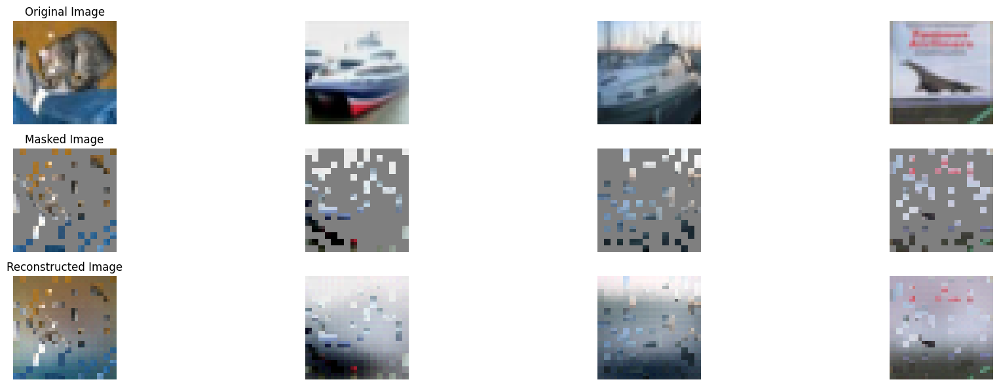

100%|██████████| 196/196 [01:00<00:00,  3.22it/s]


In epoch 48, average traning loss is 0.09145278000862014.
=================== EPOCH:  48  ===================


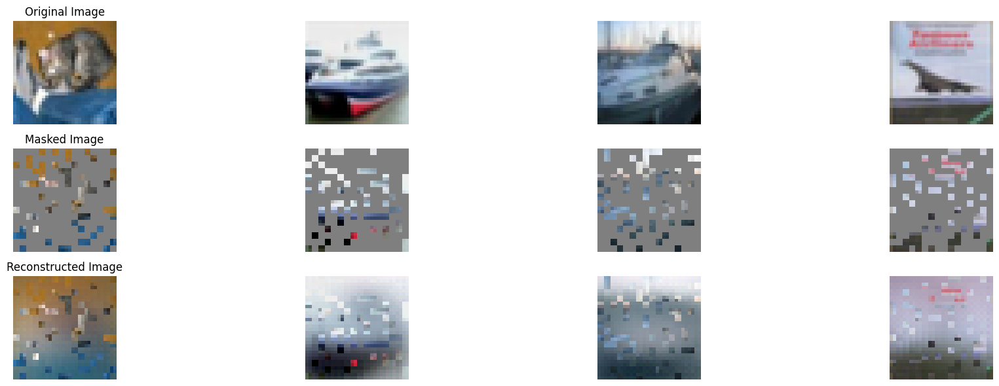

100%|██████████| 196/196 [01:00<00:00,  3.24it/s]


In epoch 49, average traning loss is 0.09013316423004987.
=================== EPOCH:  49  ===================


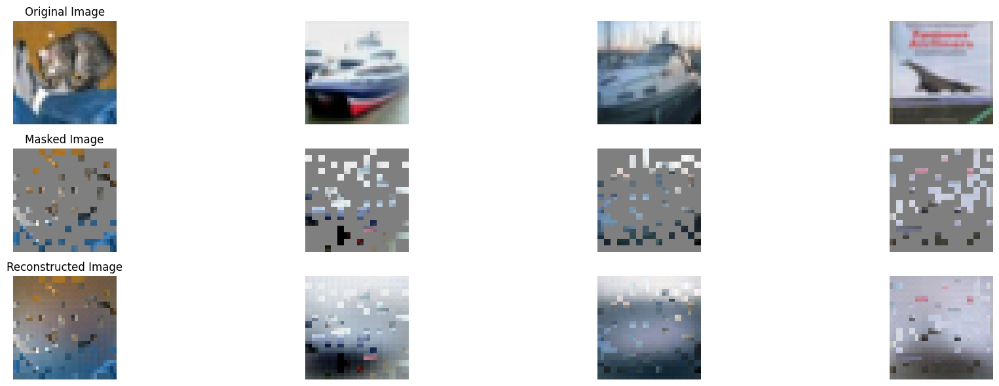

100%|██████████| 196/196 [01:00<00:00,  3.26it/s]


In epoch 50, average traning loss is 0.08898257270303307.
=================== EPOCH:  50  ===================


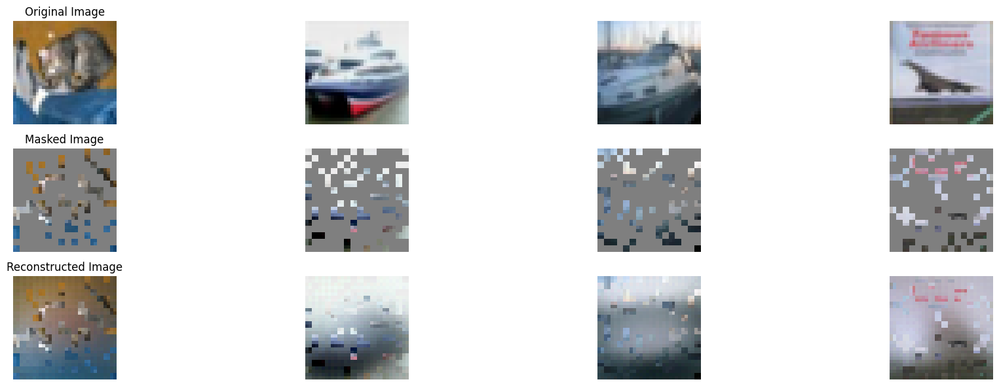

100%|██████████| 196/196 [01:00<00:00,  3.22it/s]


In epoch 51, average traning loss is 0.08760738969609445.
=================== EPOCH:  51  ===================


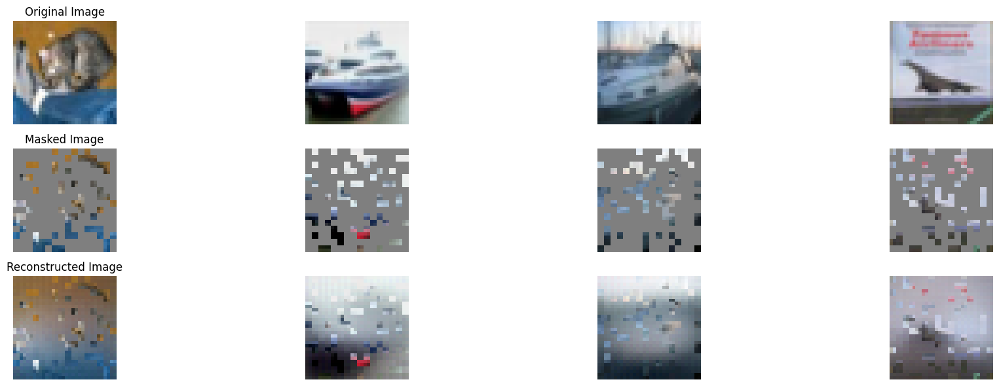

100%|██████████| 196/196 [00:59<00:00,  3.27it/s]


In epoch 52, average traning loss is 0.0863239086252086.
=================== EPOCH:  52  ===================


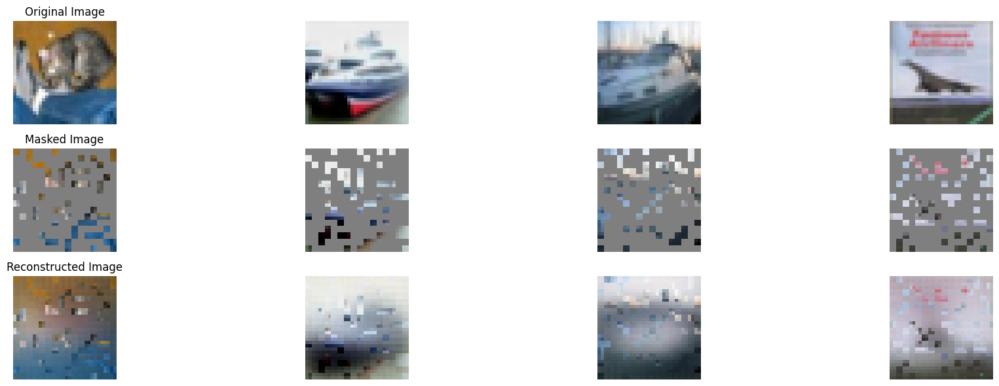

100%|██████████| 196/196 [00:59<00:00,  3.28it/s]


In epoch 53, average traning loss is 0.08506790715820935.
=================== EPOCH:  53  ===================


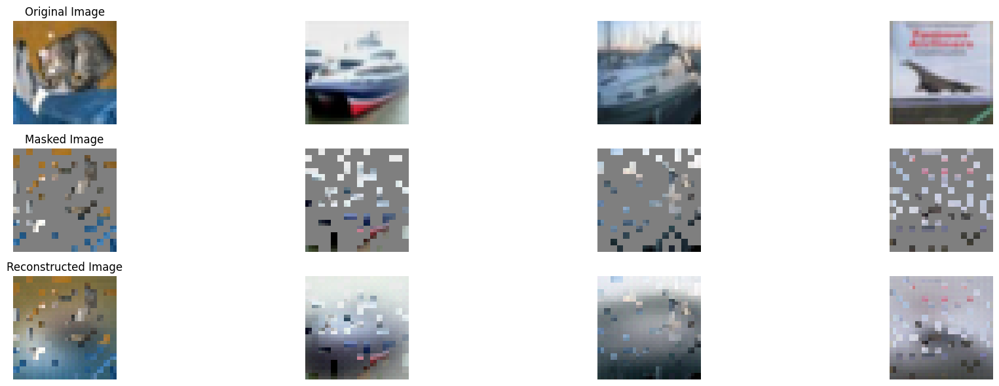

100%|██████████| 196/196 [00:58<00:00,  3.37it/s]


In epoch 54, average traning loss is 0.08350904502582793.
=================== EPOCH:  54  ===================


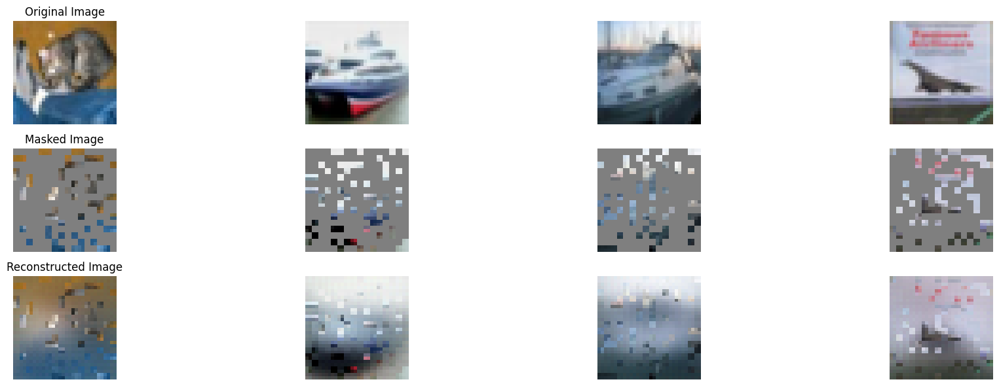

100%|██████████| 196/196 [00:58<00:00,  3.34it/s]


In epoch 55, average traning loss is 0.08216832737837519.
=================== EPOCH:  55  ===================


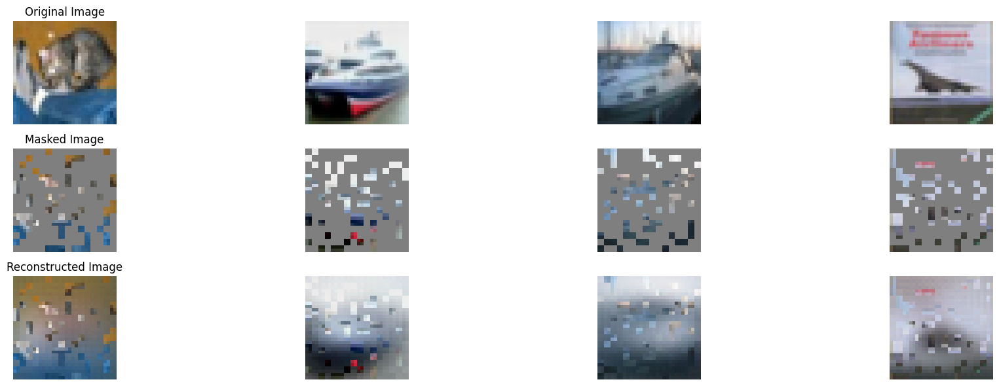

100%|██████████| 196/196 [00:58<00:00,  3.37it/s]


In epoch 56, average traning loss is 0.08081365646604373.
=================== EPOCH:  56  ===================


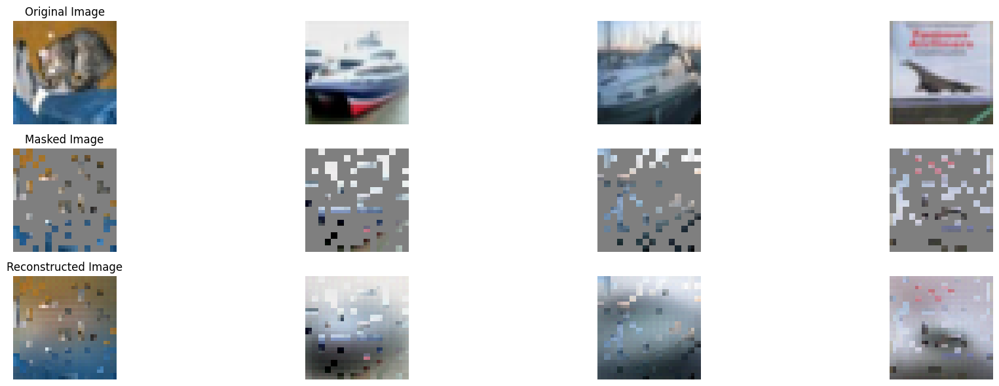

100%|██████████| 196/196 [00:58<00:00,  3.37it/s]


In epoch 57, average traning loss is 0.0786184871151131.
=================== EPOCH:  57  ===================


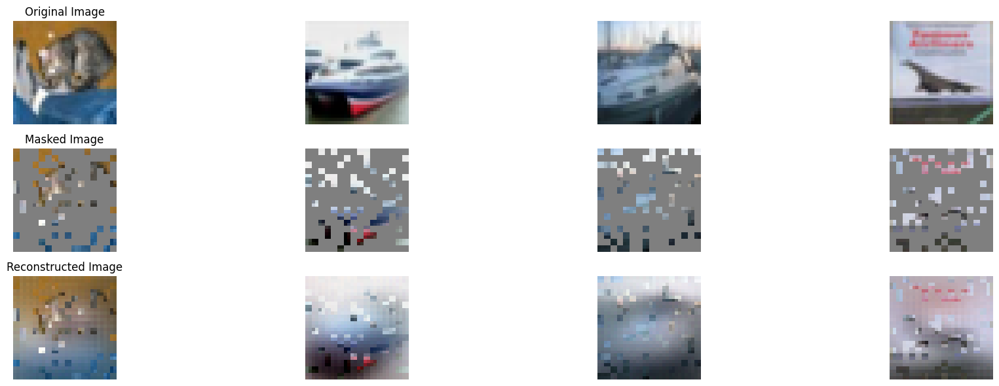

100%|██████████| 196/196 [00:57<00:00,  3.41it/s]


In epoch 58, average traning loss is 0.07291956131859702.
=================== EPOCH:  58  ===================


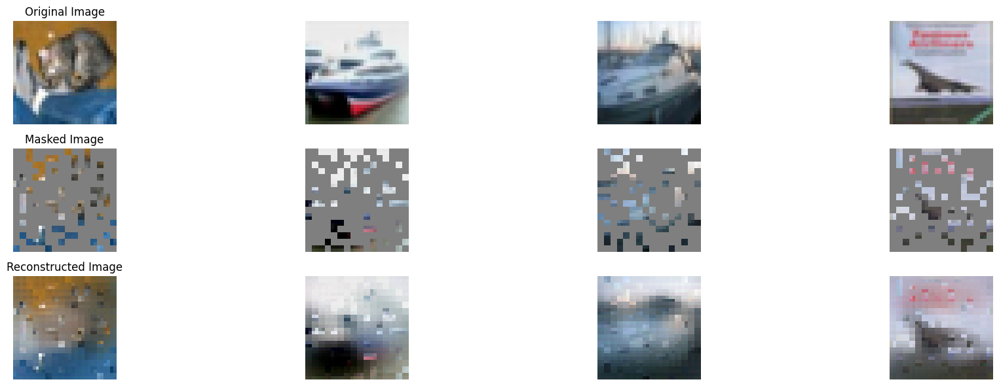

100%|██████████| 196/196 [00:57<00:00,  3.39it/s]


In epoch 59, average traning loss is 0.06757250690490615.
=================== EPOCH:  59  ===================


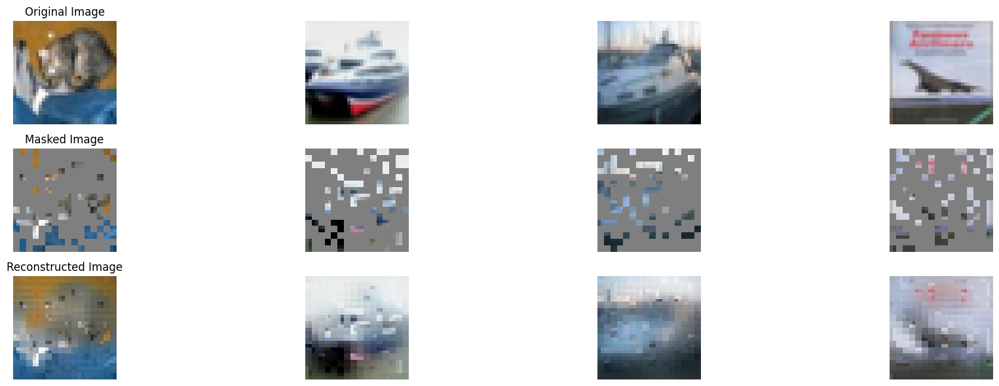

100%|██████████| 196/196 [00:57<00:00,  3.41it/s]


In epoch 60, average traning loss is 0.06541790305731857.
=================== EPOCH:  60  ===================


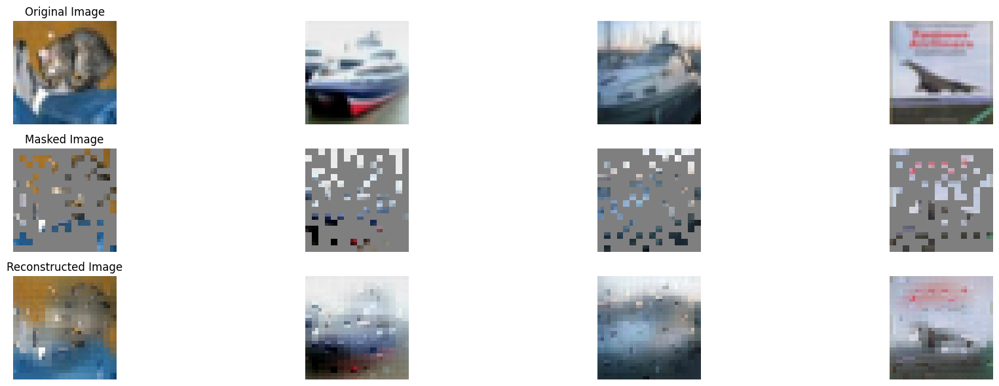

100%|██████████| 196/196 [00:57<00:00,  3.43it/s]


In epoch 61, average traning loss is 0.06392754507916314.
=================== EPOCH:  61  ===================


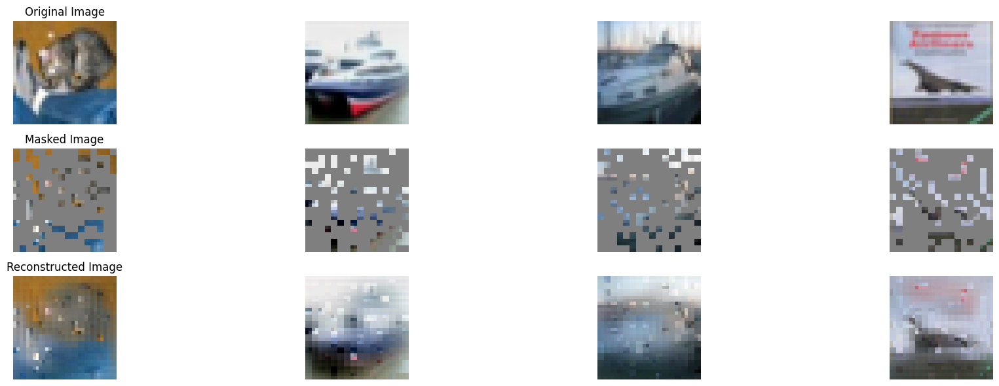

100%|██████████| 196/196 [00:57<00:00,  3.41it/s]


In epoch 62, average traning loss is 0.06265454982616464.
=================== EPOCH:  62  ===================


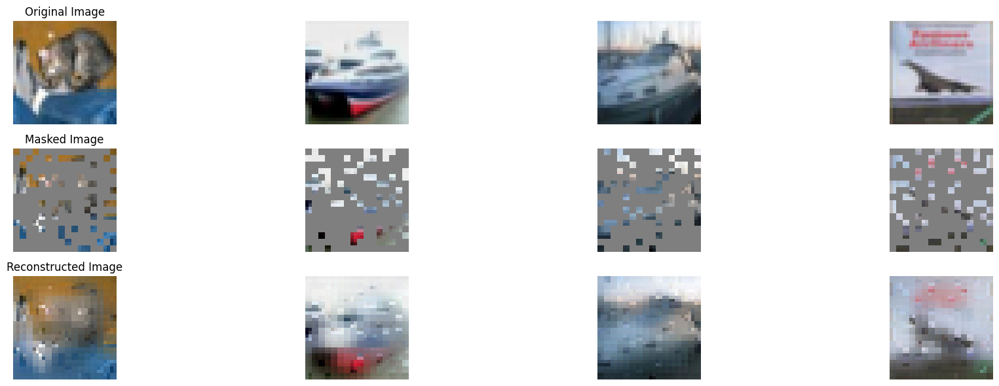

100%|██████████| 196/196 [00:59<00:00,  3.30it/s]


In epoch 63, average traning loss is 0.06111447247011321.
=================== EPOCH:  63  ===================


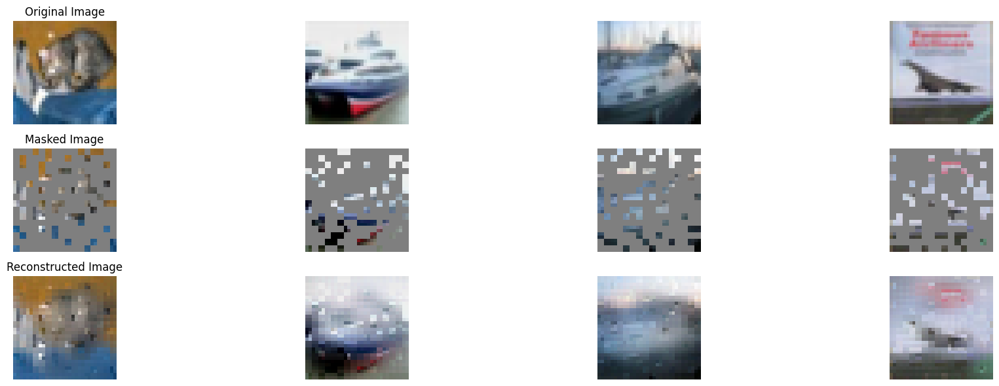

100%|██████████| 196/196 [00:59<00:00,  3.32it/s]


In epoch 64, average traning loss is 0.05971630119091394.
=================== EPOCH:  64  ===================


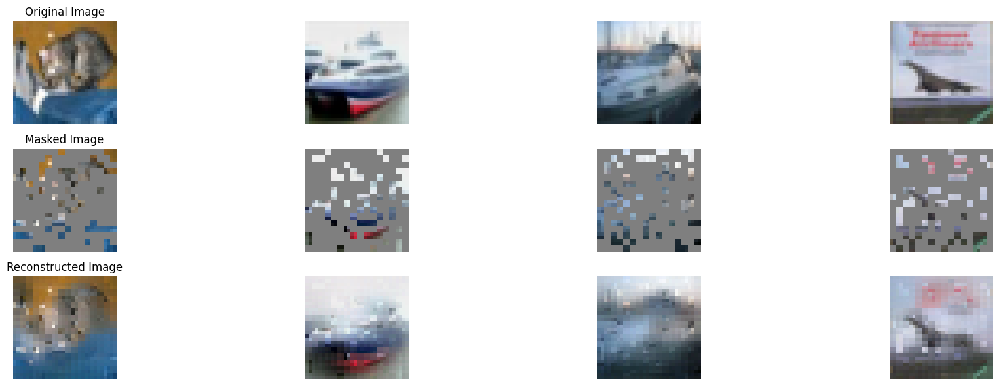

100%|██████████| 196/196 [00:57<00:00,  3.41it/s]


In epoch 65, average traning loss is 0.05826153328680262.
=================== EPOCH:  65  ===================


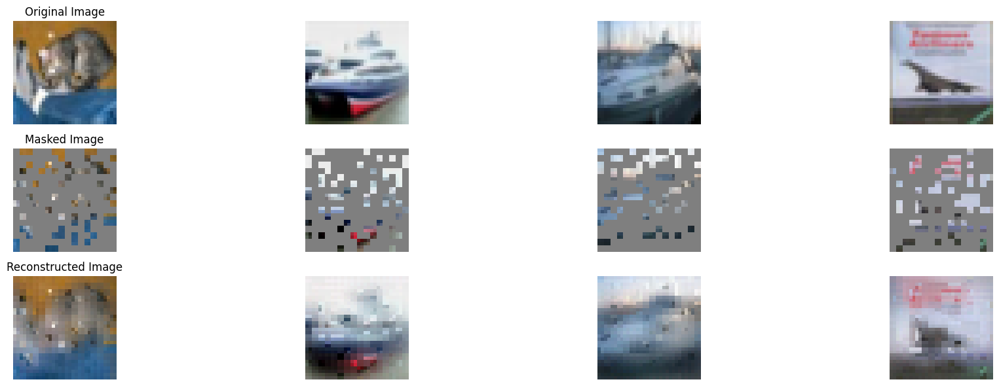

100%|██████████| 196/196 [00:58<00:00,  3.34it/s]


In epoch 66, average traning loss is 0.05694953112729958.
=================== EPOCH:  66  ===================


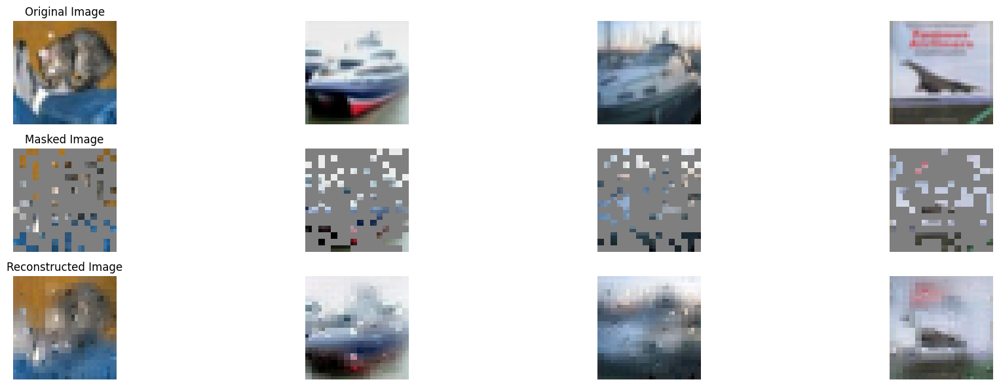

100%|██████████| 196/196 [00:58<00:00,  3.38it/s]


In epoch 67, average traning loss is 0.05563079632286515.
=================== EPOCH:  67  ===================


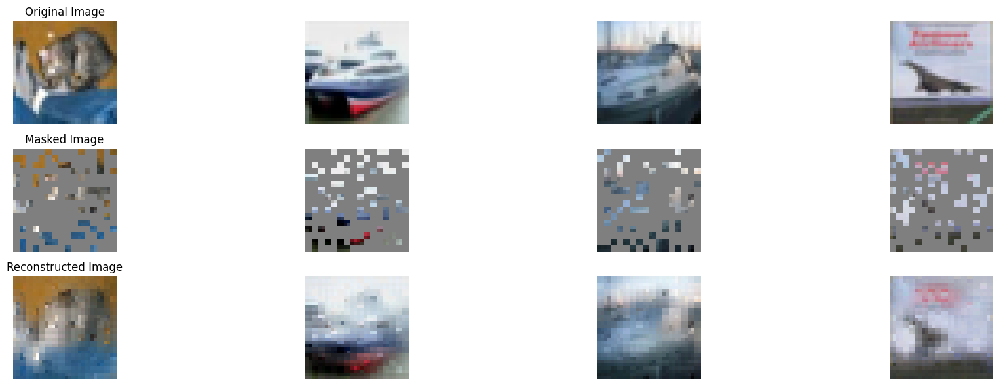

100%|██████████| 196/196 [00:59<00:00,  3.31it/s]


In epoch 68, average traning loss is 0.05446674650040816.
=================== EPOCH:  68  ===================


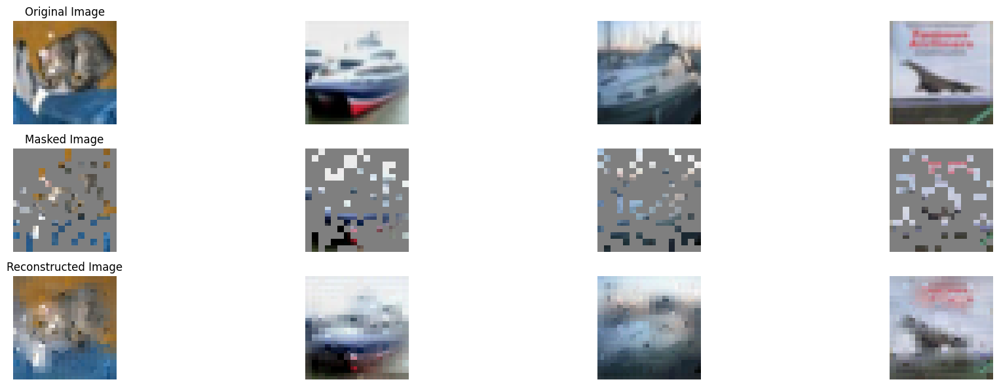

100%|██████████| 196/196 [00:59<00:00,  3.31it/s]


In epoch 69, average traning loss is 0.05379623417951623.
=================== EPOCH:  69  ===================


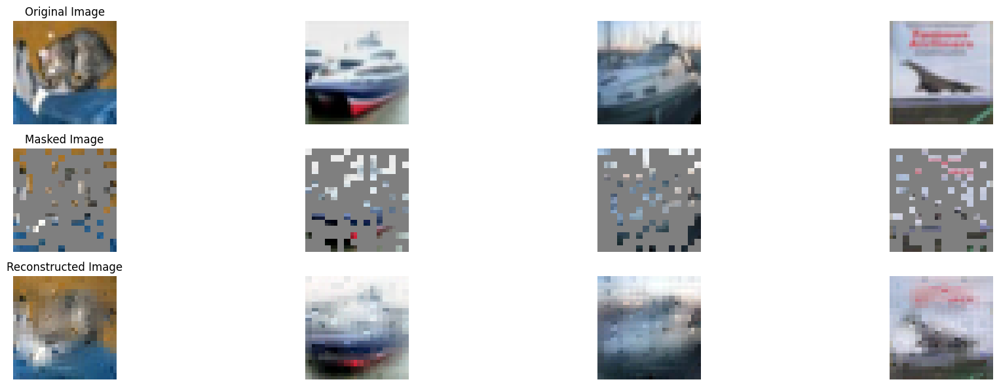

100%|██████████| 196/196 [00:58<00:00,  3.37it/s]


In epoch 70, average traning loss is 0.05315777539674725.
=================== EPOCH:  70  ===================


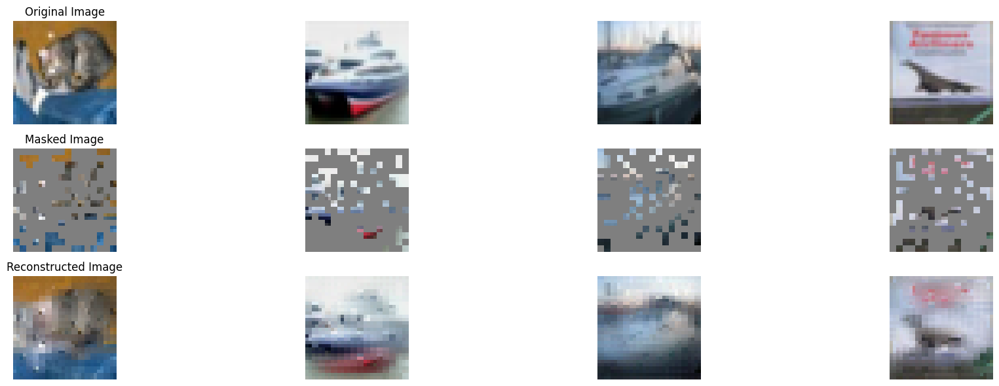

100%|██████████| 196/196 [00:58<00:00,  3.38it/s]


In epoch 71, average traning loss is 0.05256837691959678.
=================== EPOCH:  71  ===================


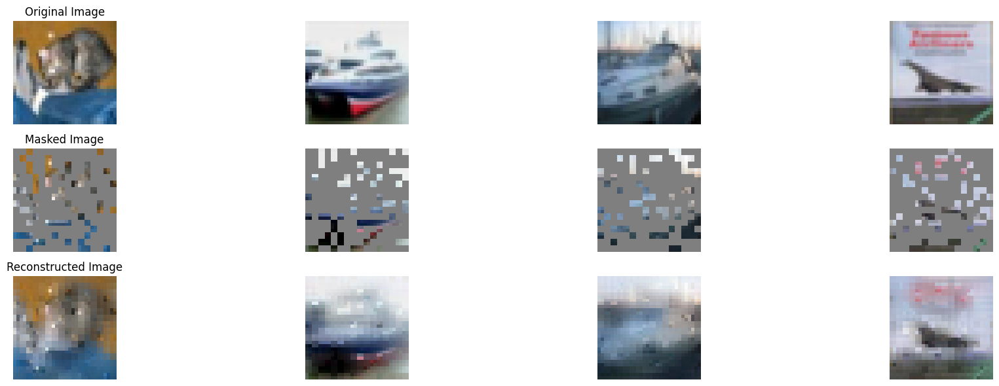

100%|██████████| 196/196 [00:57<00:00,  3.39it/s]


In epoch 72, average traning loss is 0.051929385154222955.
=================== EPOCH:  72  ===================


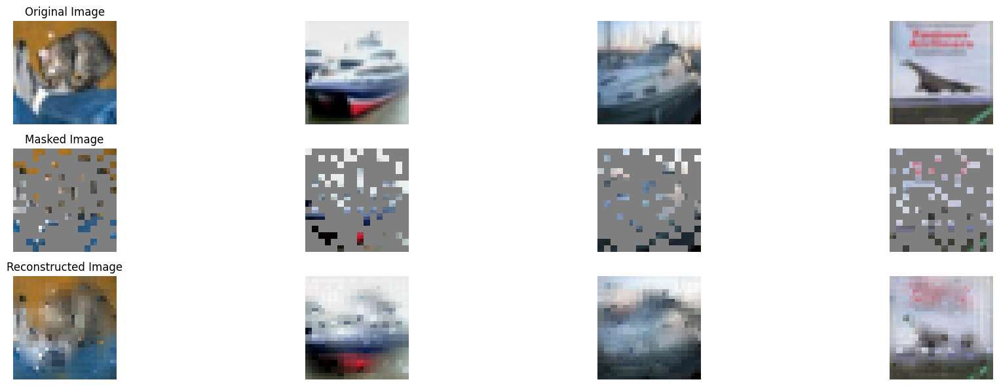

100%|██████████| 196/196 [00:58<00:00,  3.36it/s]


In epoch 73, average traning loss is 0.051468318347267956.
=================== EPOCH:  73  ===================


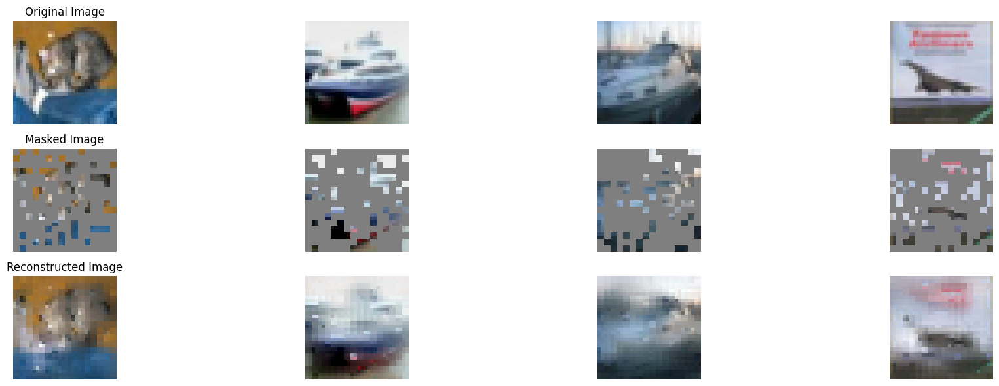

100%|██████████| 196/196 [00:58<00:00,  3.37it/s]


In epoch 74, average traning loss is 0.05092798793042193.
=================== EPOCH:  74  ===================


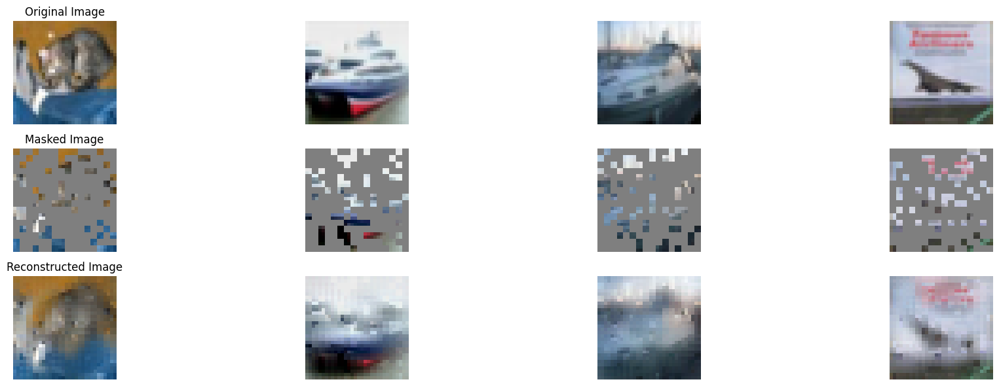

100%|██████████| 196/196 [01:00<00:00,  3.26it/s]


In epoch 75, average traning loss is 0.050378733143514515.
=================== EPOCH:  75  ===================


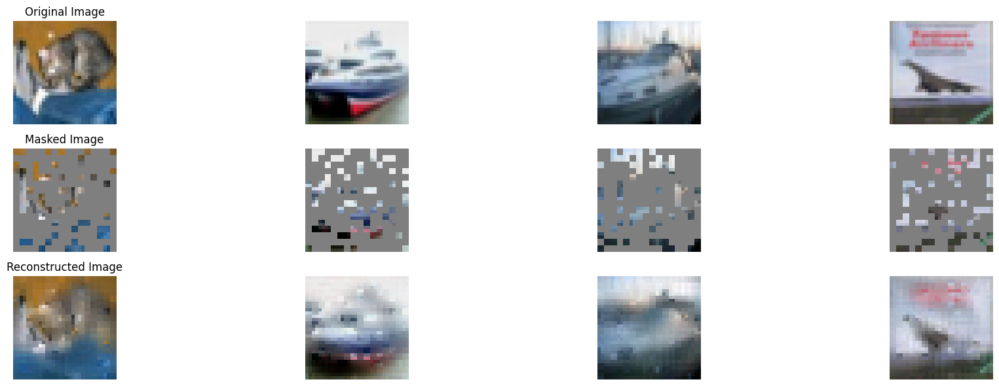

100%|██████████| 196/196 [00:59<00:00,  3.27it/s]


In epoch 76, average traning loss is 0.04983324221126279.
=================== EPOCH:  76  ===================


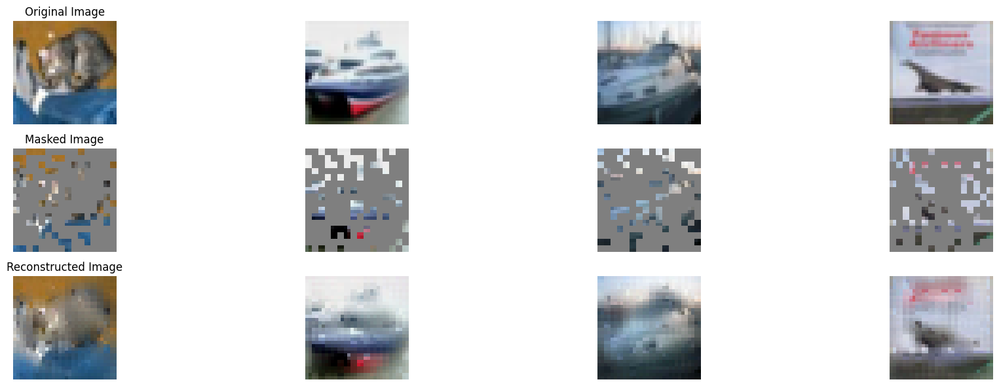

100%|██████████| 196/196 [01:00<00:00,  3.22it/s]


In epoch 77, average traning loss is 0.04951120905426084.
=================== EPOCH:  77  ===================


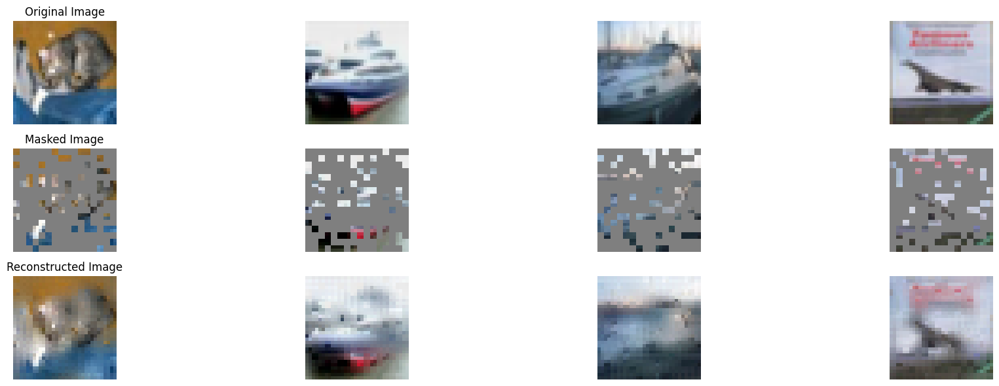

100%|██████████| 196/196 [01:00<00:00,  3.25it/s]


In epoch 78, average traning loss is 0.04896754089134688.
=================== EPOCH:  78  ===================


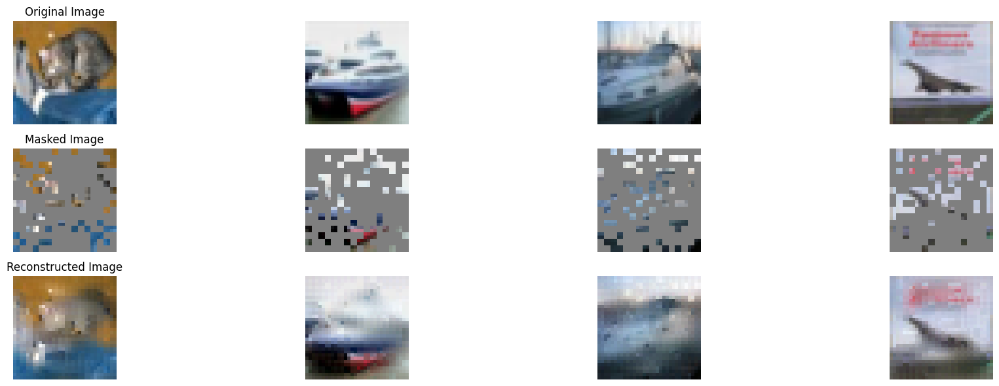

100%|██████████| 196/196 [01:00<00:00,  3.26it/s]


In epoch 79, average traning loss is 0.04855928938759833.
=================== EPOCH:  79  ===================


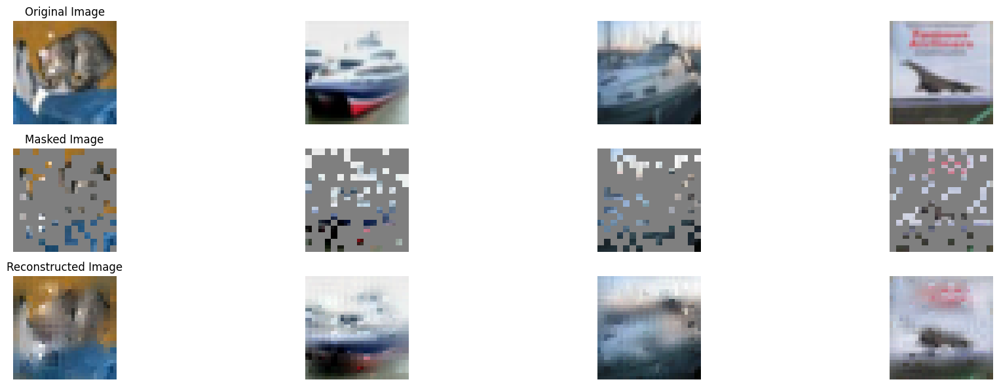

100%|██████████| 196/196 [01:00<00:00,  3.25it/s]


In epoch 80, average traning loss is 0.048070139954892954.
=================== EPOCH:  80  ===================


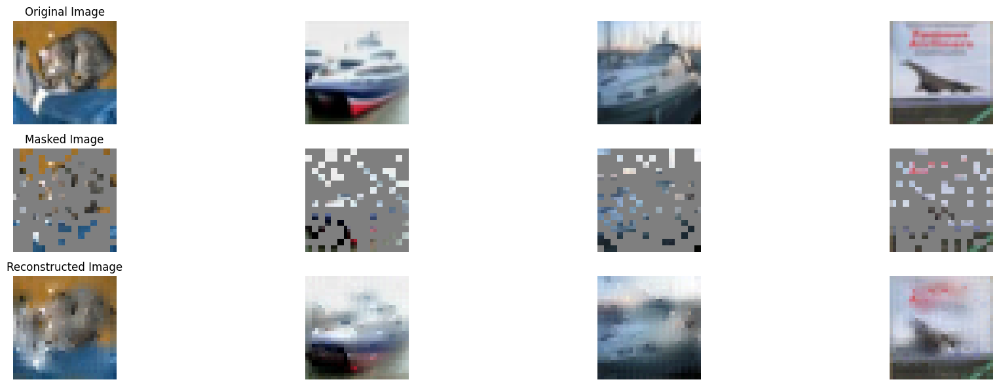

100%|██████████| 196/196 [01:00<00:00,  3.23it/s]


In epoch 81, average traning loss is 0.0477035147499065.
=================== EPOCH:  81  ===================


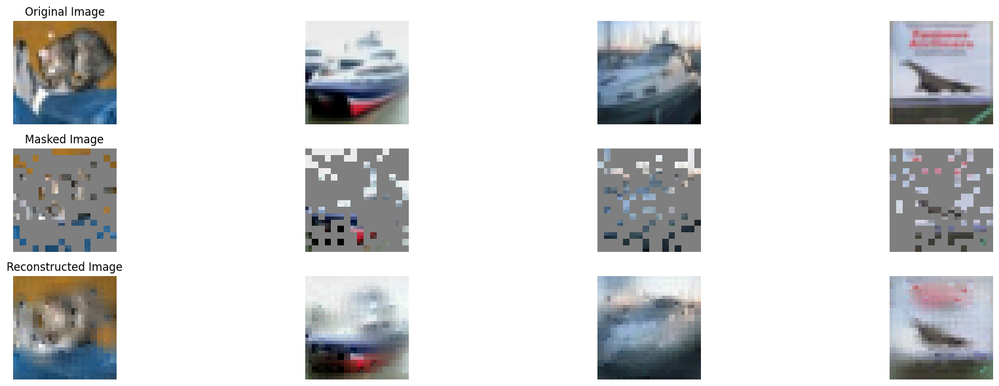

100%|██████████| 196/196 [01:00<00:00,  3.24it/s]


In epoch 82, average traning loss is 0.04734778436547031.
=================== EPOCH:  82  ===================


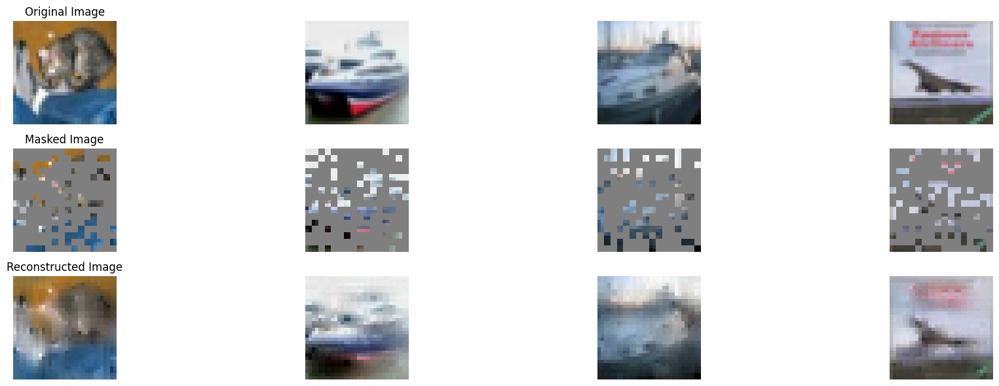

100%|██████████| 196/196 [01:00<00:00,  3.25it/s]


In epoch 83, average traning loss is 0.04697091974394054.
=================== EPOCH:  83  ===================


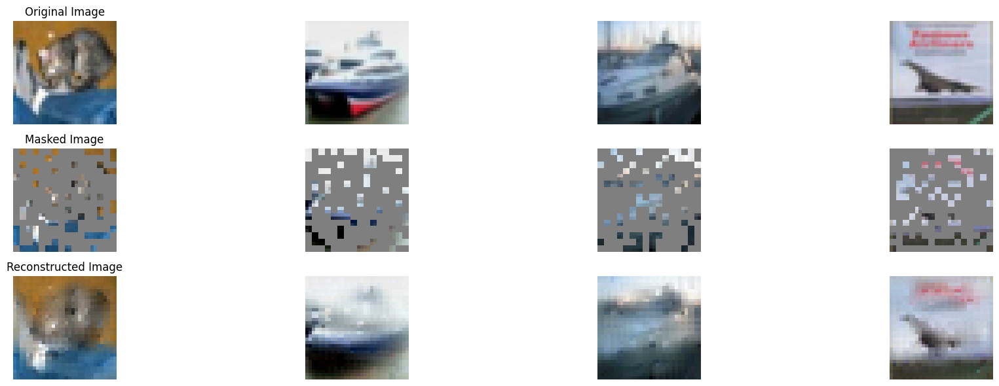

100%|██████████| 196/196 [01:00<00:00,  3.23it/s]


In epoch 84, average traning loss is 0.046539999202502014.
=================== EPOCH:  84  ===================


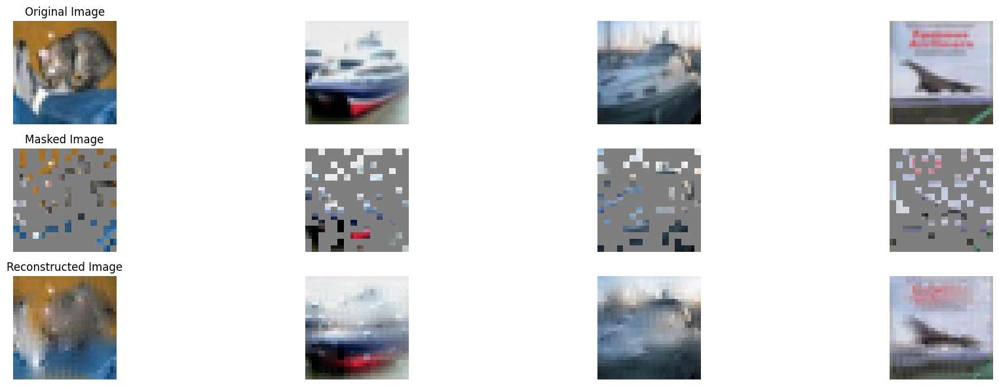

100%|██████████| 196/196 [01:01<00:00,  3.21it/s]


In epoch 85, average traning loss is 0.046168263868561814.
=================== EPOCH:  85  ===================


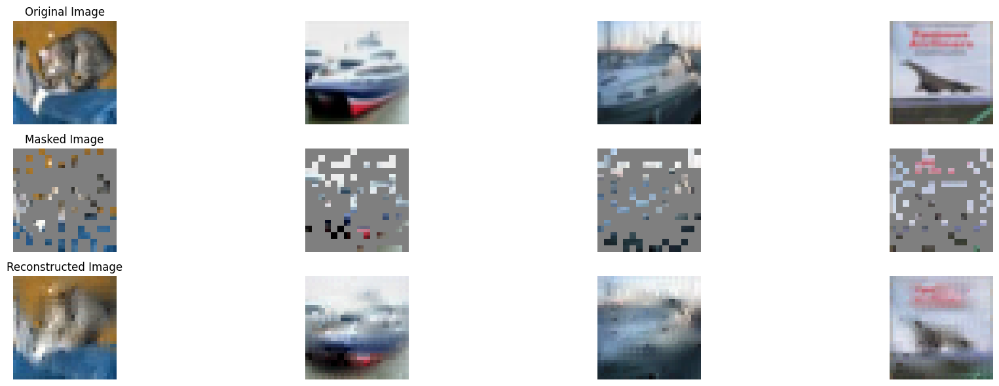

100%|██████████| 196/196 [00:58<00:00,  3.37it/s]


In epoch 86, average traning loss is 0.04607775507076663.
=================== EPOCH:  86  ===================


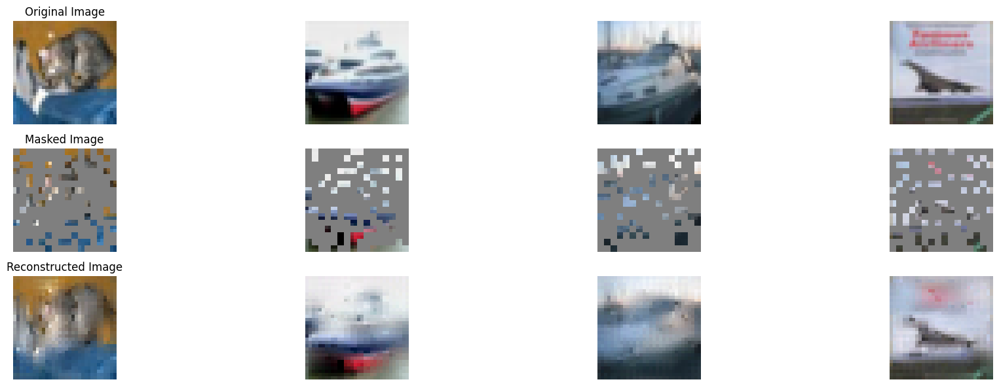

100%|██████████| 196/196 [01:01<00:00,  3.20it/s]


In epoch 87, average traning loss is 0.04576647954479772.
=================== EPOCH:  87  ===================


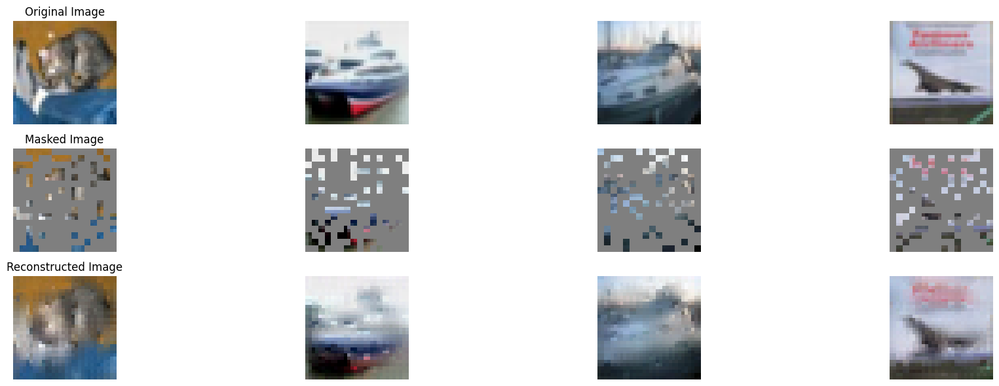

100%|██████████| 196/196 [00:59<00:00,  3.28it/s]


In epoch 88, average traning loss is 0.04551473573534465.
=================== EPOCH:  88  ===================


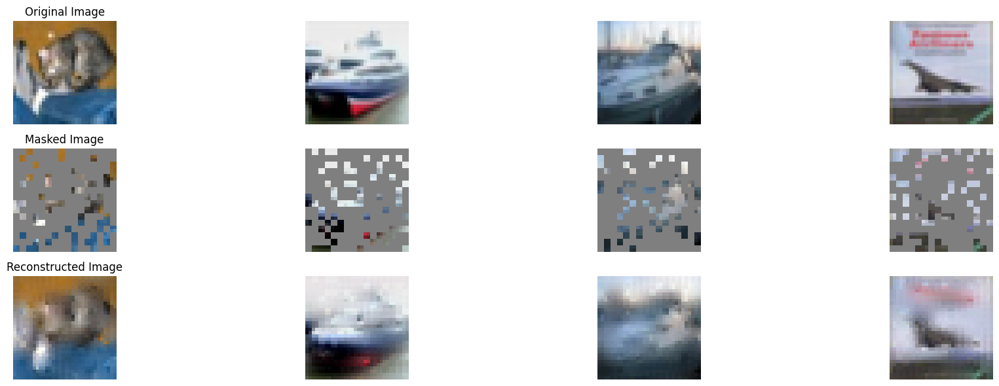

100%|██████████| 196/196 [01:01<00:00,  3.19it/s]


In epoch 89, average traning loss is 0.04520524393919171.
=================== EPOCH:  89  ===================


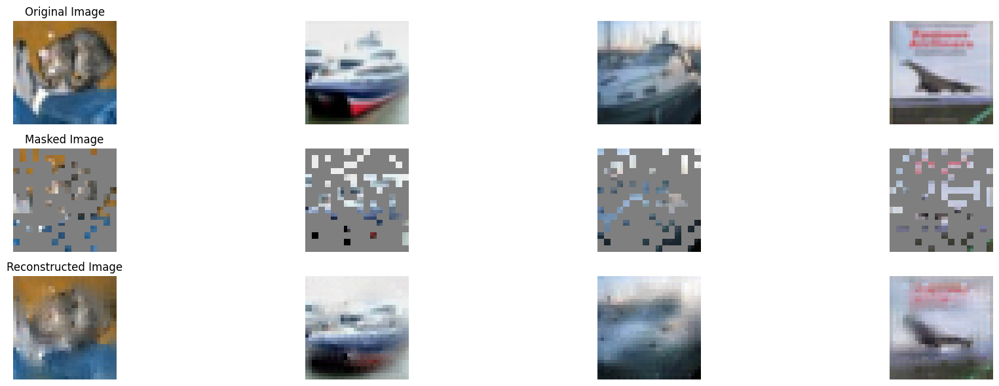

100%|██████████| 196/196 [00:59<00:00,  3.31it/s]


In epoch 90, average traning loss is 0.04491938323694832.
=================== EPOCH:  90  ===================


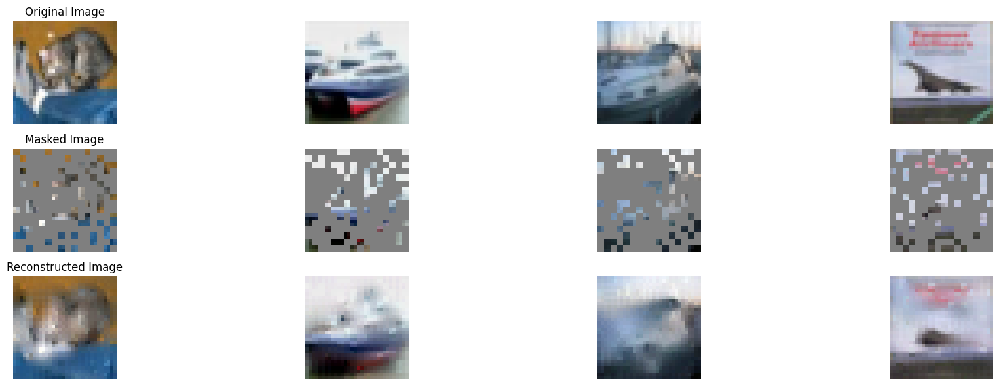

100%|██████████| 196/196 [00:59<00:00,  3.27it/s]


In epoch 91, average traning loss is 0.04471271154375709.
=================== EPOCH:  91  ===================


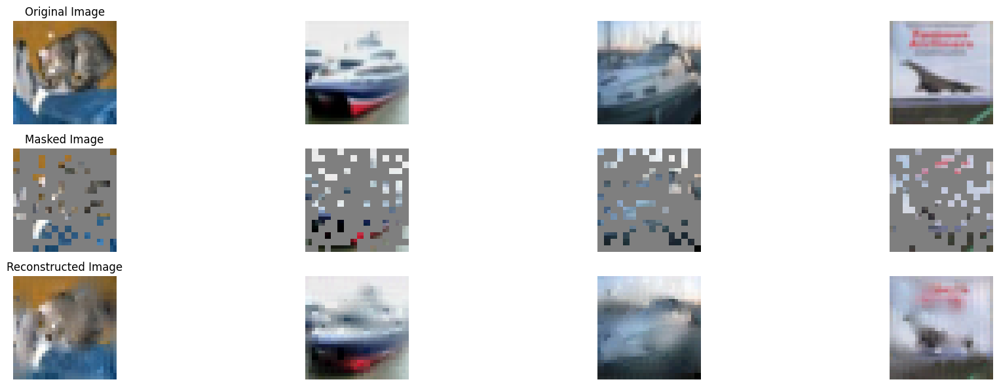

100%|██████████| 196/196 [00:59<00:00,  3.27it/s]


In epoch 92, average traning loss is 0.04456080336655889.
=================== EPOCH:  92  ===================


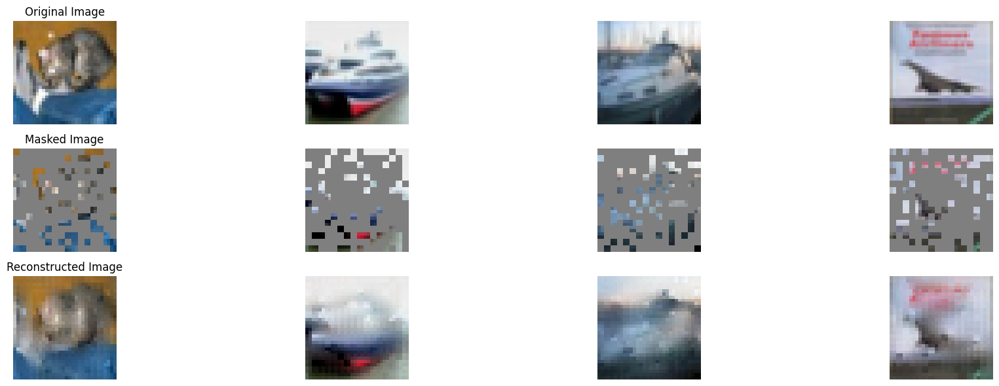

100%|██████████| 196/196 [00:59<00:00,  3.28it/s]


In epoch 93, average traning loss is 0.04428296332836759.
=================== EPOCH:  93  ===================


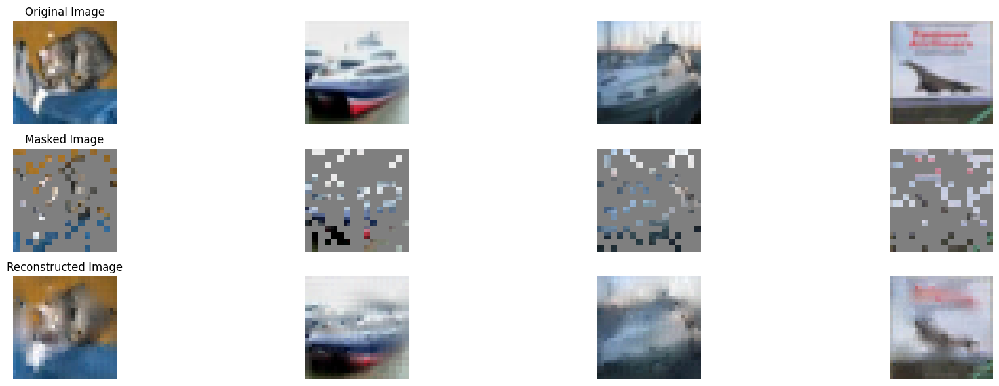

100%|██████████| 196/196 [00:59<00:00,  3.28it/s]


In epoch 94, average traning loss is 0.04409841506989026.
=================== EPOCH:  94  ===================


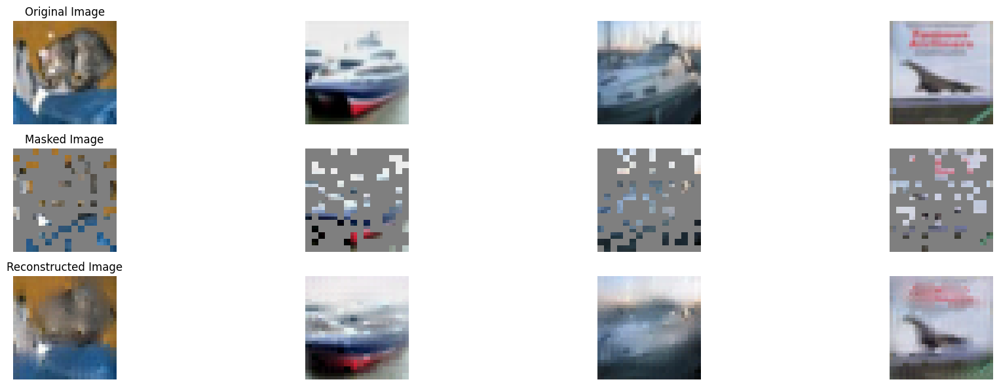

100%|██████████| 196/196 [00:58<00:00,  3.34it/s]


In epoch 95, average traning loss is 0.04403176966446395.
=================== EPOCH:  95  ===================


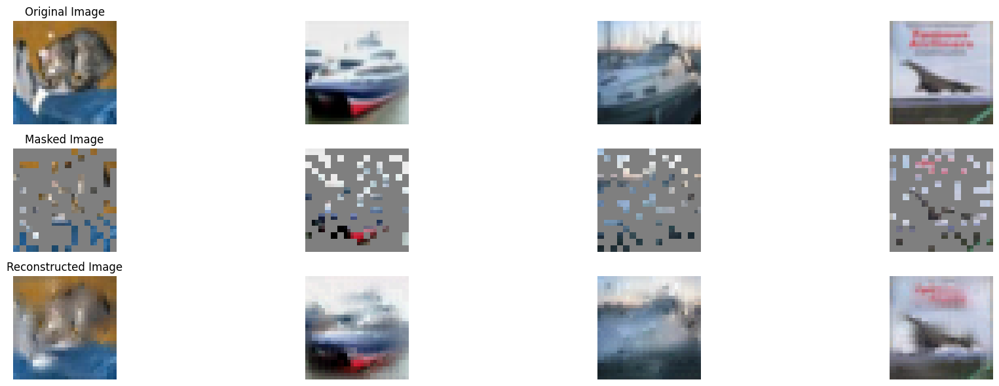

100%|██████████| 196/196 [00:57<00:00,  3.40it/s]


In epoch 96, average traning loss is 0.0438171845233562.
=================== EPOCH:  96  ===================


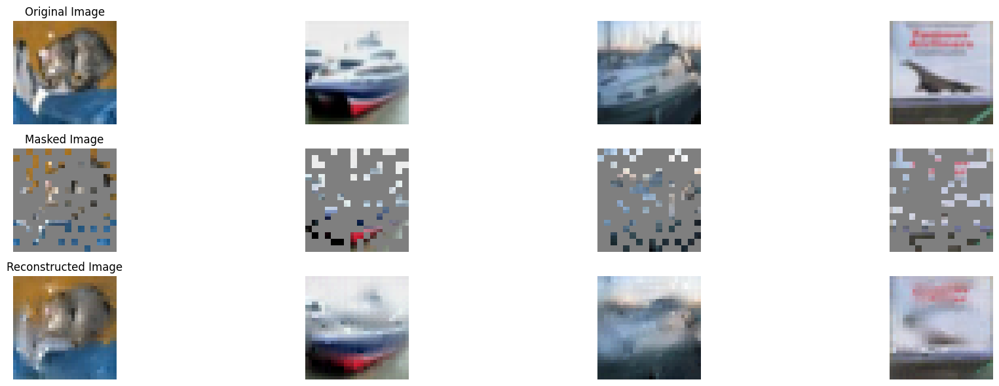

100%|██████████| 196/196 [00:58<00:00,  3.36it/s]


In epoch 97, average traning loss is 0.043545858991541425.
=================== EPOCH:  97  ===================


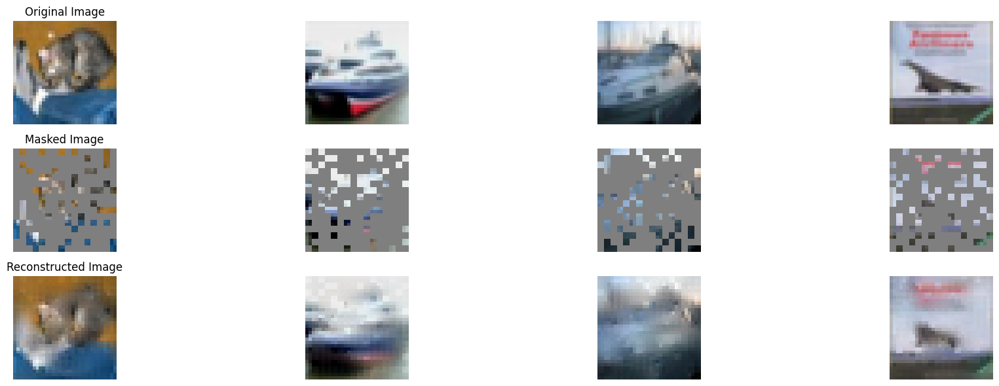

100%|██████████| 196/196 [00:58<00:00,  3.32it/s]


In epoch 98, average traning loss is 0.04340869357467306.
=================== EPOCH:  98  ===================


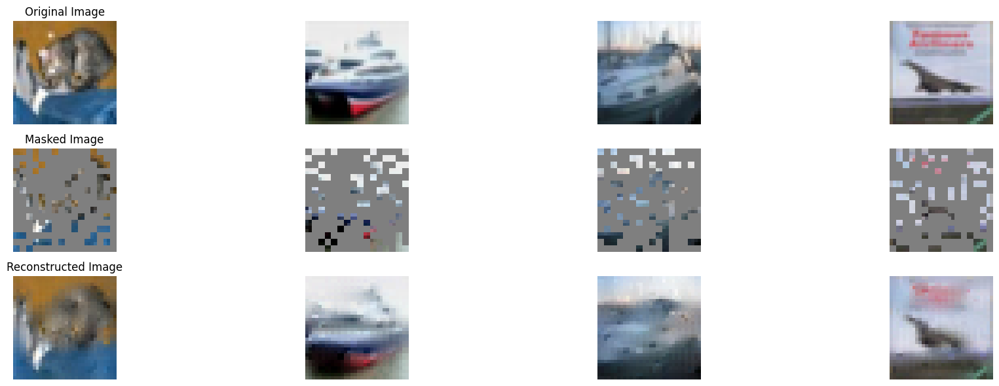

100%|██████████| 196/196 [00:59<00:00,  3.30it/s]


In epoch 99, average traning loss is 0.0433750978043797.
=================== EPOCH:  99  ===================


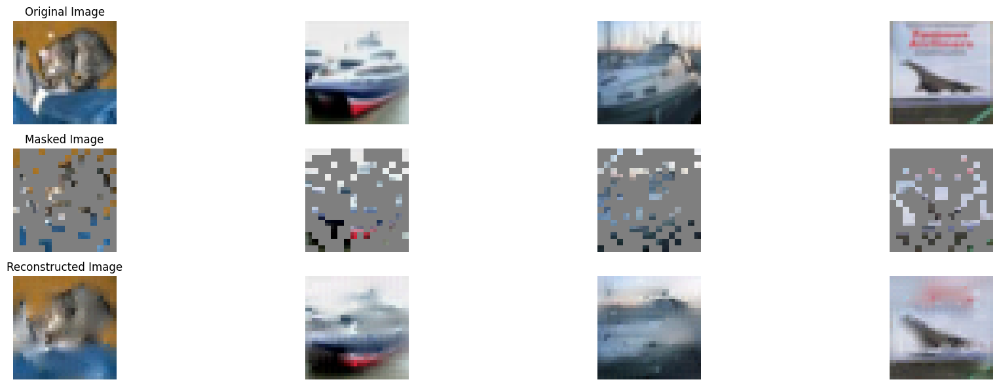

100%|██████████| 196/196 [00:59<00:00,  3.27it/s]


In epoch 100, average traning loss is 0.043162823179546665.
=================== EPOCH:  100  ===================


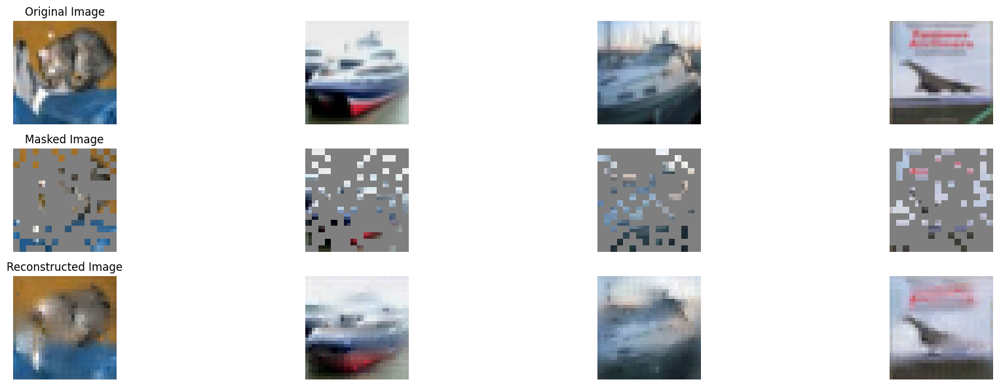

100%|██████████| 196/196 [00:59<00:00,  3.28it/s]


In epoch 101, average traning loss is 0.04301562281895657.
=================== EPOCH:  101  ===================


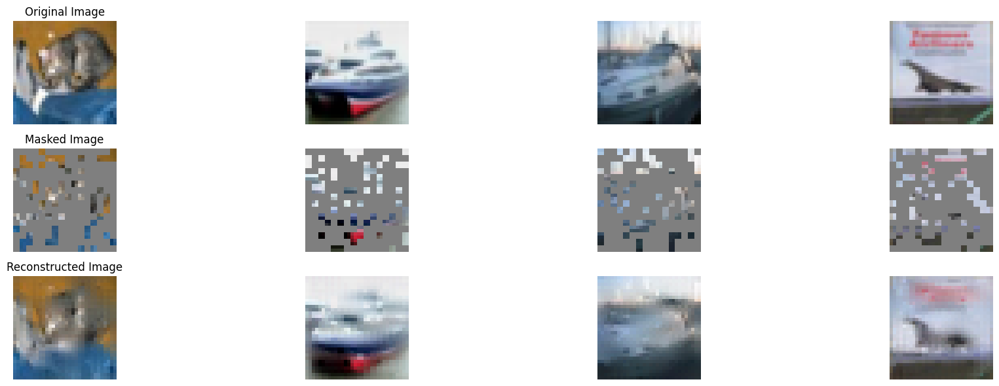

100%|██████████| 196/196 [01:00<00:00,  3.26it/s]


In epoch 102, average traning loss is 0.04276474226950383.
=================== EPOCH:  102  ===================


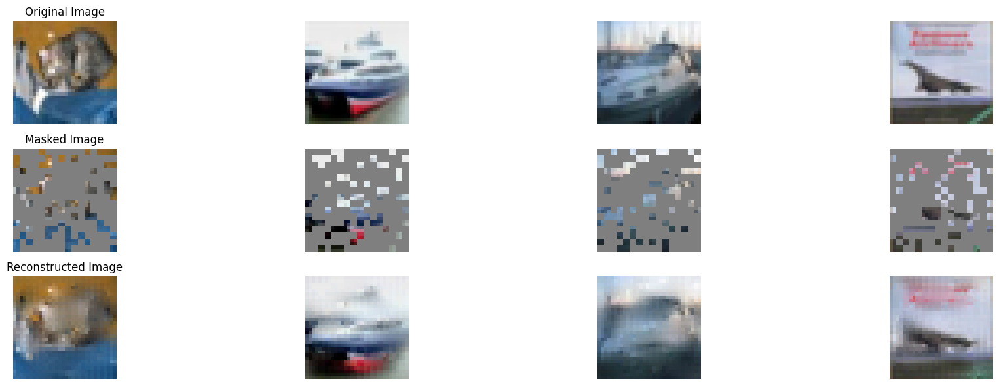

100%|██████████| 196/196 [00:59<00:00,  3.27it/s]


In epoch 103, average traning loss is 0.042641494157058854.
=================== EPOCH:  103  ===================


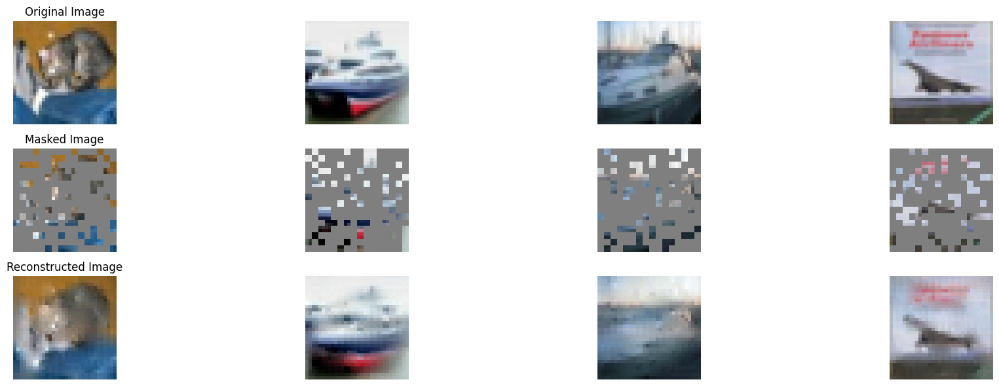

100%|██████████| 196/196 [00:59<00:00,  3.30it/s]


In epoch 104, average traning loss is 0.04254187639726668.
=================== EPOCH:  104  ===================


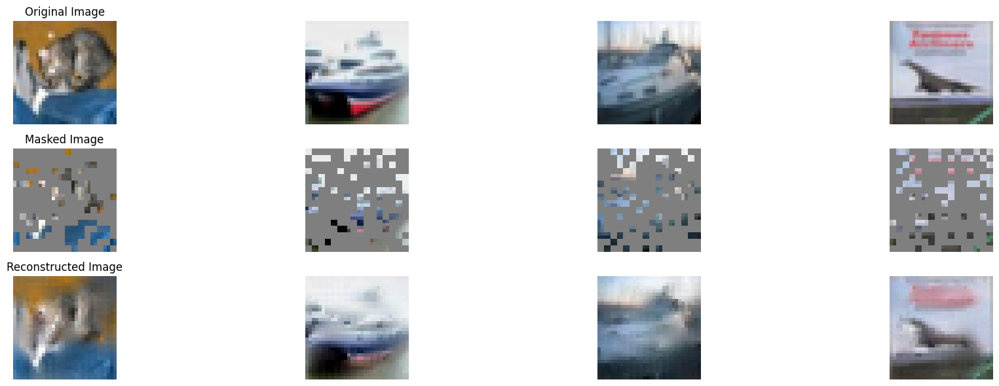

100%|██████████| 196/196 [00:59<00:00,  3.31it/s]


In epoch 105, average traning loss is 0.04244716531996216.
=================== EPOCH:  105  ===================


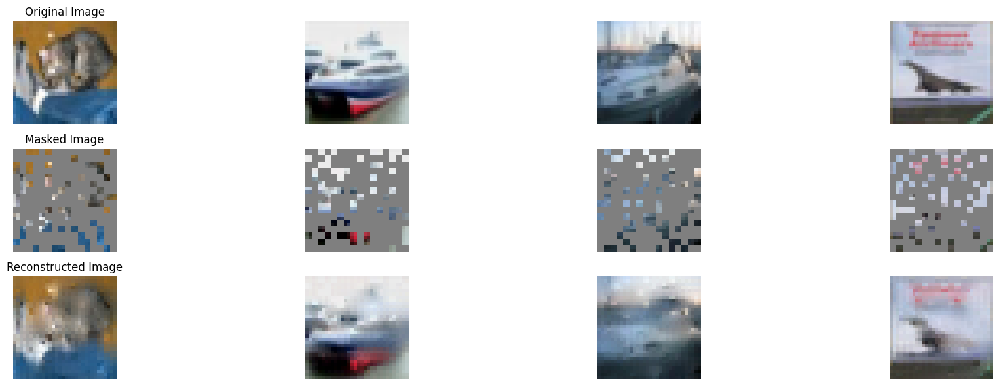

100%|██████████| 196/196 [00:59<00:00,  3.30it/s]


In epoch 106, average traning loss is 0.04228344580576736.
=================== EPOCH:  106  ===================


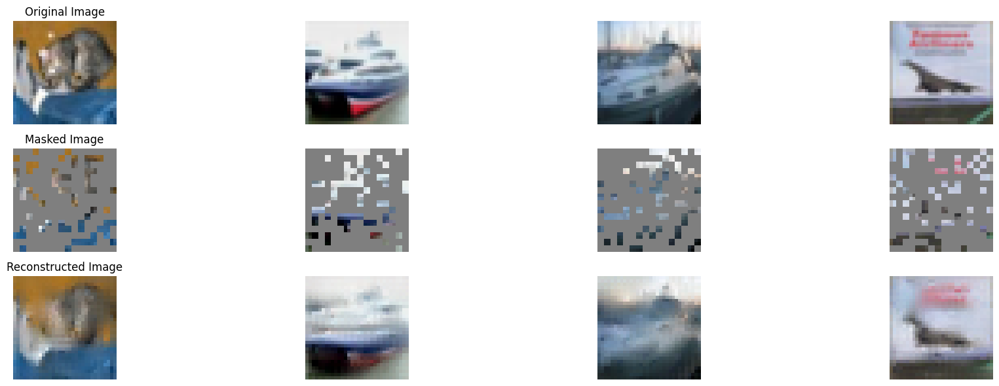

100%|██████████| 196/196 [00:59<00:00,  3.30it/s]


In epoch 107, average traning loss is 0.04212187893916758.
=================== EPOCH:  107  ===================


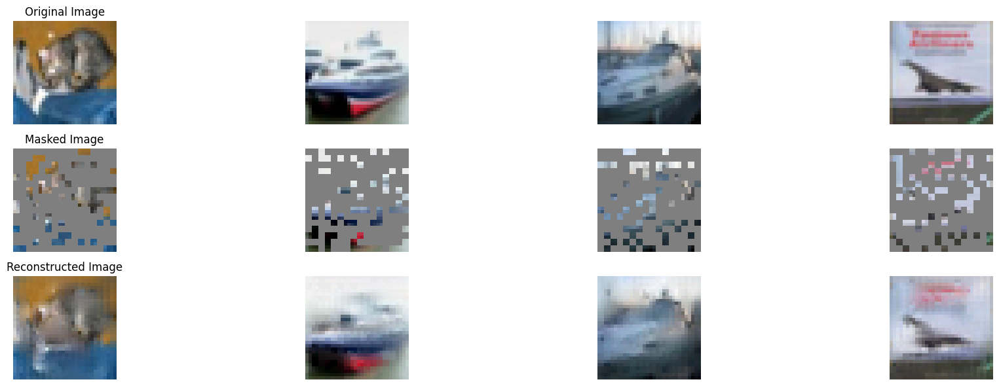

100%|██████████| 196/196 [00:57<00:00,  3.39it/s]


In epoch 108, average traning loss is 0.04209964503819237.
=================== EPOCH:  108  ===================


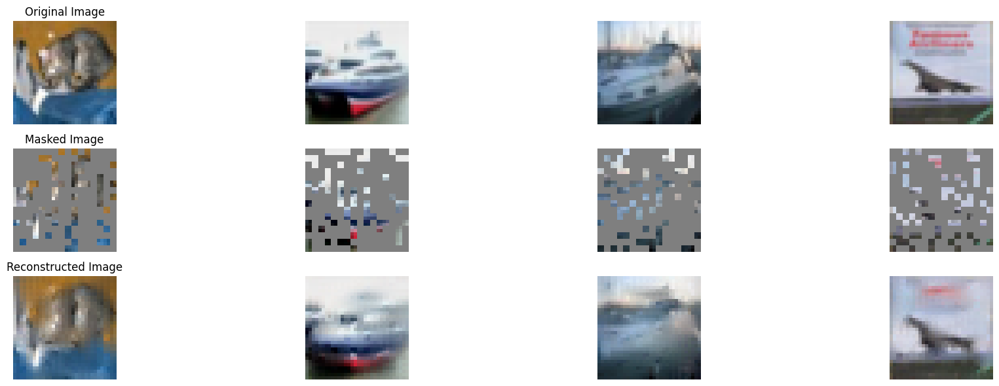

100%|██████████| 196/196 [00:56<00:00,  3.47it/s]


In epoch 109, average traning loss is 0.041890518549753696.
=================== EPOCH:  109  ===================


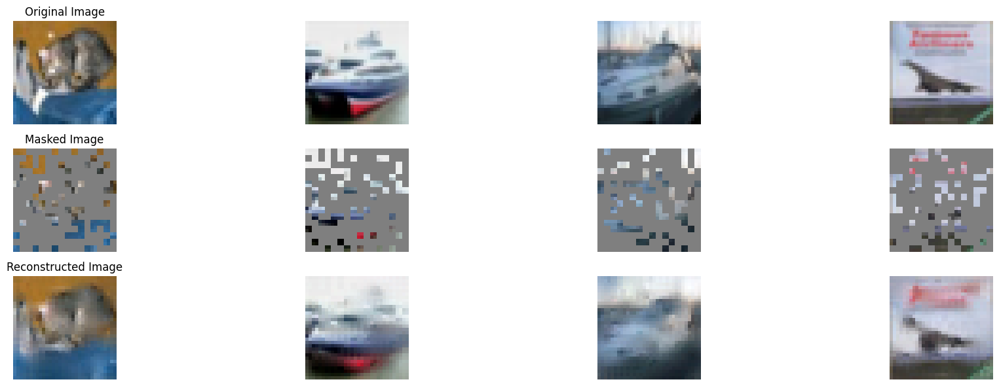

100%|██████████| 196/196 [00:57<00:00,  3.43it/s]


In epoch 110, average traning loss is 0.04174620080359128.
=================== EPOCH:  110  ===================


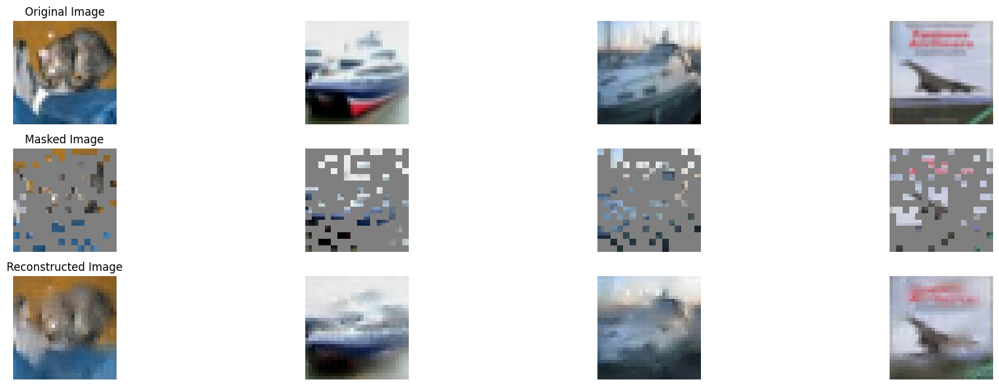

100%|██████████| 196/196 [00:56<00:00,  3.45it/s]


In epoch 111, average traning loss is 0.041735537635276515.
=================== EPOCH:  111  ===================


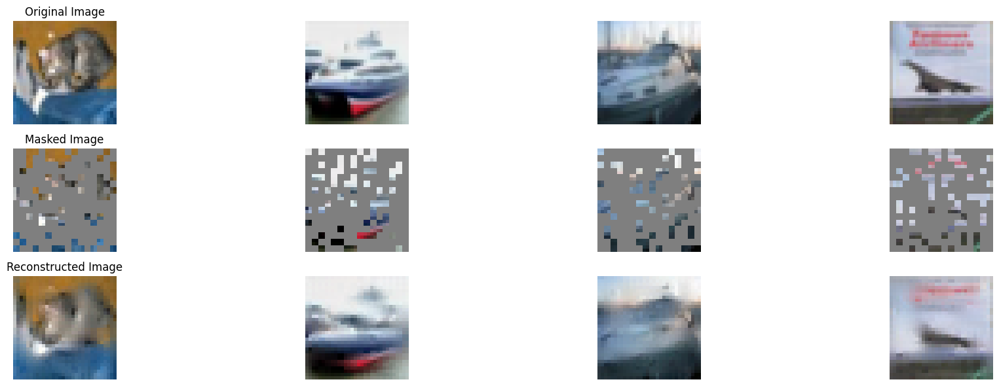

100%|██████████| 196/196 [00:57<00:00,  3.43it/s]


In epoch 112, average traning loss is 0.04153825376867032.
=================== EPOCH:  112  ===================


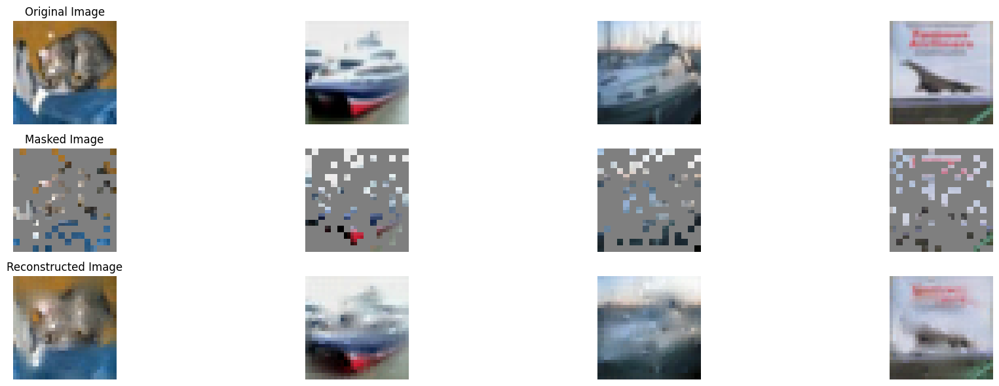

100%|██████████| 196/196 [00:57<00:00,  3.41it/s]


In epoch 113, average traning loss is 0.041383277320740174.
=================== EPOCH:  113  ===================


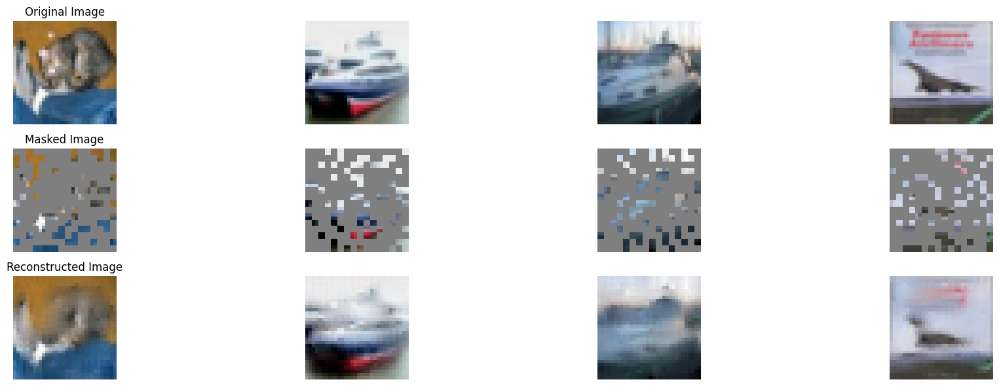

100%|██████████| 196/196 [00:57<00:00,  3.38it/s]


In epoch 114, average traning loss is 0.04134827017860145.
=================== EPOCH:  114  ===================


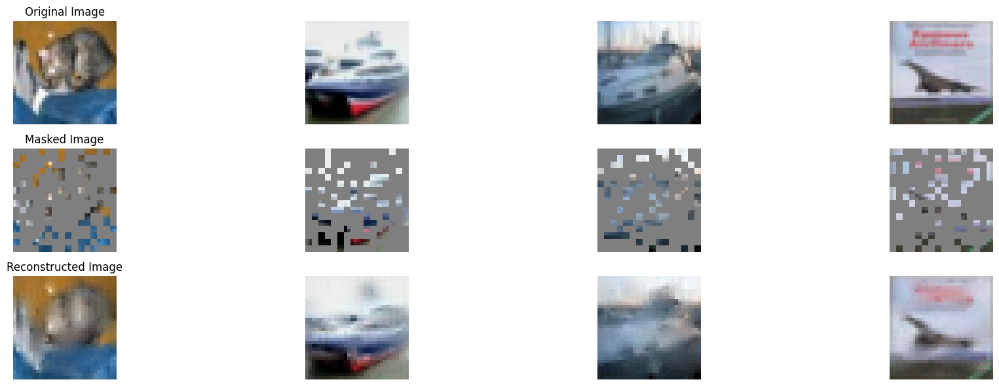

100%|██████████| 196/196 [00:58<00:00,  3.33it/s]


In epoch 115, average traning loss is 0.04135457743719524.
=================== EPOCH:  115  ===================


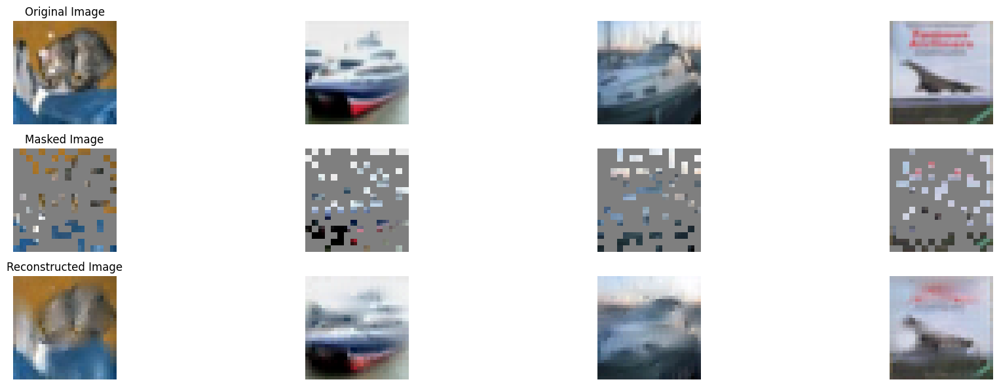

100%|██████████| 196/196 [00:57<00:00,  3.39it/s]


In epoch 116, average traning loss is 0.04121793637394297.
=================== EPOCH:  116  ===================


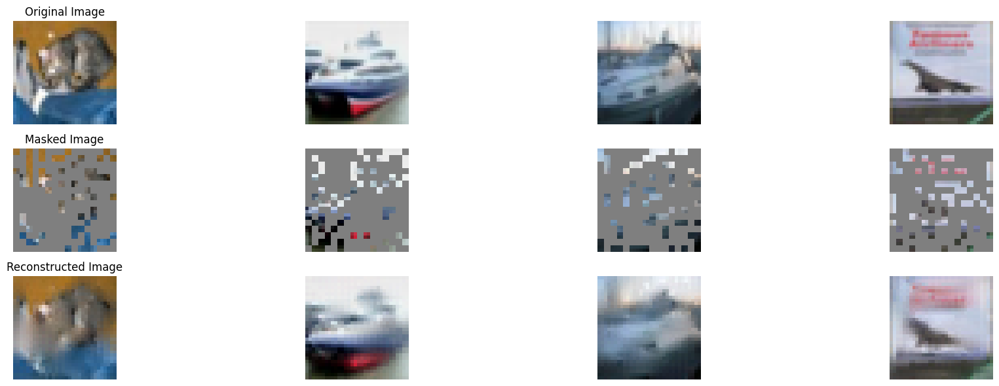

100%|██████████| 196/196 [00:56<00:00,  3.46it/s]


In epoch 117, average traning loss is 0.0411288531078976.
=================== EPOCH:  117  ===================


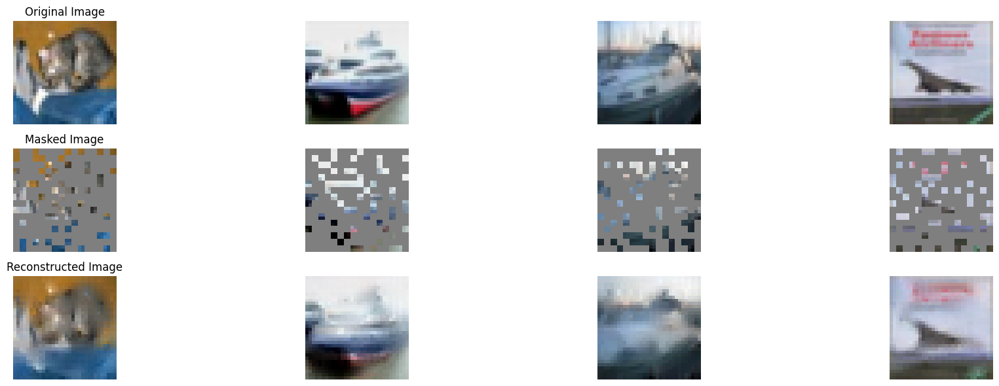

100%|██████████| 196/196 [00:56<00:00,  3.44it/s]


In epoch 118, average traning loss is 0.040985017406697175.
=================== EPOCH:  118  ===================


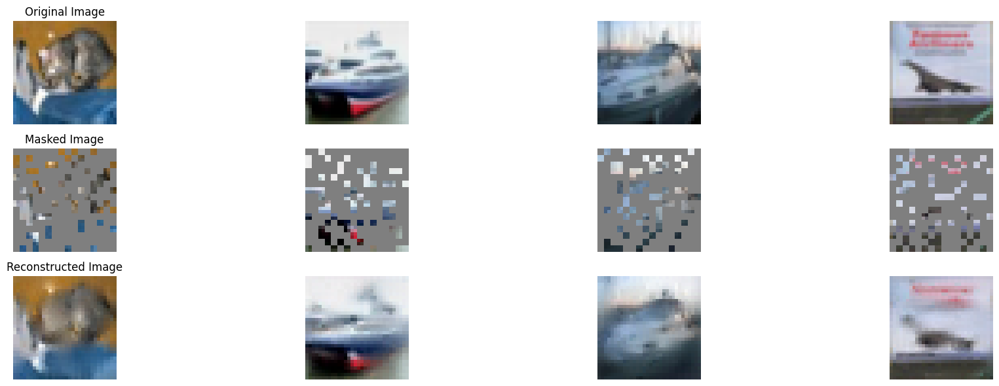

100%|██████████| 196/196 [00:56<00:00,  3.45it/s]


In epoch 119, average traning loss is 0.0409930431074938.
=================== EPOCH:  119  ===================


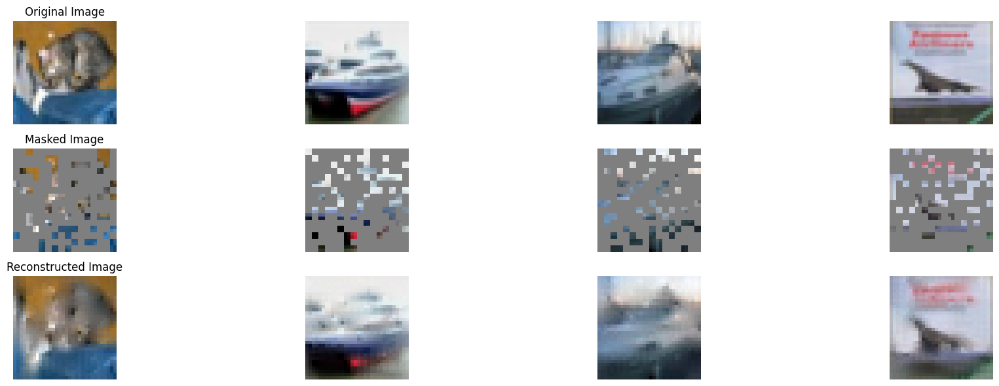

100%|██████████| 196/196 [00:56<00:00,  3.45it/s]


In epoch 120, average traning loss is 0.0407729900385044.
=================== EPOCH:  120  ===================


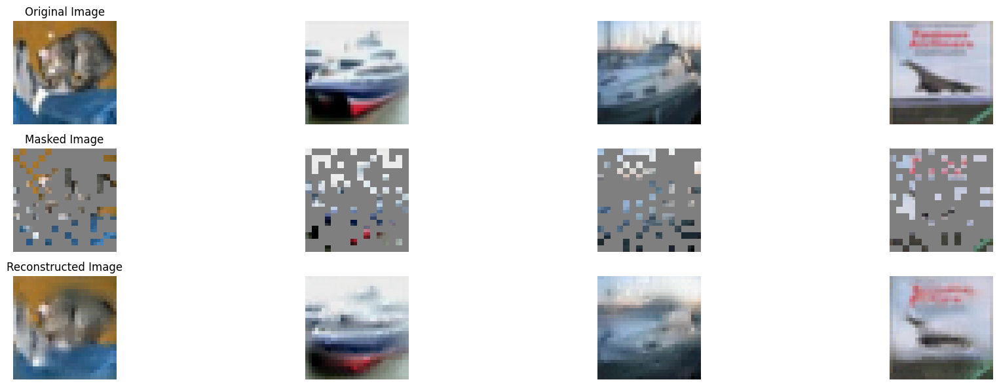

100%|██████████| 196/196 [00:56<00:00,  3.47it/s]


In epoch 121, average traning loss is 0.04069077719611173.
=================== EPOCH:  121  ===================


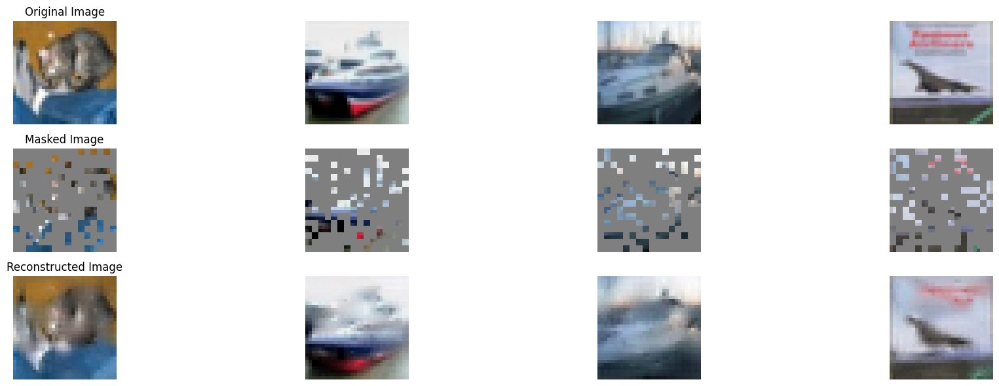

100%|██████████| 196/196 [00:56<00:00,  3.47it/s]


In epoch 122, average traning loss is 0.04070719645111537.
=================== EPOCH:  122  ===================


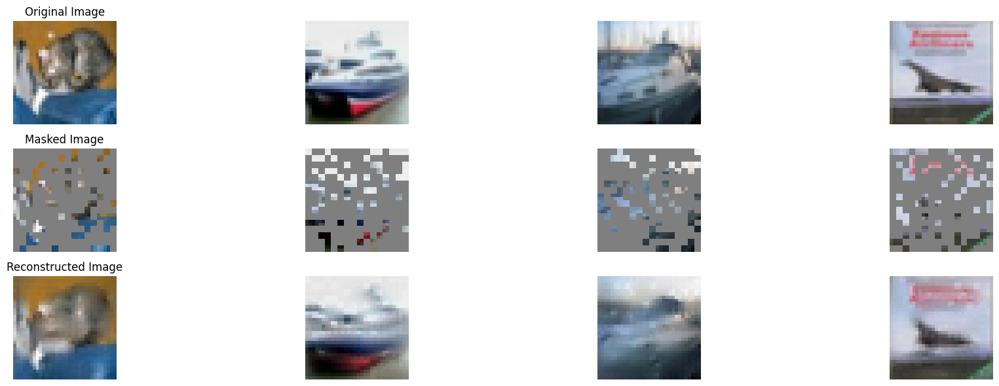

100%|██████████| 196/196 [00:57<00:00,  3.41it/s]


In epoch 123, average traning loss is 0.04051271204513555.
=================== EPOCH:  123  ===================


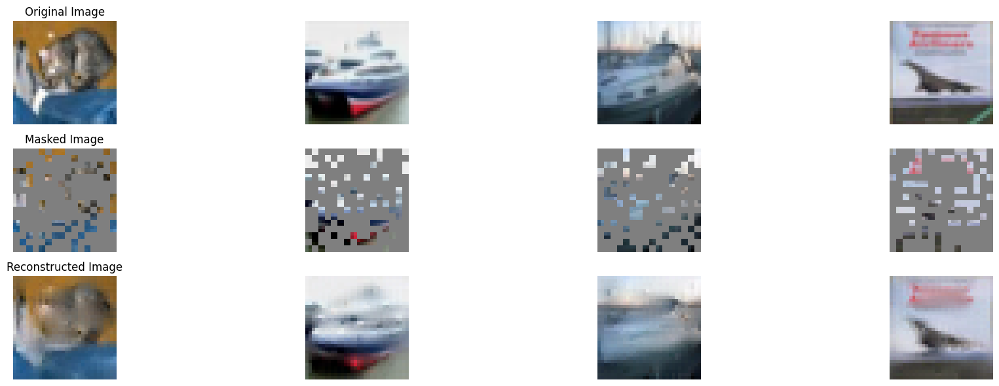

100%|██████████| 196/196 [00:58<00:00,  3.36it/s]


In epoch 124, average traning loss is 0.04054334750208927.
=================== EPOCH:  124  ===================


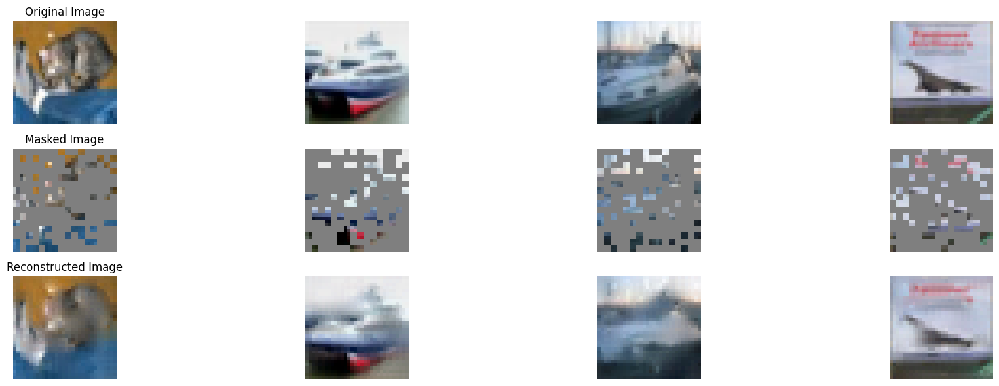

100%|██████████| 196/196 [00:56<00:00,  3.47it/s]


In epoch 125, average traning loss is 0.04043559315709435.
=================== EPOCH:  125  ===================


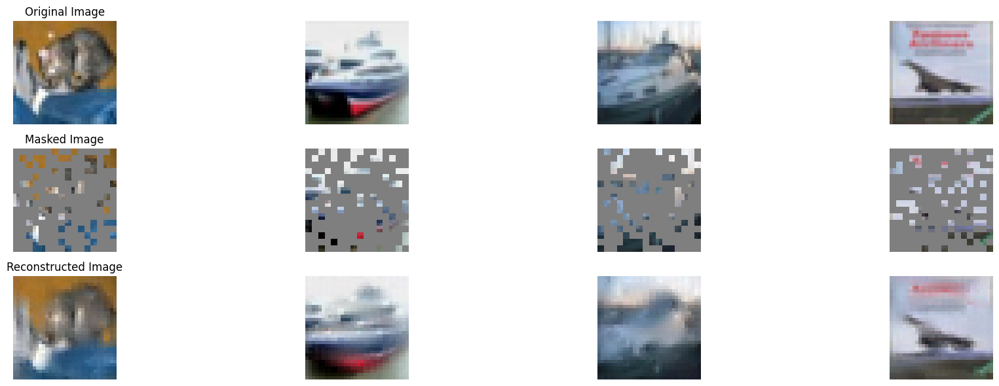

100%|██████████| 196/196 [00:58<00:00,  3.34it/s]


In epoch 126, average traning loss is 0.04041103195703151.
=================== EPOCH:  126  ===================


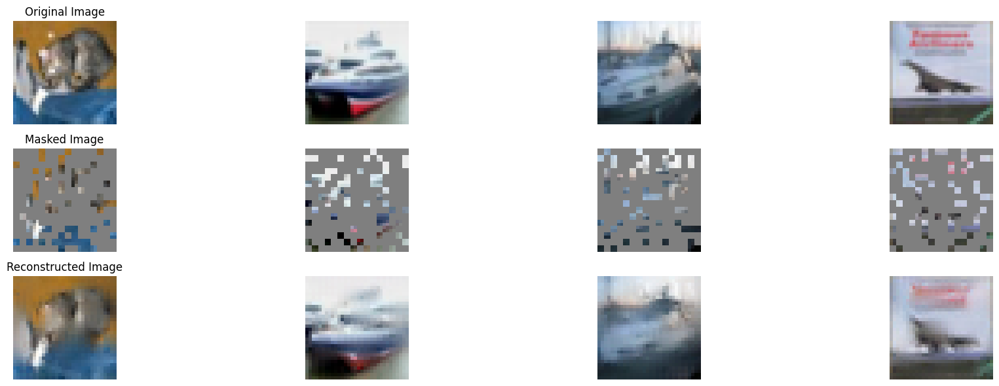

100%|██████████| 196/196 [00:57<00:00,  3.43it/s]


In epoch 127, average traning loss is 0.04033807404719445.
=================== EPOCH:  127  ===================


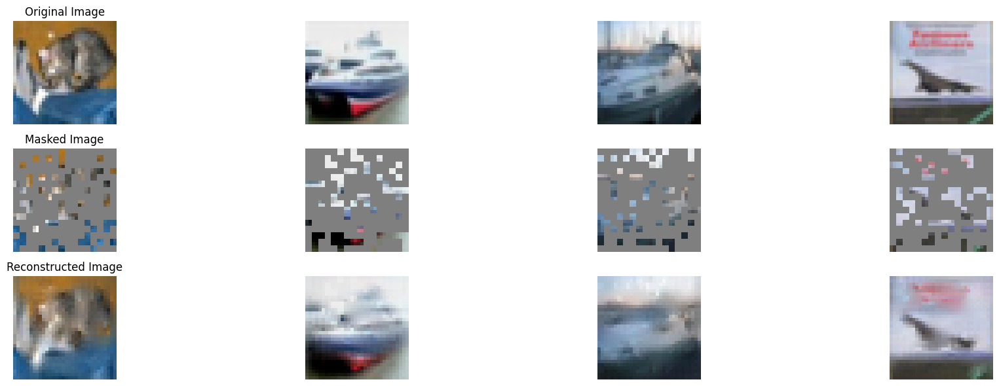

100%|██████████| 196/196 [00:57<00:00,  3.42it/s]


In epoch 128, average traning loss is 0.04028908760115808.
=================== EPOCH:  128  ===================


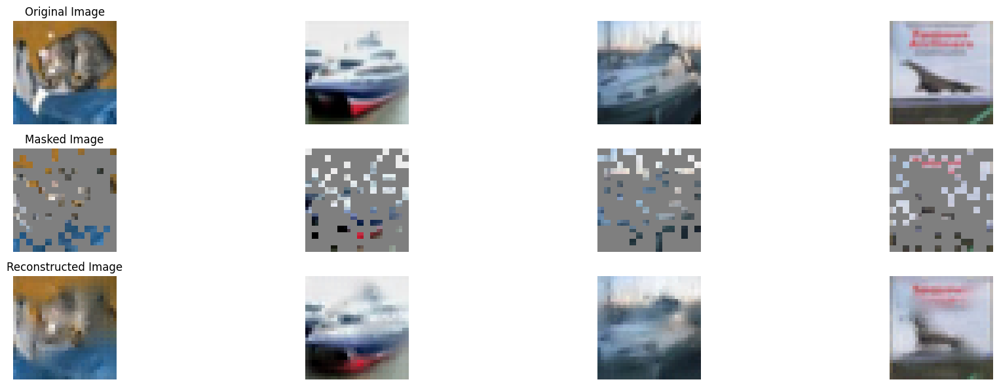

100%|██████████| 196/196 [00:57<00:00,  3.39it/s]


In epoch 129, average traning loss is 0.040268290008665344.
=================== EPOCH:  129  ===================


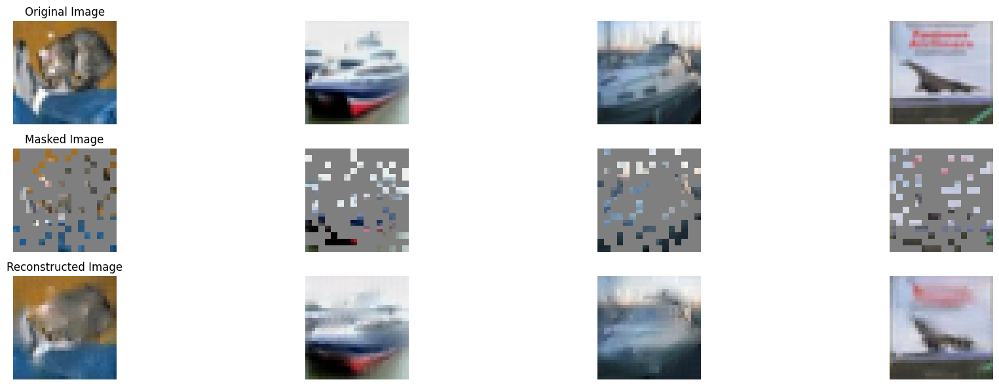

100%|██████████| 196/196 [00:57<00:00,  3.39it/s]


In epoch 130, average traning loss is 0.04009327222117964.
=================== EPOCH:  130  ===================


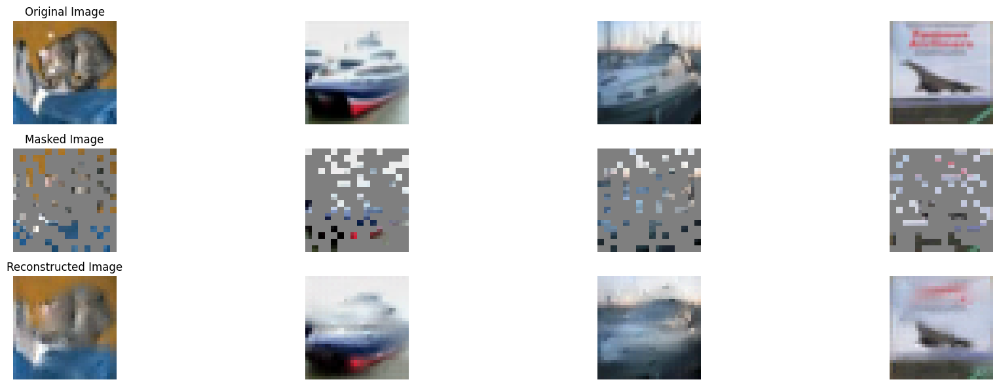

100%|██████████| 196/196 [00:56<00:00,  3.46it/s]


In epoch 131, average traning loss is 0.040034814243566016.
=================== EPOCH:  131  ===================


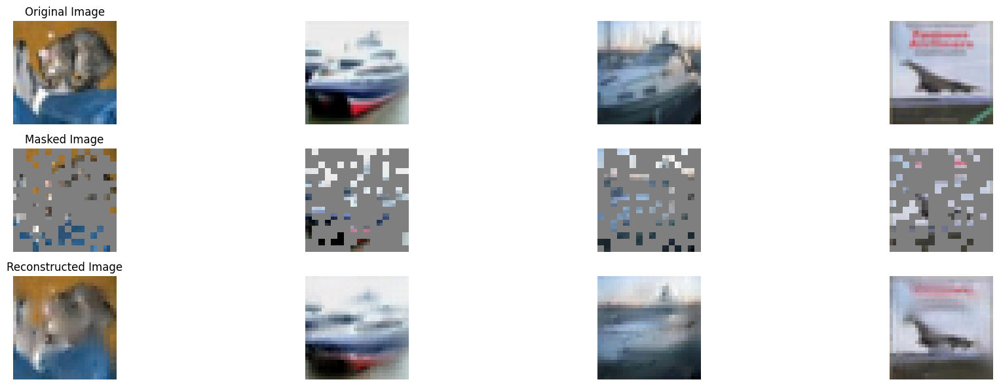

100%|██████████| 196/196 [00:58<00:00,  3.36it/s]


In epoch 132, average traning loss is 0.04000784795047069.
=================== EPOCH:  132  ===================


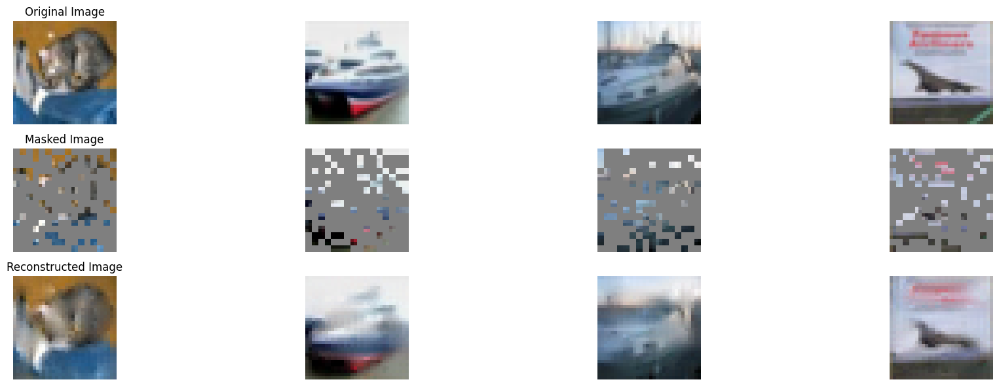

100%|██████████| 196/196 [00:57<00:00,  3.38it/s]


In epoch 133, average traning loss is 0.039947215676763834.
=================== EPOCH:  133  ===================


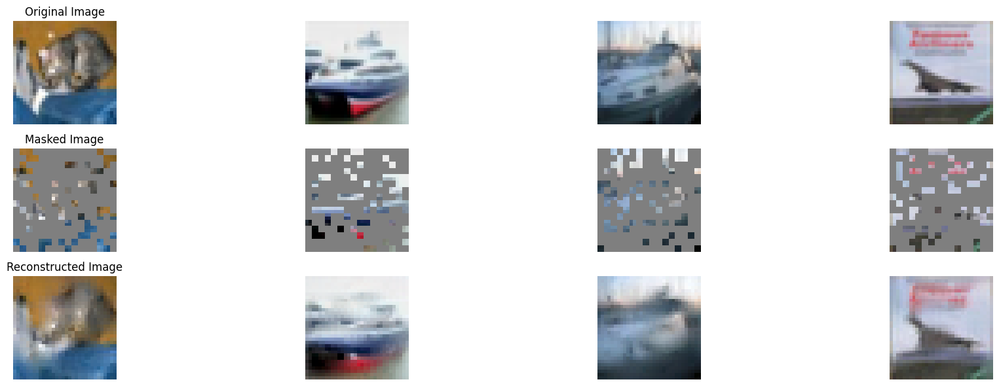

100%|██████████| 196/196 [00:57<00:00,  3.43it/s]


In epoch 134, average traning loss is 0.03991016222886285.
=================== EPOCH:  134  ===================


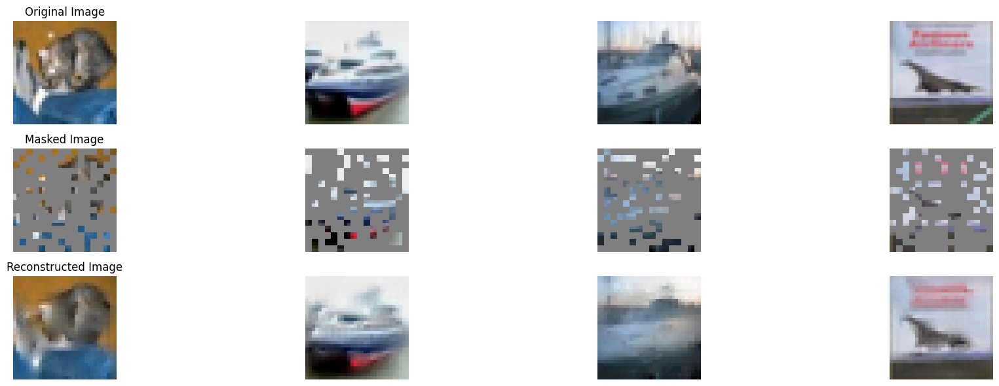

100%|██████████| 196/196 [00:56<00:00,  3.45it/s]


In epoch 135, average traning loss is 0.03979953256796817.
=================== EPOCH:  135  ===================


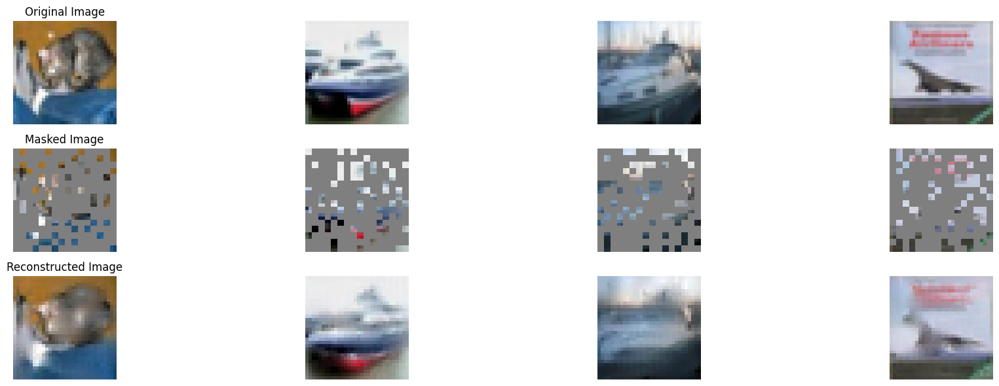

100%|██████████| 196/196 [00:57<00:00,  3.41it/s]


In epoch 136, average traning loss is 0.03972172294268195.
=================== EPOCH:  136  ===================


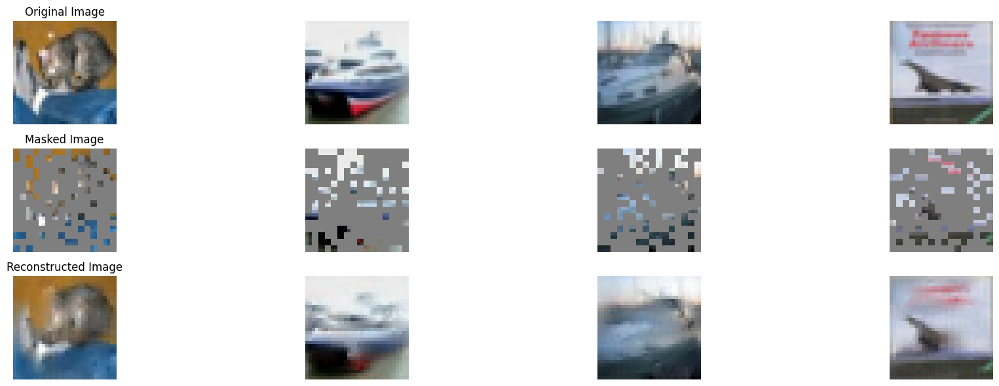

100%|██████████| 196/196 [00:57<00:00,  3.41it/s]


In epoch 137, average traning loss is 0.039677985468689274.
=================== EPOCH:  137  ===================


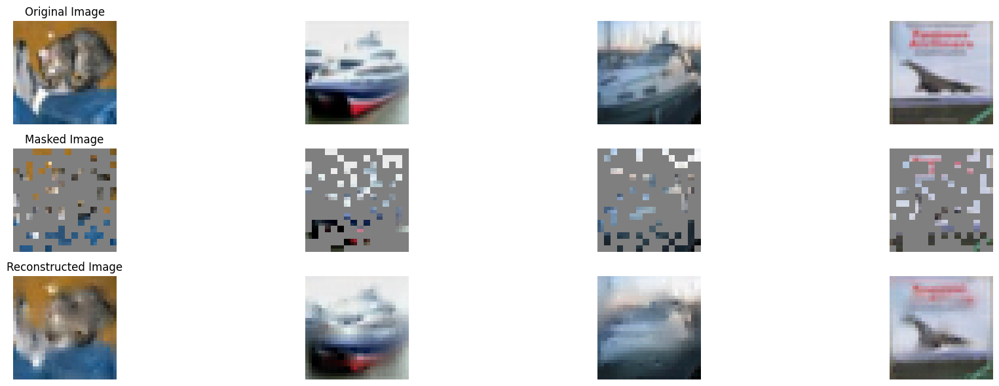

100%|██████████| 196/196 [00:56<00:00,  3.44it/s]


In epoch 138, average traning loss is 0.039643704948224584.
=================== EPOCH:  138  ===================


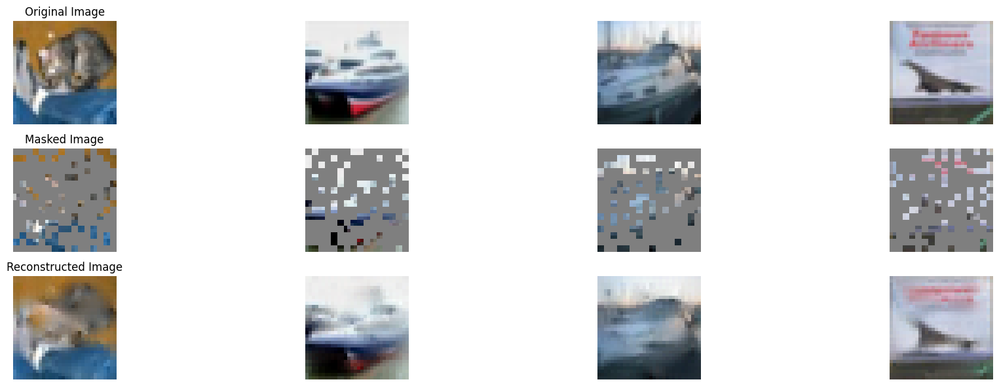

100%|██████████| 196/196 [00:56<00:00,  3.45it/s]


In epoch 139, average traning loss is 0.039571422475333115.
=================== EPOCH:  139  ===================


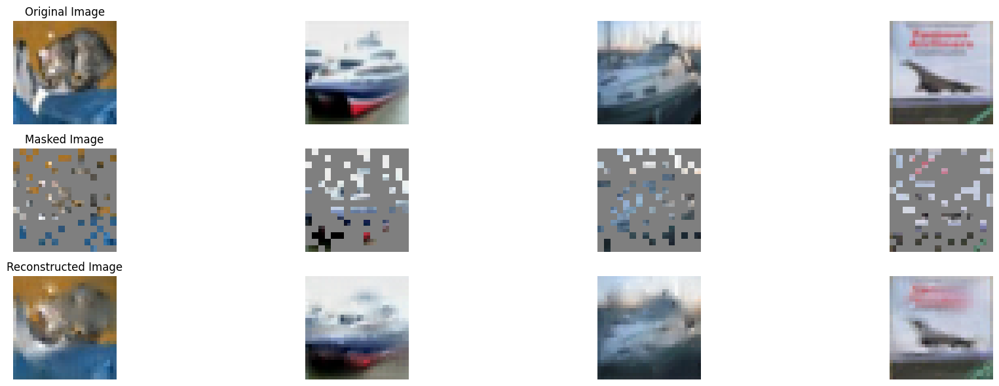

100%|██████████| 196/196 [00:56<00:00,  3.45it/s]


In epoch 140, average traning loss is 0.039616666658192266.
=================== EPOCH:  140  ===================


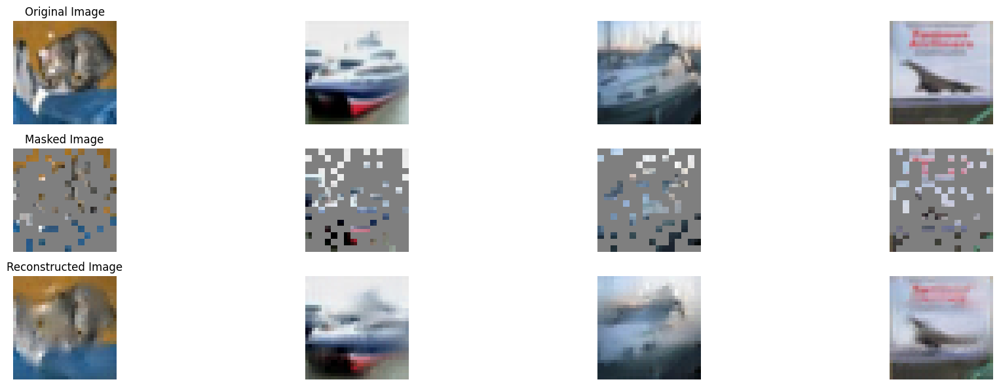

100%|██████████| 196/196 [00:56<00:00,  3.45it/s]


In epoch 141, average traning loss is 0.039547226638818274.
=================== EPOCH:  141  ===================


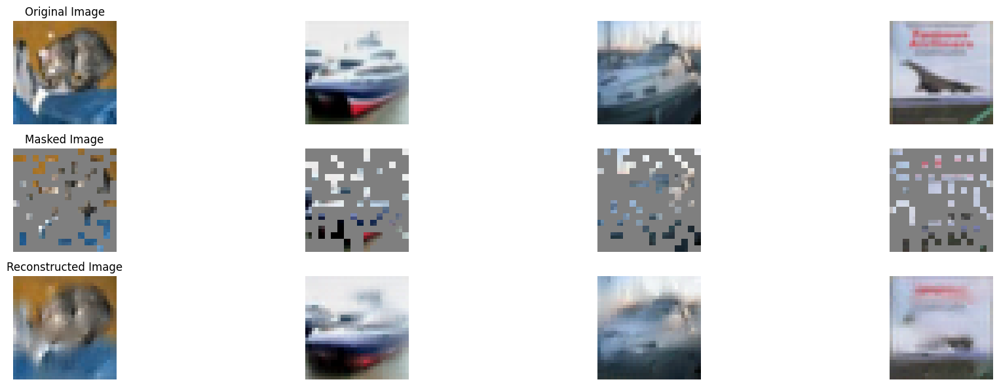

100%|██████████| 196/196 [00:56<00:00,  3.46it/s]


In epoch 142, average traning loss is 0.039421201569541375.
=================== EPOCH:  142  ===================


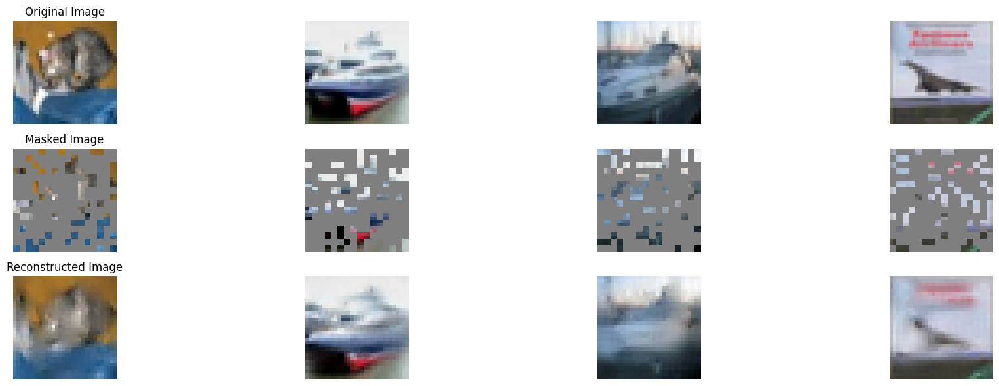

100%|██████████| 196/196 [00:56<00:00,  3.44it/s]


In epoch 143, average traning loss is 0.039377196349811794.
=================== EPOCH:  143  ===================


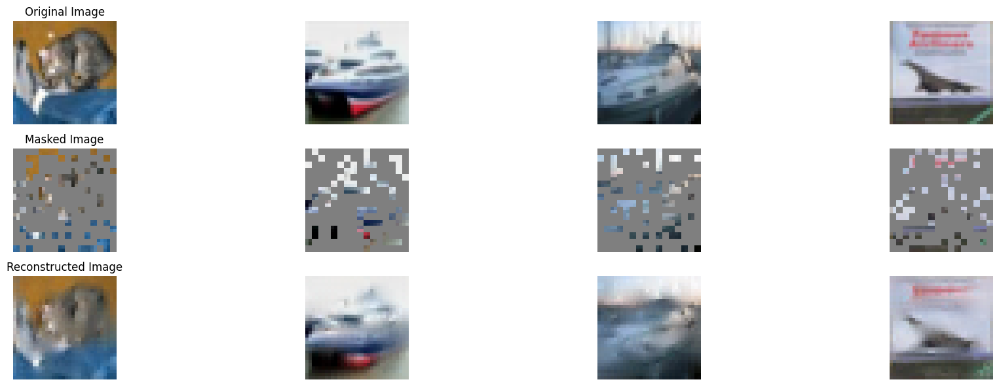

100%|██████████| 196/196 [00:56<00:00,  3.46it/s]


In epoch 144, average traning loss is 0.03937782672214873.
=================== EPOCH:  144  ===================


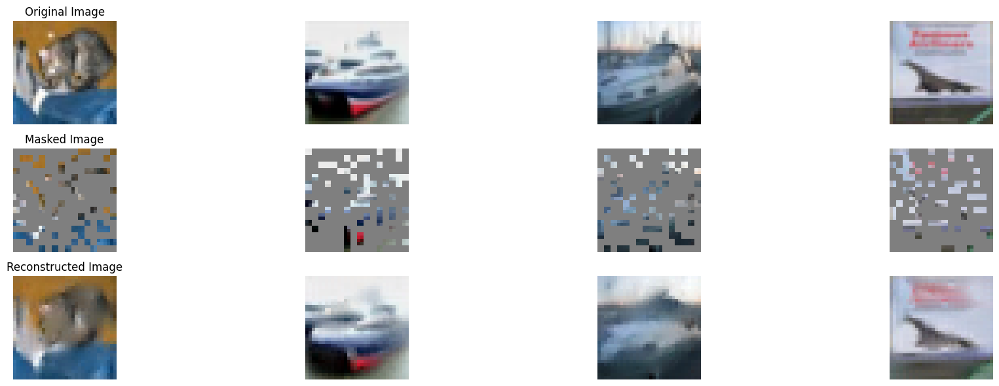

100%|██████████| 196/196 [00:58<00:00,  3.35it/s]


In epoch 145, average traning loss is 0.03934183378456807.
=================== EPOCH:  145  ===================


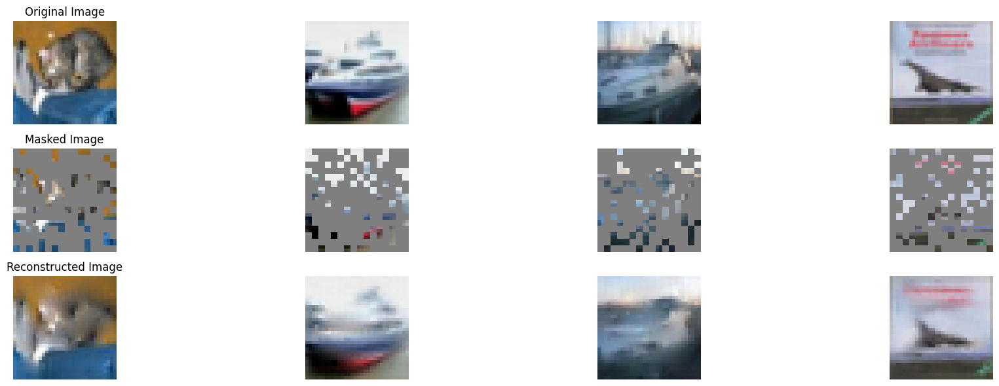

100%|██████████| 196/196 [00:57<00:00,  3.39it/s]


In epoch 146, average traning loss is 0.039222348690489114.
=================== EPOCH:  146  ===================


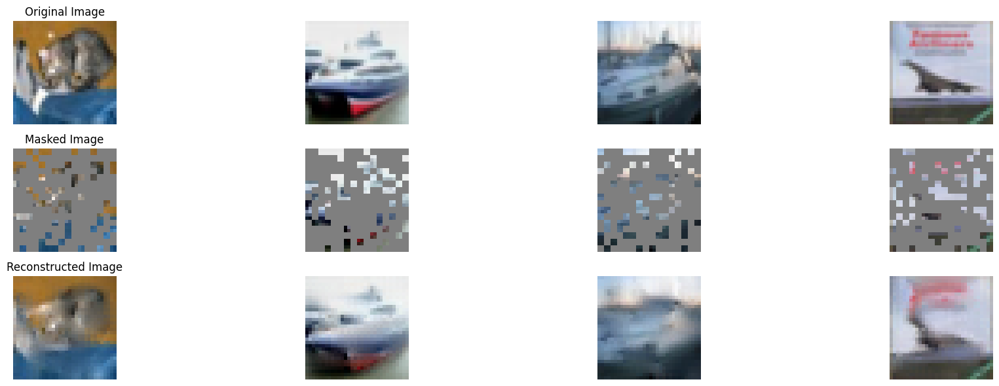

100%|██████████| 196/196 [00:56<00:00,  3.44it/s]


In epoch 147, average traning loss is 0.03917198987411601.
=================== EPOCH:  147  ===================


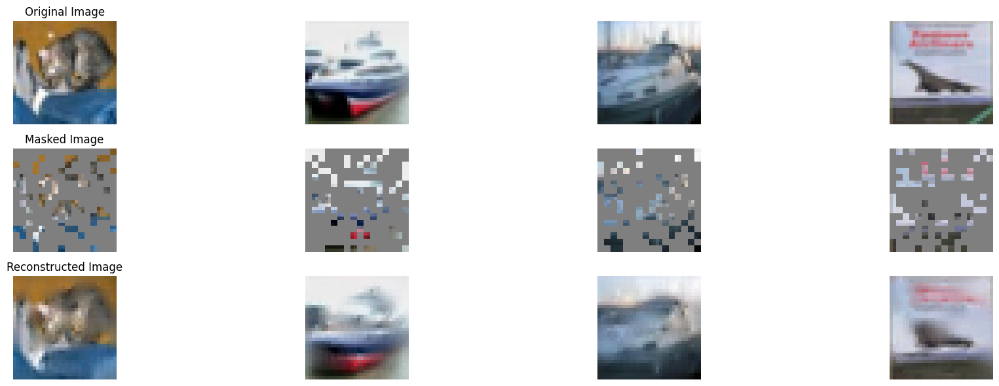

100%|██████████| 196/196 [00:56<00:00,  3.45it/s]


In epoch 148, average traning loss is 0.039173547919763595.
=================== EPOCH:  148  ===================


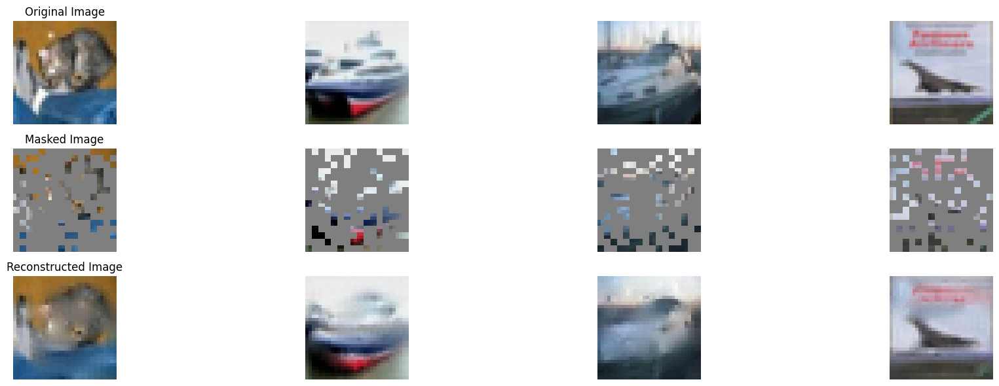

100%|██████████| 196/196 [00:57<00:00,  3.39it/s]


In epoch 149, average traning loss is 0.039073891519587865.
=================== EPOCH:  149  ===================


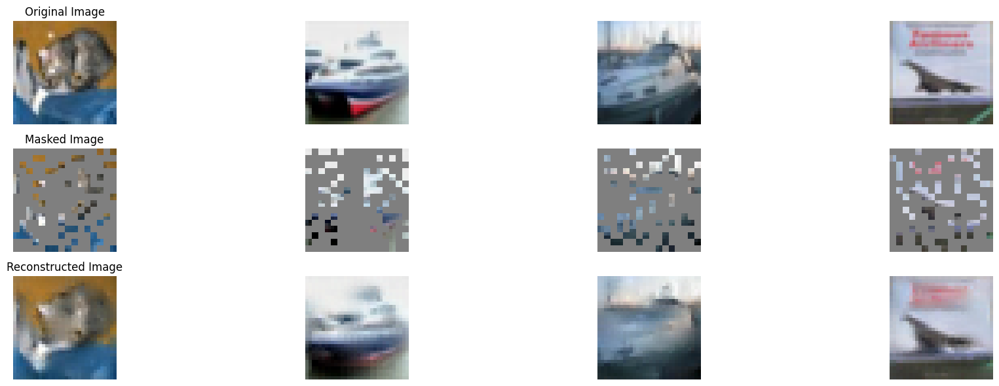

100%|██████████| 196/196 [00:56<00:00,  3.45it/s]


In epoch 150, average traning loss is 0.03908992670856568.
=================== EPOCH:  150  ===================


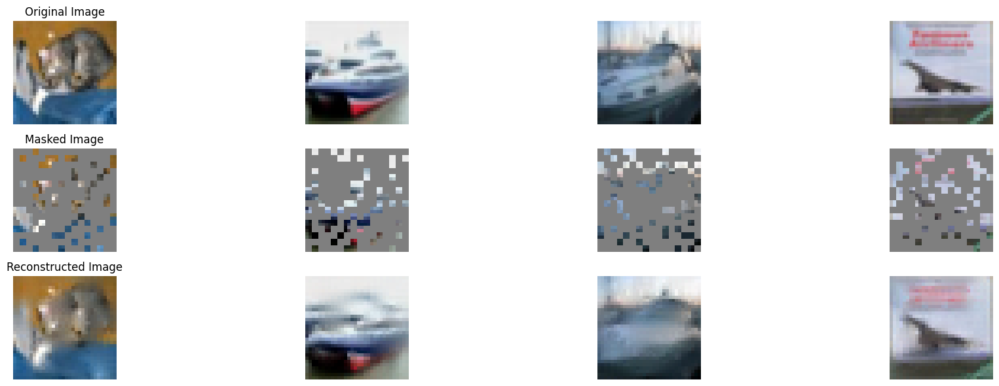

100%|██████████| 196/196 [00:56<00:00,  3.44it/s]


In epoch 151, average traning loss is 0.038995678650633414.
=================== EPOCH:  151  ===================


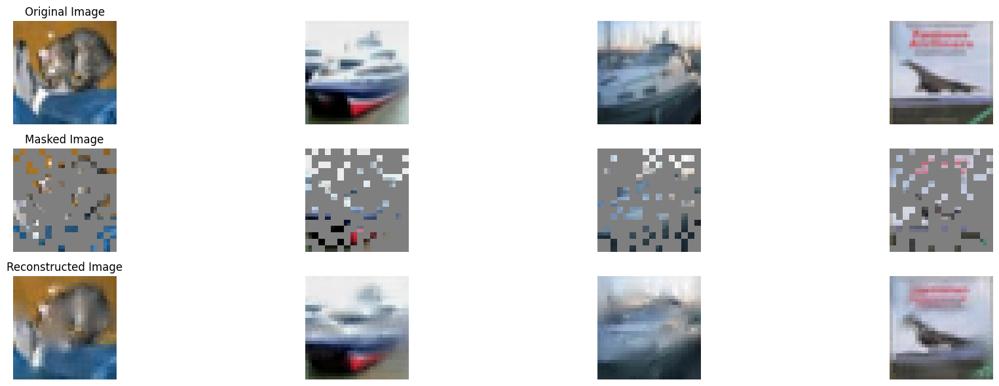

100%|██████████| 196/196 [00:56<00:00,  3.49it/s]


In epoch 152, average traning loss is 0.039010372697090616.
=================== EPOCH:  152  ===================


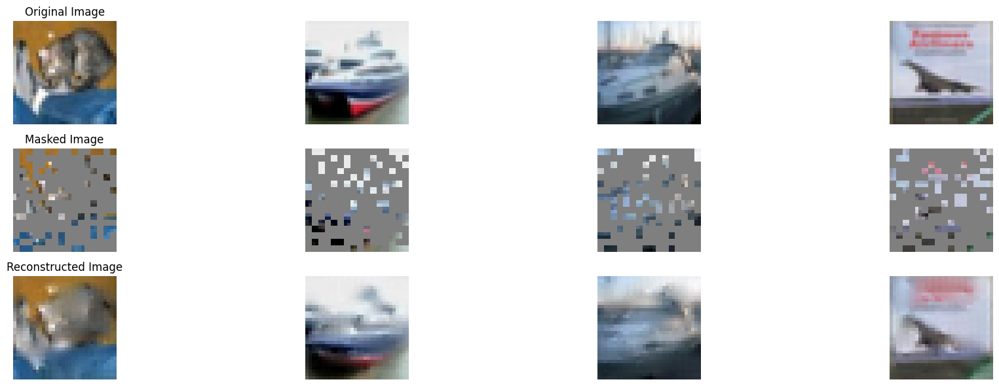

100%|██████████| 196/196 [00:56<00:00,  3.44it/s]


In epoch 153, average traning loss is 0.039032415277799784.
=================== EPOCH:  153  ===================


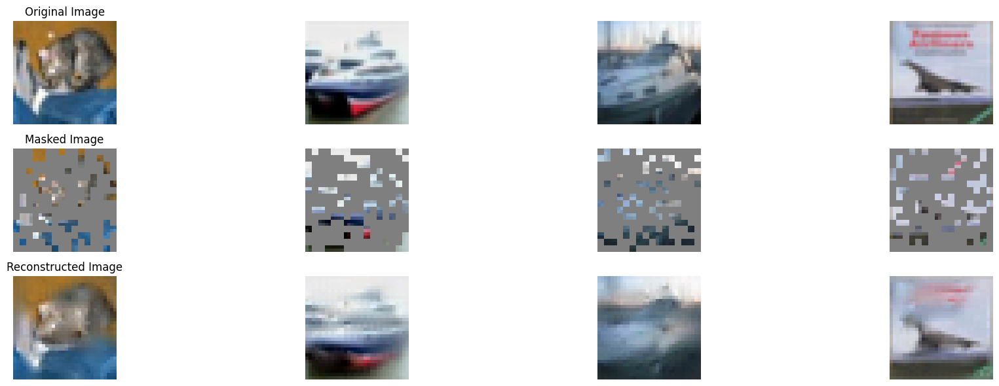

100%|██████████| 196/196 [00:57<00:00,  3.43it/s]


In epoch 154, average traning loss is 0.03899747868809773.
=================== EPOCH:  154  ===================


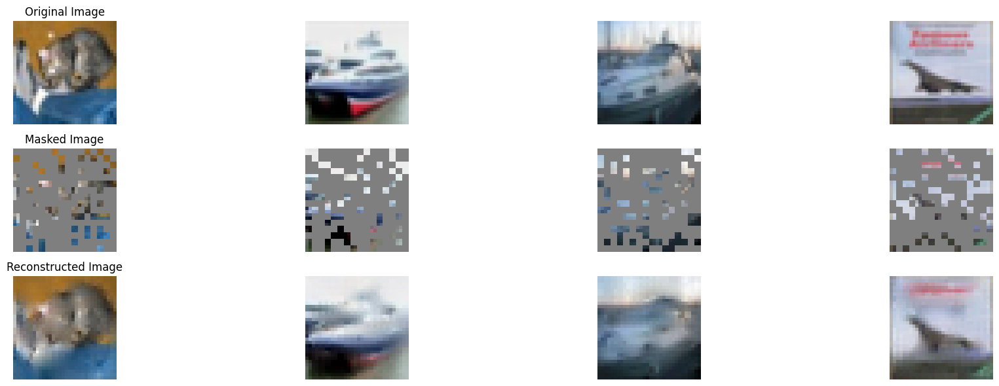

100%|██████████| 196/196 [00:56<00:00,  3.46it/s]


In epoch 155, average traning loss is 0.03887660782404092.
=================== EPOCH:  155  ===================


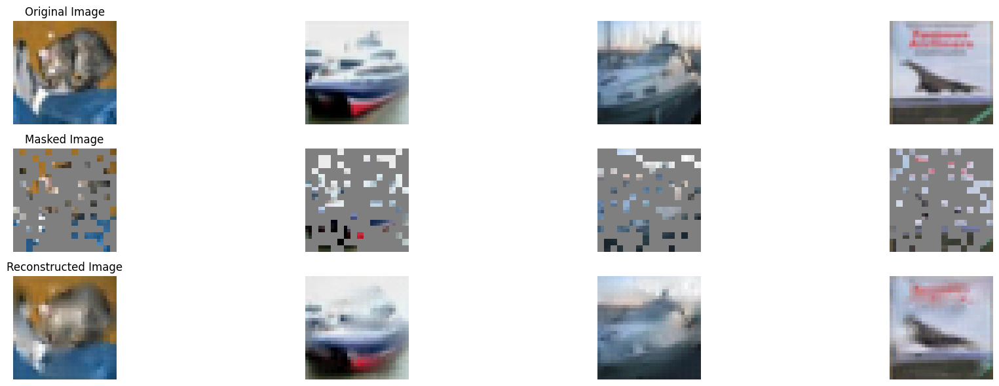

100%|██████████| 196/196 [00:57<00:00,  3.41it/s]


In epoch 156, average traning loss is 0.03883971807984065.
=================== EPOCH:  156  ===================


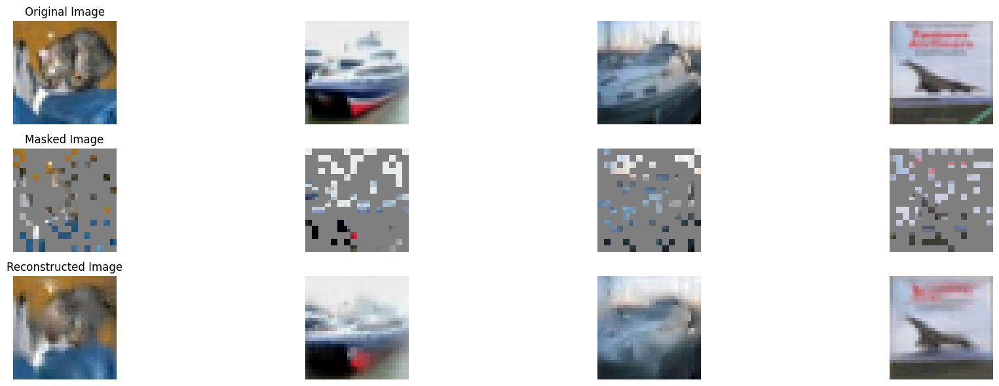

100%|██████████| 196/196 [00:56<00:00,  3.45it/s]


In epoch 157, average traning loss is 0.03878640267541822.
=================== EPOCH:  157  ===================


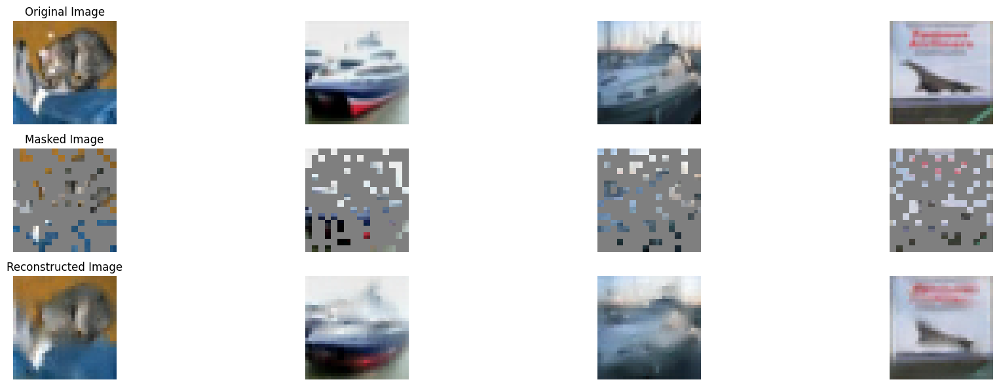

100%|██████████| 196/196 [00:56<00:00,  3.44it/s]


In epoch 158, average traning loss is 0.038799297691760014.
=================== EPOCH:  158  ===================


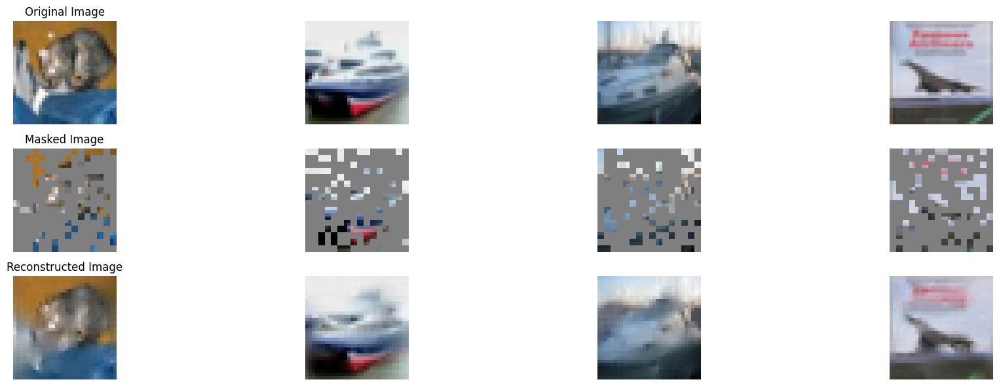

100%|██████████| 196/196 [00:58<00:00,  3.36it/s]


In epoch 159, average traning loss is 0.0387167415334558.
=================== EPOCH:  159  ===================


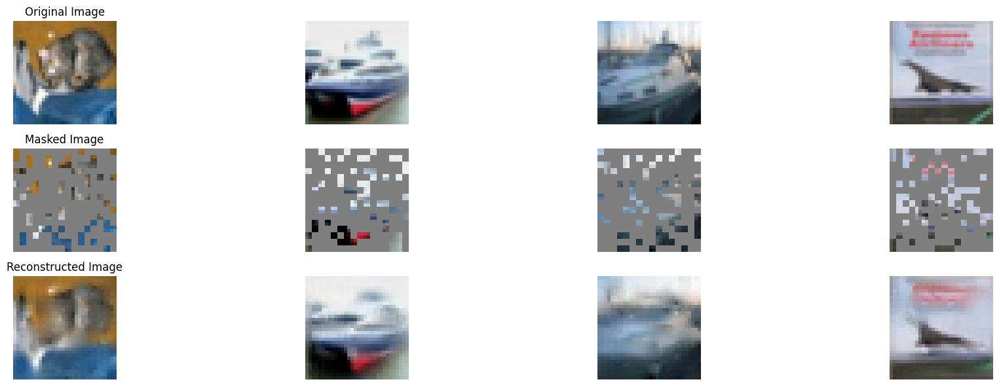

100%|██████████| 196/196 [00:57<00:00,  3.39it/s]


In epoch 160, average traning loss is 0.03872096644980567.
=================== EPOCH:  160  ===================


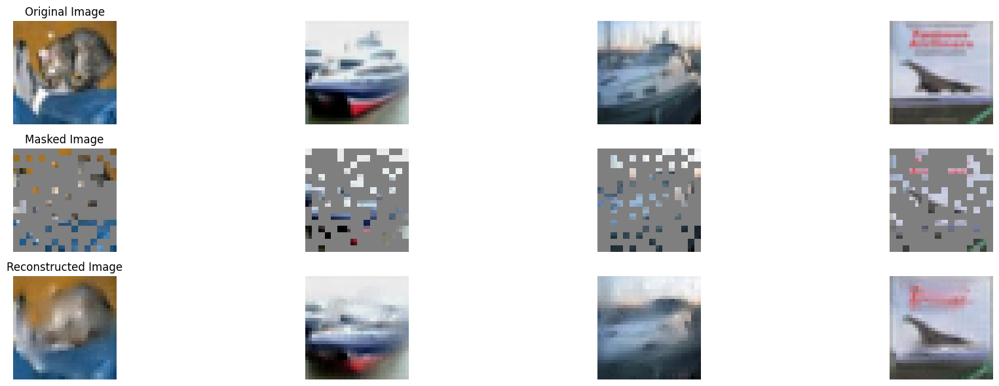

100%|██████████| 196/196 [00:57<00:00,  3.41it/s]


In epoch 161, average traning loss is 0.038733373947289526.
=================== EPOCH:  161  ===================


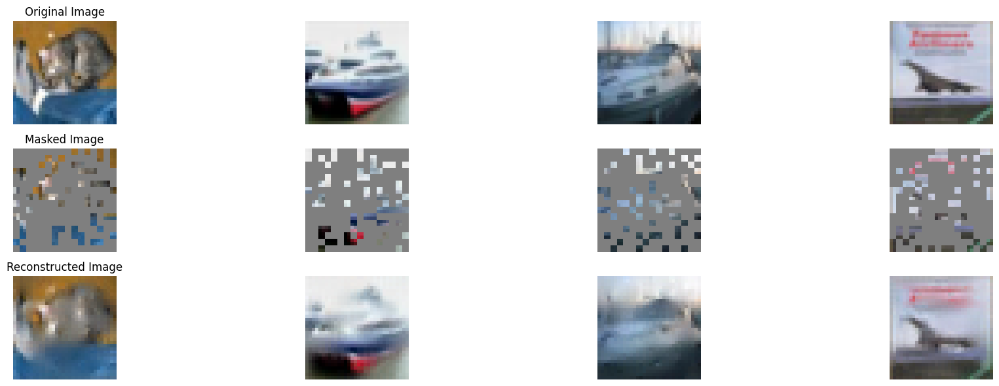

100%|██████████| 196/196 [00:57<00:00,  3.40it/s]


In epoch 162, average traning loss is 0.03868631425560737.
=================== EPOCH:  162  ===================


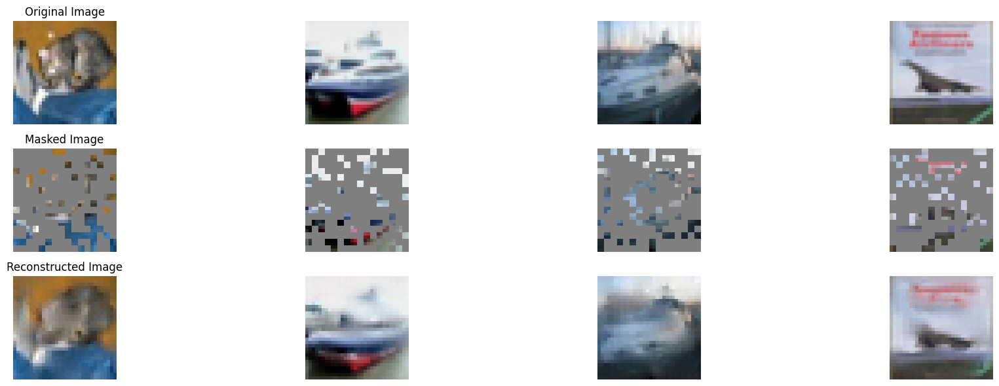

100%|██████████| 196/196 [00:56<00:00,  3.46it/s]


In epoch 163, average traning loss is 0.038644464287374704.
=================== EPOCH:  163  ===================


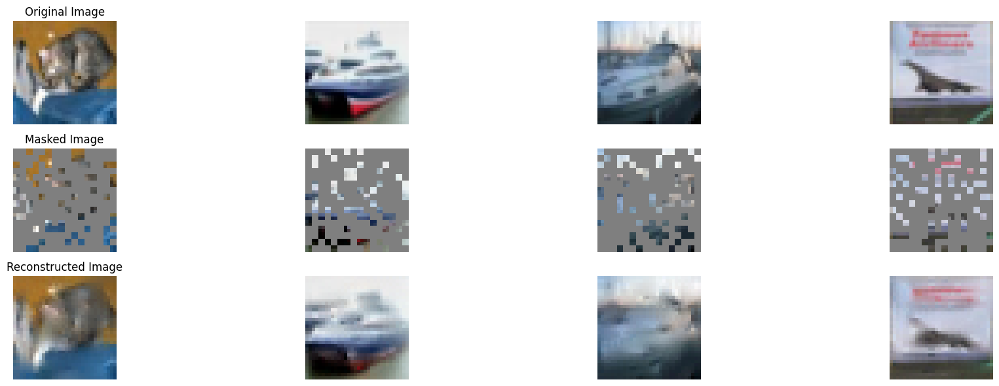

100%|██████████| 196/196 [00:56<00:00,  3.46it/s]


In epoch 164, average traning loss is 0.03854379569161303.
=================== EPOCH:  164  ===================


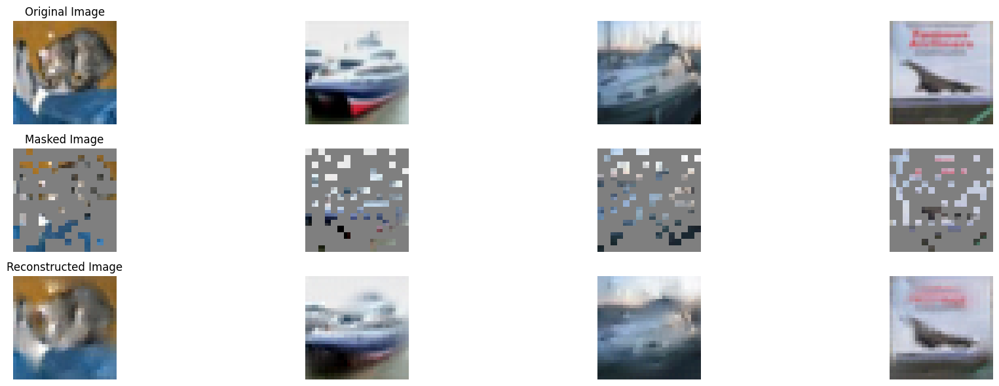

100%|██████████| 196/196 [00:57<00:00,  3.40it/s]


In epoch 165, average traning loss is 0.038612451119234364.
=================== EPOCH:  165  ===================


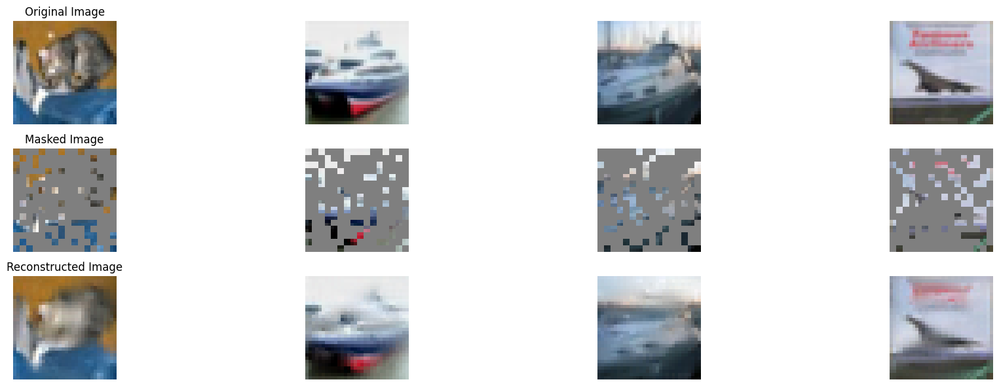

100%|██████████| 196/196 [00:57<00:00,  3.42it/s]


In epoch 166, average traning loss is 0.03848230015790584.
=================== EPOCH:  166  ===================


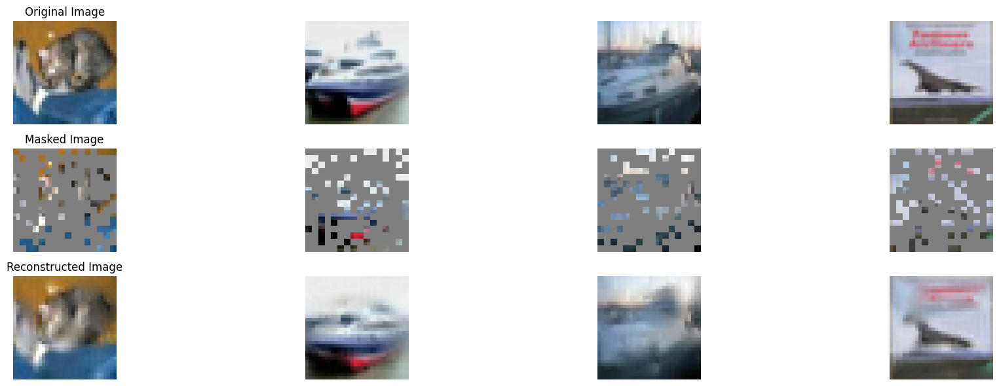

100%|██████████| 196/196 [00:57<00:00,  3.41it/s]


In epoch 167, average traning loss is 0.03856607686196055.
=================== EPOCH:  167  ===================


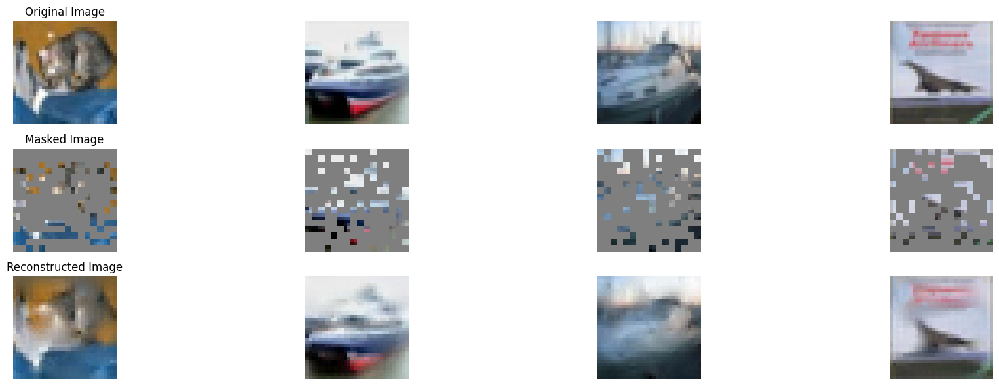

100%|██████████| 196/196 [00:57<00:00,  3.42it/s]


In epoch 168, average traning loss is 0.0384763416130932.
=================== EPOCH:  168  ===================


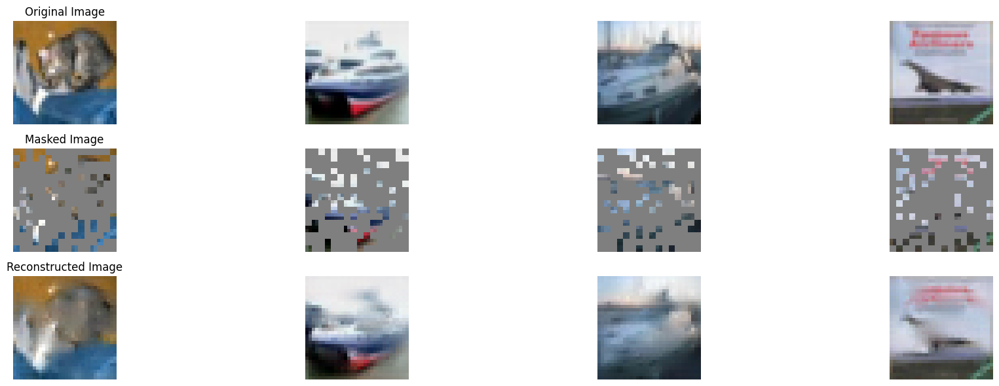

100%|██████████| 196/196 [00:56<00:00,  3.47it/s]


In epoch 169, average traning loss is 0.038467387573755514.
=================== EPOCH:  169  ===================


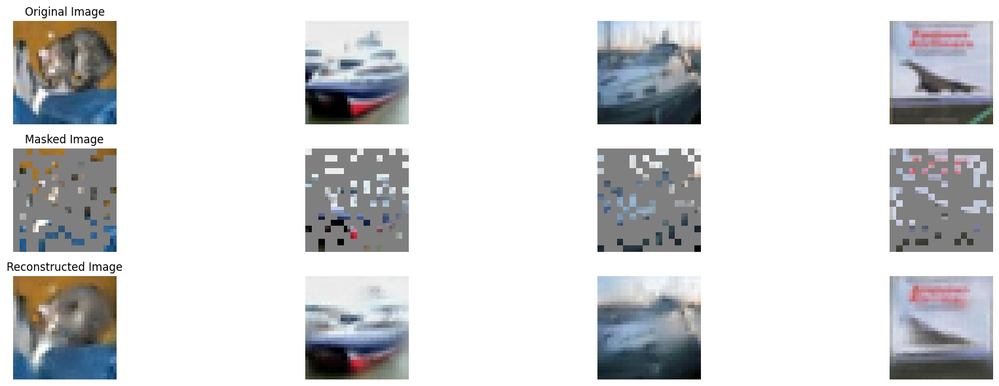

100%|██████████| 196/196 [00:56<00:00,  3.45it/s]


In epoch 170, average traning loss is 0.038420689786423226.
=================== EPOCH:  170  ===================


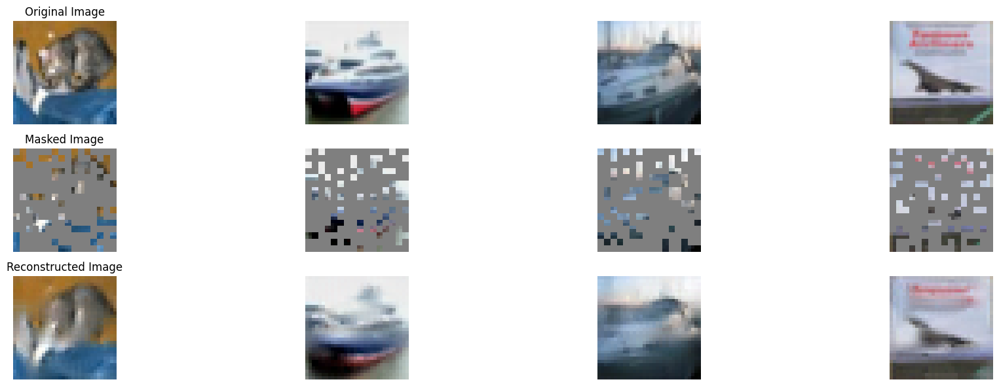

100%|██████████| 196/196 [00:56<00:00,  3.47it/s]


In epoch 171, average traning loss is 0.03840559694383826.
=================== EPOCH:  171  ===================


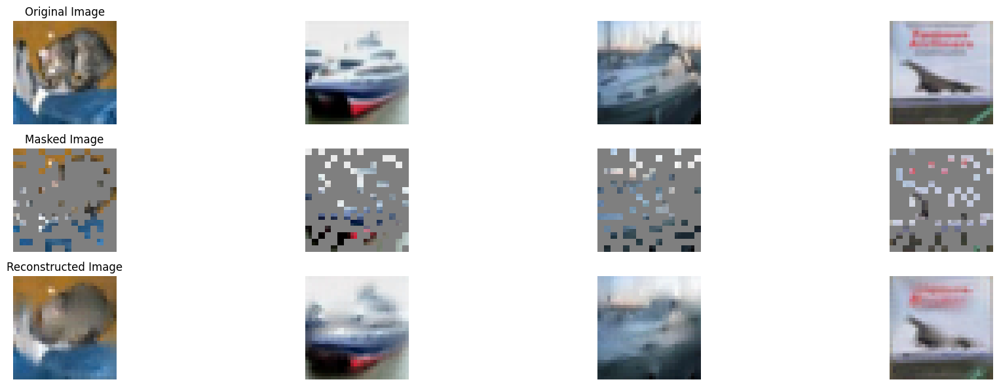

100%|██████████| 196/196 [00:56<00:00,  3.46it/s]


In epoch 172, average traning loss is 0.038397563374316206.
=================== EPOCH:  172  ===================


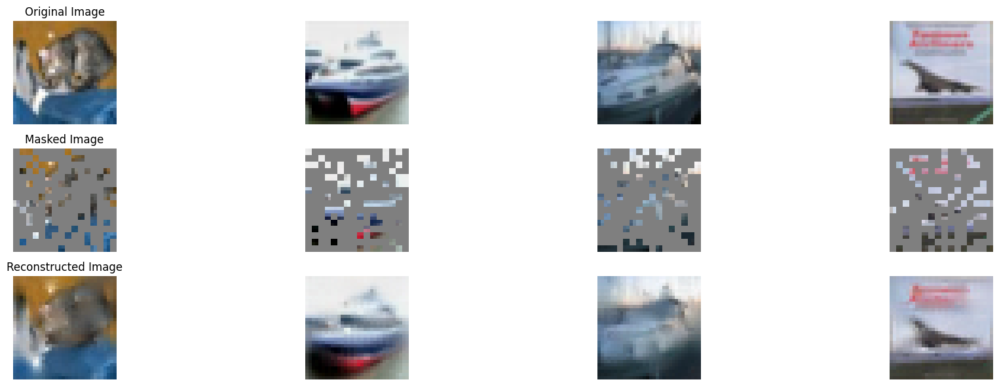

100%|██████████| 196/196 [00:56<00:00,  3.45it/s]


In epoch 173, average traning loss is 0.03845788985110667.
=================== EPOCH:  173  ===================


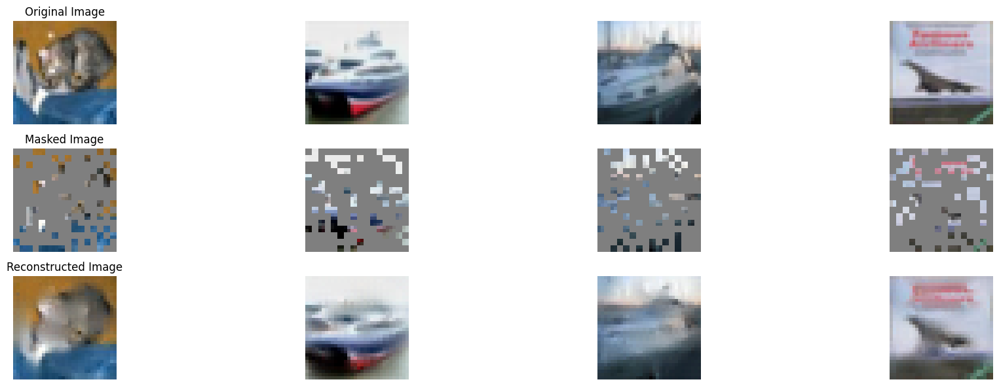

100%|██████████| 196/196 [00:55<00:00,  3.51it/s]


In epoch 174, average traning loss is 0.03833742069118485.
=================== EPOCH:  174  ===================


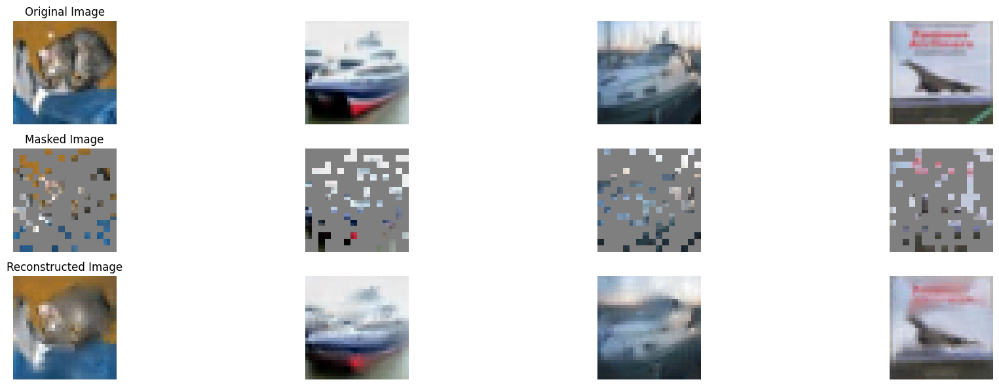

100%|██████████| 196/196 [00:55<00:00,  3.52it/s]


In epoch 175, average traning loss is 0.03823202538627143.
=================== EPOCH:  175  ===================


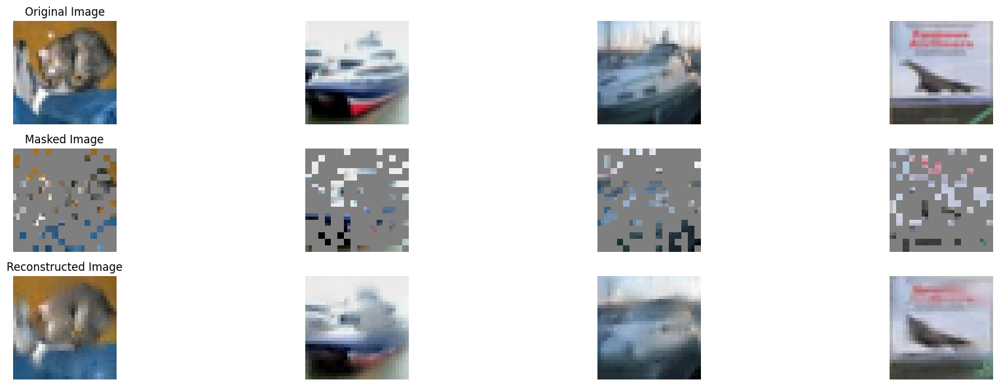

100%|██████████| 196/196 [00:56<00:00,  3.50it/s]


In epoch 176, average traning loss is 0.03830831471298422.
=================== EPOCH:  176  ===================


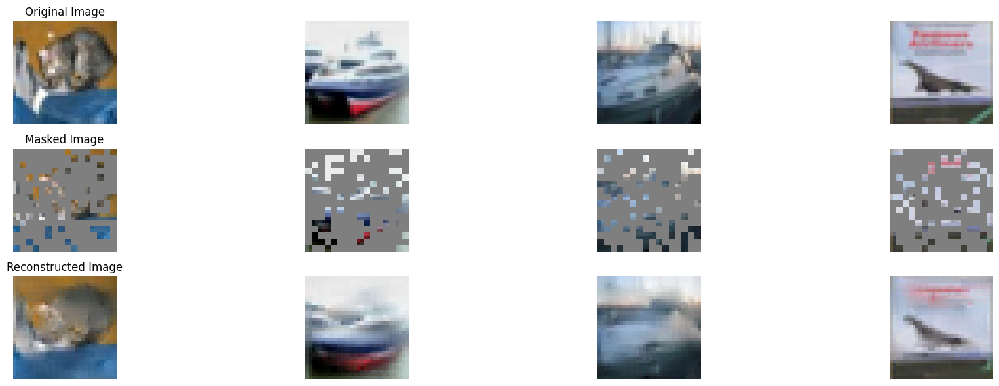

100%|██████████| 196/196 [00:56<00:00,  3.49it/s]


In epoch 177, average traning loss is 0.03836166756037546.
=================== EPOCH:  177  ===================


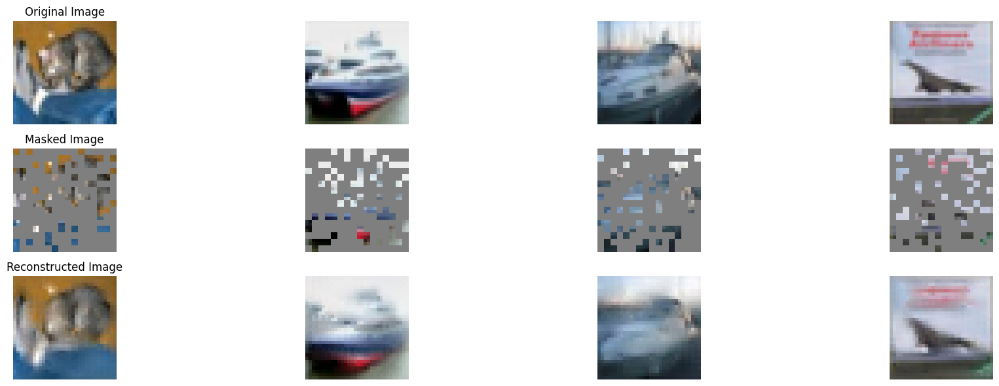

100%|██████████| 196/196 [00:56<00:00,  3.49it/s]


In epoch 178, average traning loss is 0.03824043401269889.
=================== EPOCH:  178  ===================


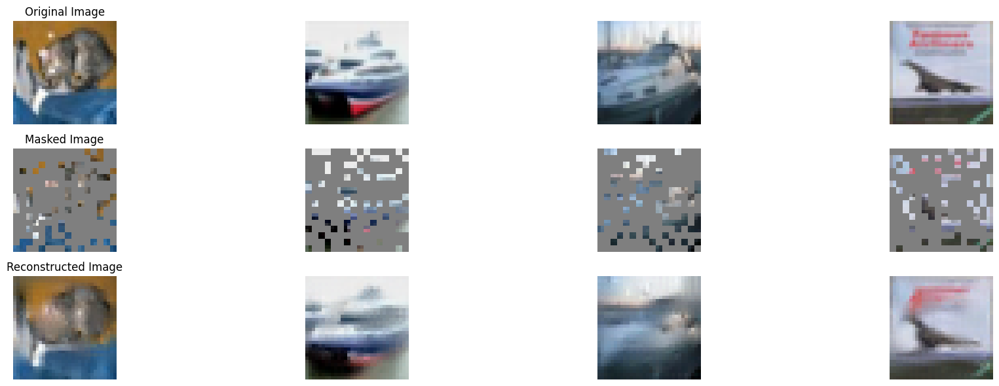

100%|██████████| 196/196 [00:55<00:00,  3.51it/s]


In epoch 179, average traning loss is 0.038210850056945064.
=================== EPOCH:  179  ===================


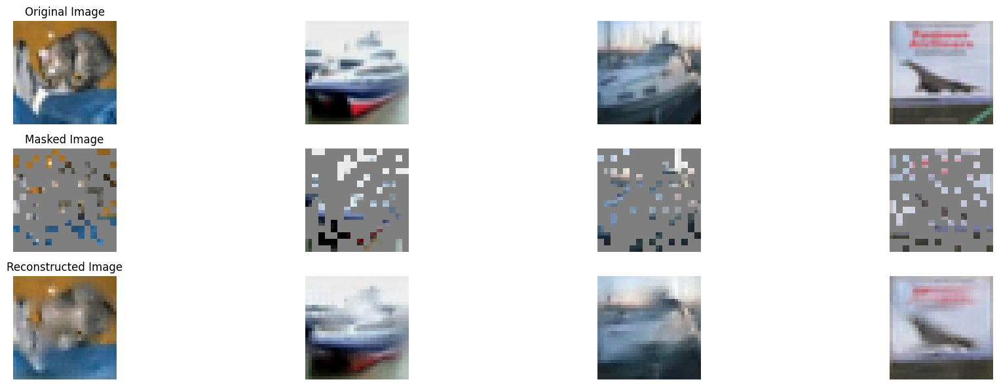

100%|██████████| 196/196 [00:55<00:00,  3.51it/s]


In epoch 180, average traning loss is 0.03823721929624373.
=================== EPOCH:  180  ===================


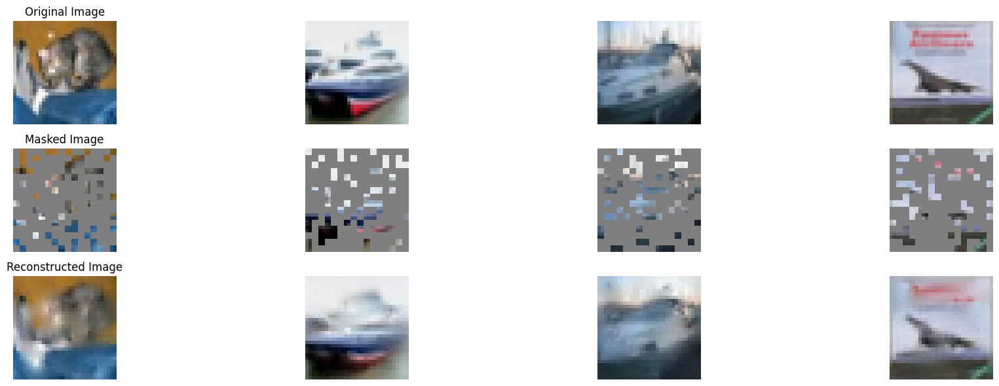

100%|██████████| 196/196 [00:56<00:00,  3.49it/s]


In epoch 181, average traning loss is 0.038217063061892986.
=================== EPOCH:  181  ===================


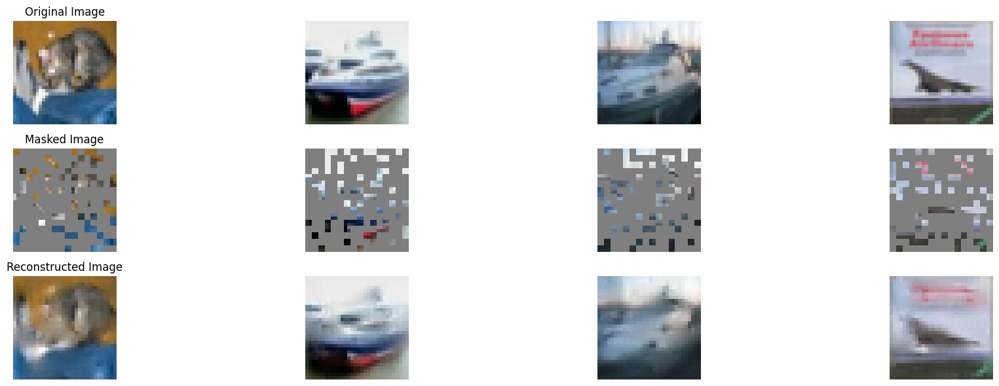

100%|██████████| 196/196 [00:55<00:00,  3.52it/s]


In epoch 182, average traning loss is 0.03816443655107703.
=================== EPOCH:  182  ===================


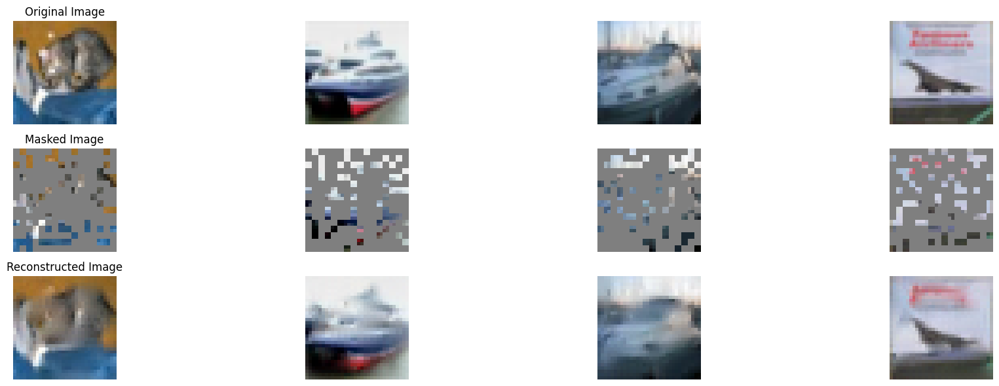

100%|██████████| 196/196 [00:56<00:00,  3.48it/s]


In epoch 183, average traning loss is 0.038151393188353706.
=================== EPOCH:  183  ===================


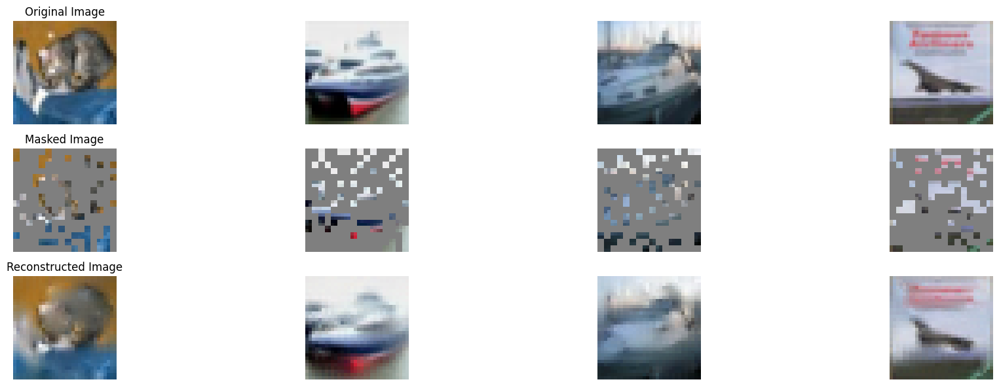

100%|██████████| 196/196 [00:56<00:00,  3.49it/s]


In epoch 184, average traning loss is 0.03816028479106572.
=================== EPOCH:  184  ===================


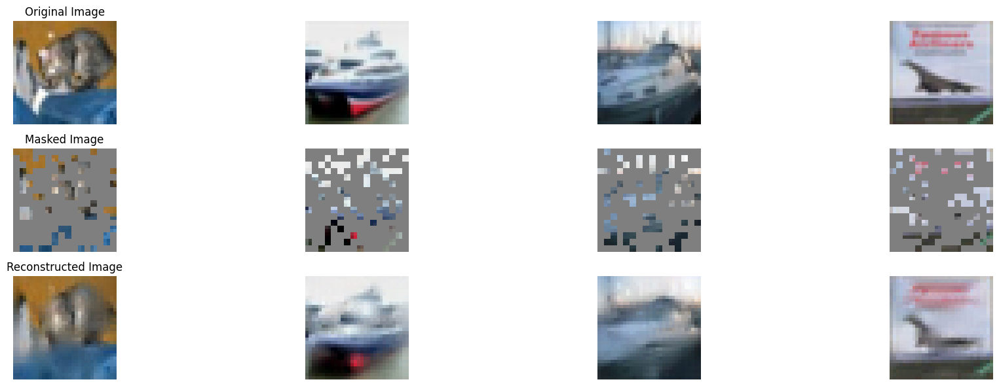

100%|██████████| 196/196 [00:55<00:00,  3.51it/s]


In epoch 185, average traning loss is 0.03815448107387947.
=================== EPOCH:  185  ===================


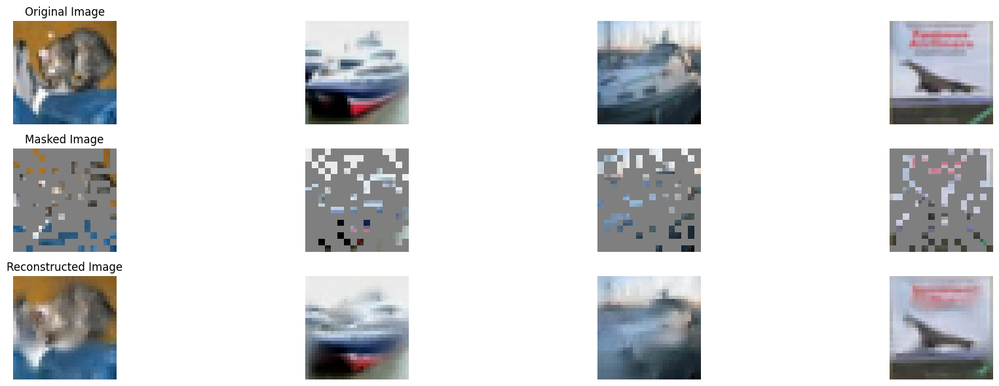

100%|██████████| 196/196 [00:55<00:00,  3.53it/s]


In epoch 186, average traning loss is 0.03818283228165641.
=================== EPOCH:  186  ===================


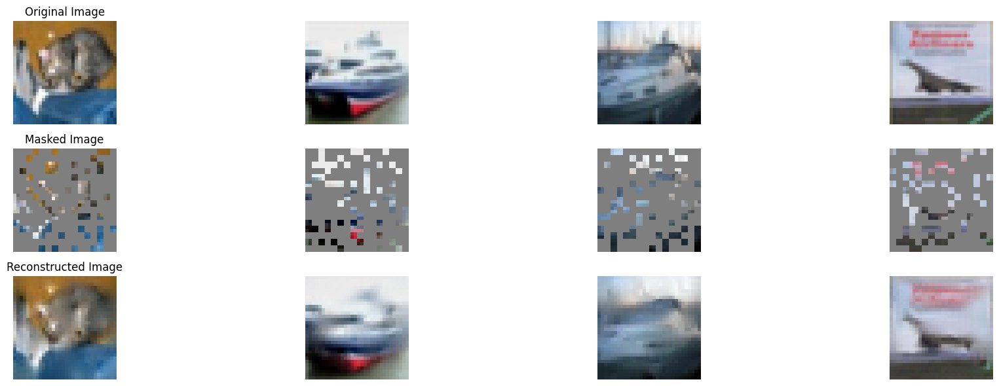

100%|██████████| 196/196 [00:55<00:00,  3.53it/s]


In epoch 187, average traning loss is 0.038145189895769774.
=================== EPOCH:  187  ===================


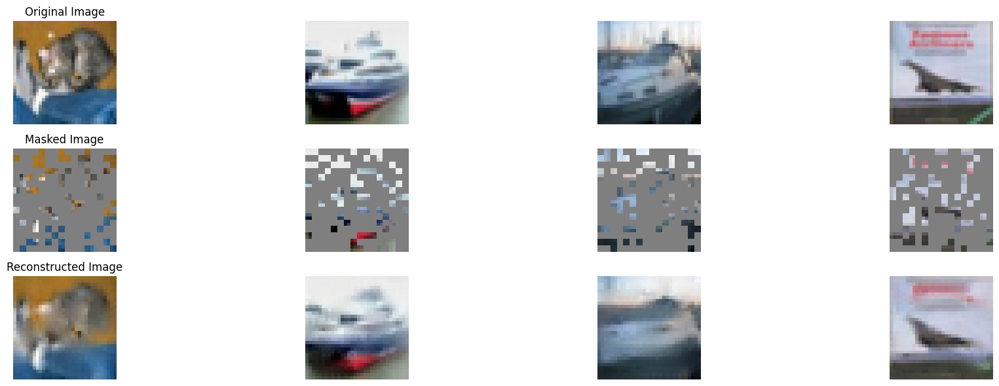

100%|██████████| 196/196 [00:56<00:00,  3.49it/s]


In epoch 188, average traning loss is 0.03812315430948321.
=================== EPOCH:  188  ===================


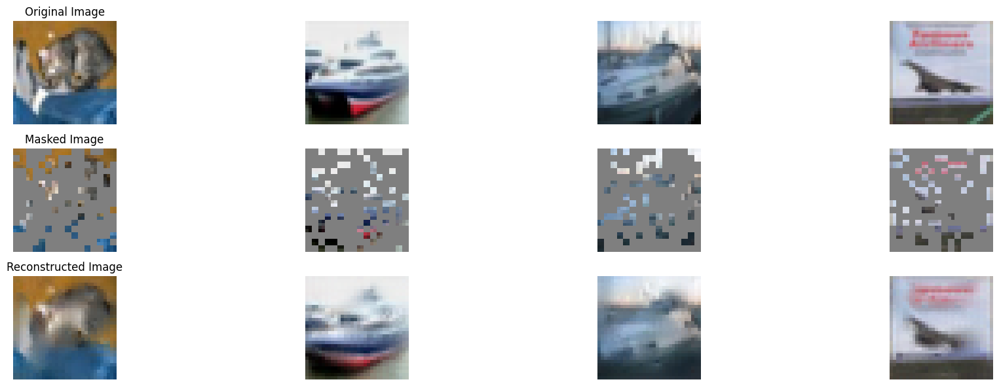

100%|██████████| 196/196 [00:56<00:00,  3.49it/s]


In epoch 189, average traning loss is 0.03814515579795959.
=================== EPOCH:  189  ===================


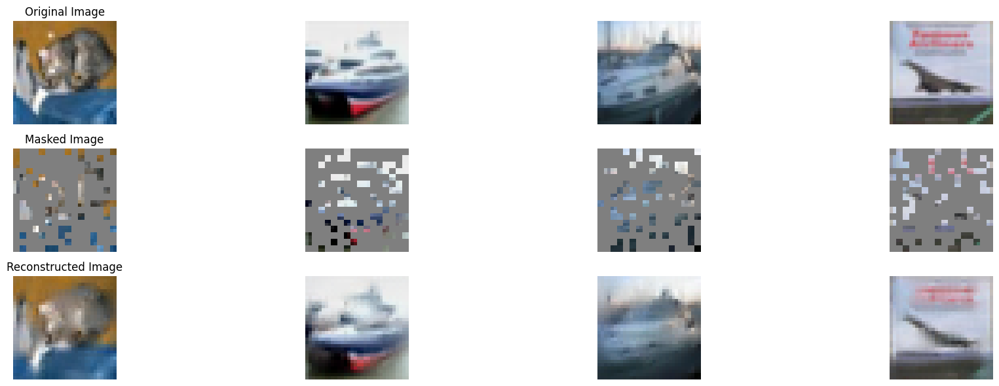

100%|██████████| 196/196 [00:56<00:00,  3.48it/s]


In epoch 190, average traning loss is 0.03808587576661791.
=================== EPOCH:  190  ===================


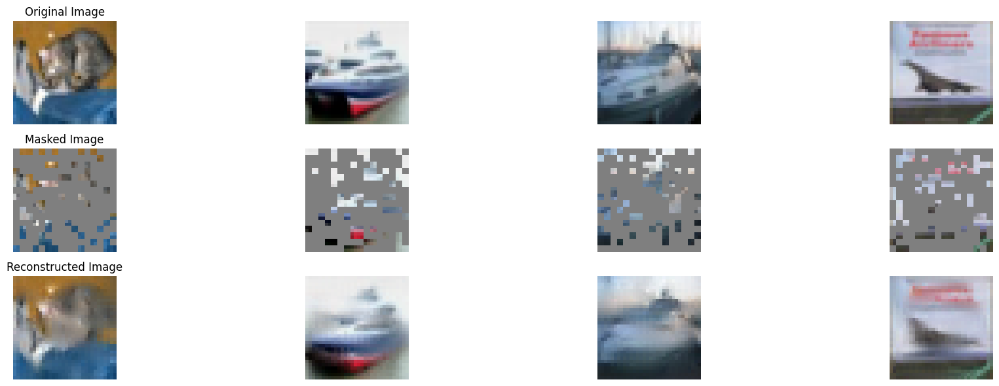

100%|██████████| 196/196 [00:55<00:00,  3.52it/s]


In epoch 191, average traning loss is 0.038099950426543246.
=================== EPOCH:  191  ===================


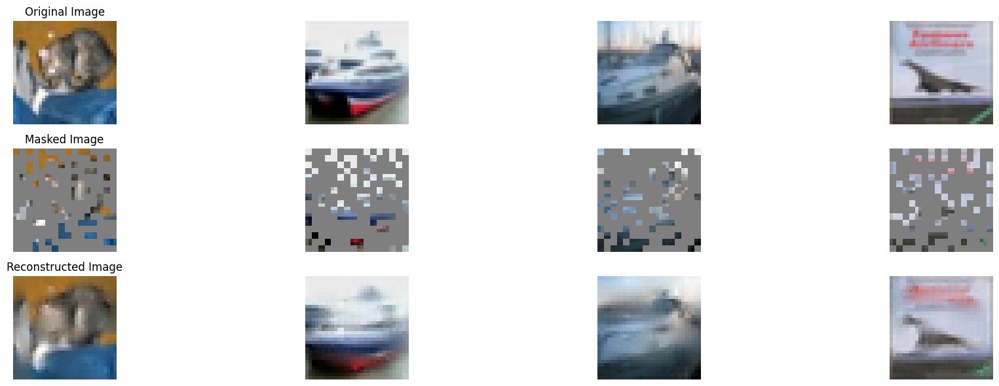

100%|██████████| 196/196 [00:55<00:00,  3.51it/s]


In epoch 192, average traning loss is 0.03811789606222693.
=================== EPOCH:  192  ===================


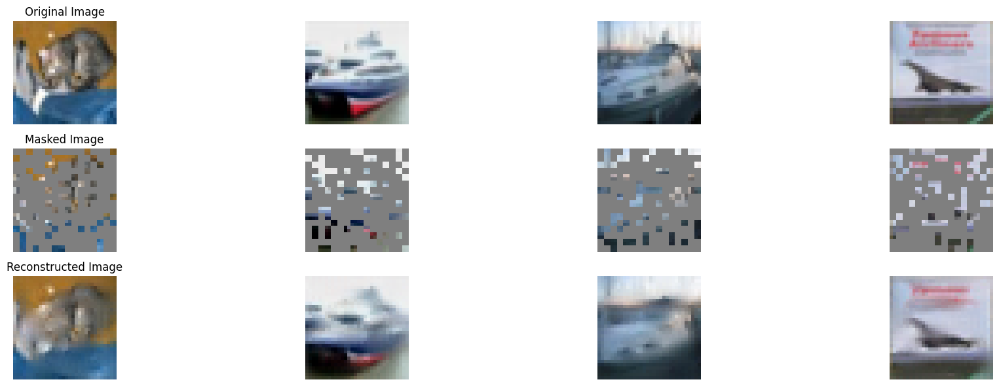

100%|██████████| 196/196 [00:56<00:00,  3.50it/s]


In epoch 193, average traning loss is 0.038148959186308236.
=================== EPOCH:  193  ===================


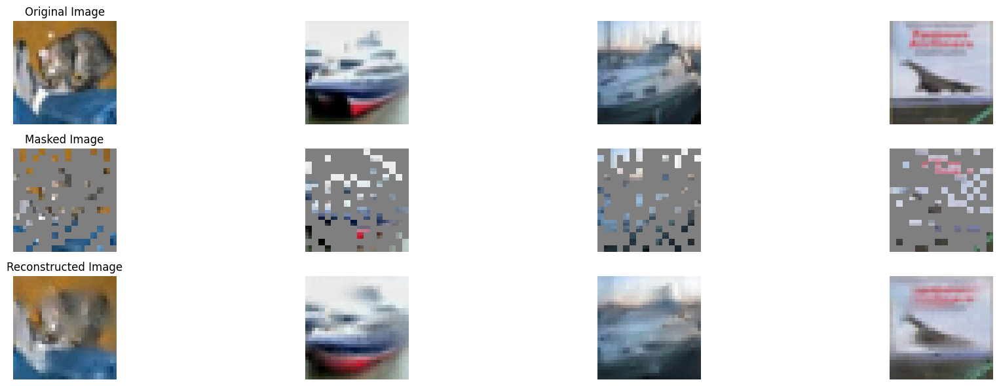

100%|██████████| 196/196 [00:56<00:00,  3.49it/s]


In epoch 194, average traning loss is 0.038124063337335784.
=================== EPOCH:  194  ===================


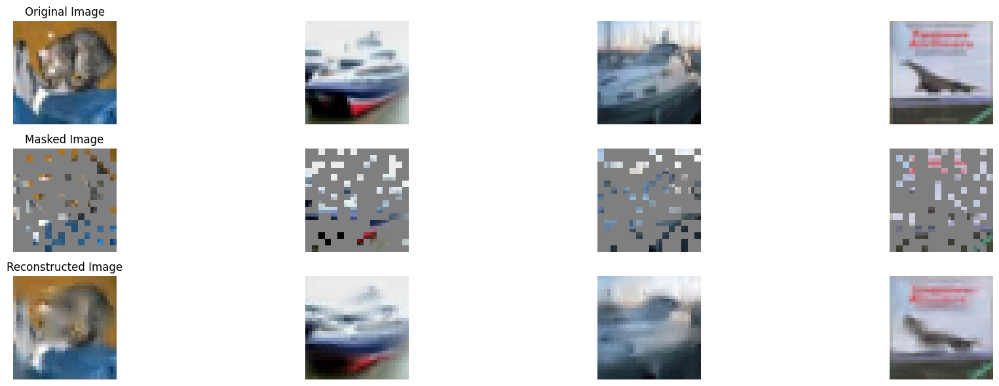

100%|██████████| 196/196 [00:55<00:00,  3.51it/s]


In epoch 195, average traning loss is 0.038112838182370275.
=================== EPOCH:  195  ===================


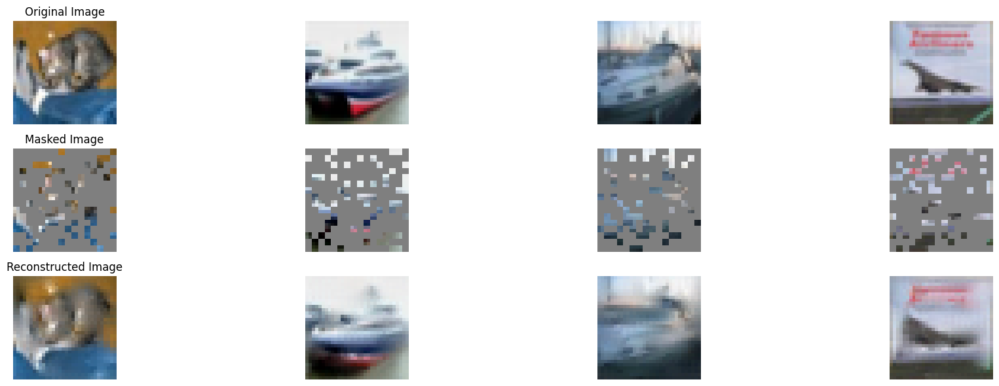

100%|██████████| 196/196 [00:56<00:00,  3.48it/s]


In epoch 196, average traning loss is 0.03806095110366539.
=================== EPOCH:  196  ===================


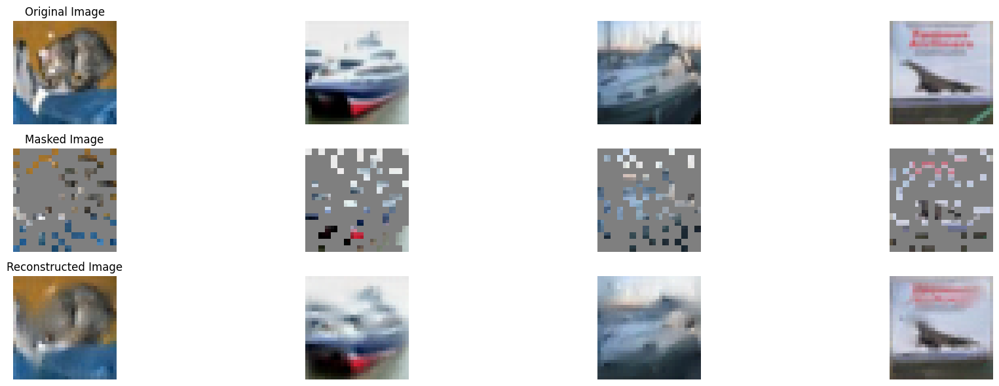

100%|██████████| 196/196 [00:55<00:00,  3.51it/s]


In epoch 197, average traning loss is 0.038116080781482924.
=================== EPOCH:  197  ===================


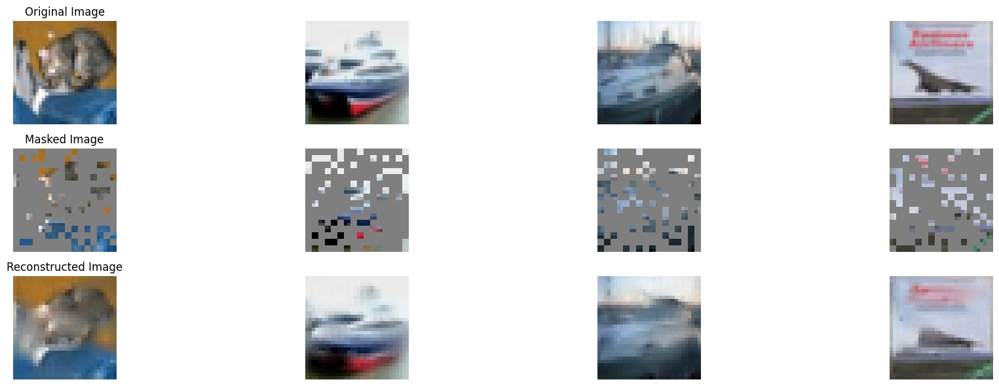

100%|██████████| 196/196 [00:56<00:00,  3.49it/s]


In epoch 198, average traning loss is 0.03805906369293831.
=================== EPOCH:  198  ===================


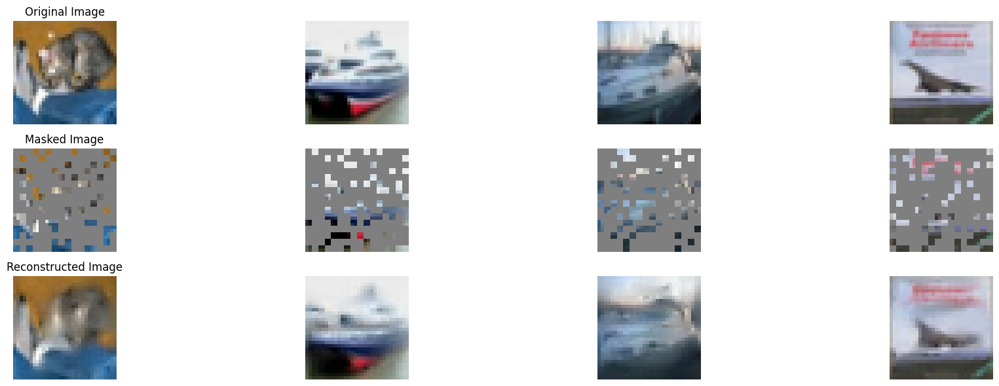

100%|██████████| 196/196 [00:56<00:00,  3.50it/s]


In epoch 199, average traning loss is 0.03813475875982216.
=================== EPOCH:  199  ===================


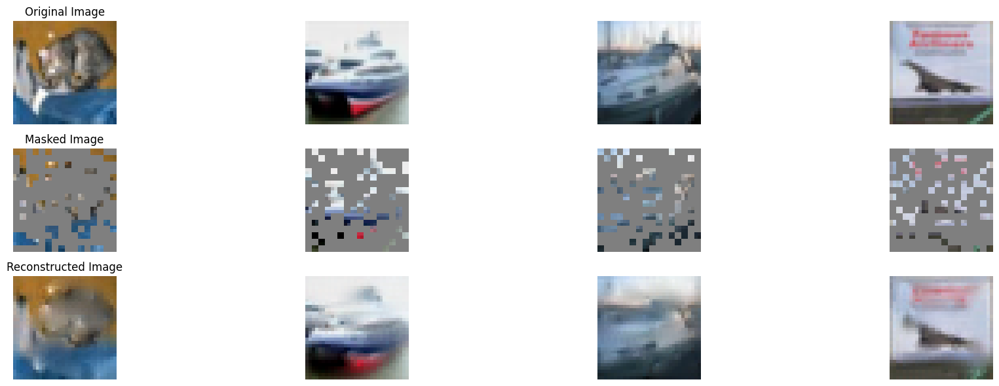

In [32]:
# GPU 6660MiB
import matplotlib.pyplot as plt
step_count = 0
optim.zero_grad()
for e in range(total_epoch):
    model.train()
    losses = []
    for img, label in tqdm(iter(dataloader)):
        step_count += 1
        img = img.to(device)
        predicted_img, mask = model(img)
        loss = torch.mean((predicted_img - img) ** 2 * mask) / mask_ratio
        loss.backward()
        if step_count % steps_per_update == 0:
            optim.step()
            optim.zero_grad()
        losses.append(loss.item())
    lr_scheduler.step()
    avg_loss = sum(losses) / len(losses)
    writer.add_scalar('mae_loss', avg_loss, global_step=e)
    print(f'In epoch {e}, average traning loss is {avg_loss}.')
    
    model.eval()
    with torch.no_grad():
        val_img = torch.stack([val_dataset[i][0] for i in range(16)])
        val_img = val_img.to(device)
        predicted_val_img, mask = model(val_img)
        predicted_val_img = predicted_val_img * mask + val_img * (1 - mask)
        img = torch.cat([val_img * (1 - mask), predicted_val_img, val_img], dim=0)
        img = rearrange(img, '(v h1 w1) c h w -> c (h1 h) (w1 v w)', w1=2, v=3)
        writer.add_image('mae_image', (img + 1) / 2, global_step=e)

        # Inside the visualization block, apply denormalization before displaying
        fig, axes = plt.subplots(3, 4, figsize=(20, 6))
        print("=================== EPOCH: ", e, " ===================")
        for i in range(4):
            # Denormalize and clip to [0, 1] for safe visualization
            original_img = denormalize(val_img[i]).clamp(0, 1)
            masked_img = denormalize(val_img[i] * (1 - mask[i])).clamp(0, 1)
            reconstructed_img = denormalize(predicted_val_img[i]).clamp(0, 1)
        
            # Original Image
            axes[0, i].imshow(original_img.permute(1, 2, 0).cpu().numpy())
            axes[0, i].axis('off')
            if i == 0:
                axes[0, i].set_title("Original Image")
        
            # Masked Image
            axes[1, i].imshow(masked_img.permute(1, 2, 0).cpu().numpy())
            axes[1, i].axis('off')
            if i == 0:
                axes[1, i].set_title("Masked Image")
        
            # Reconstructed Image
            axes[2, i].imshow(reconstructed_img.permute(1, 2, 0).cpu().numpy())
            axes[2, i].axis('off')
            if i == 0:
                axes[2, i].set_title("Reconstructed Image")
        plt.tight_layout()
        plt.show()
        
    ''' save model '''
    torch.save(model, model_path)

## Train a Classifier

In [33]:
seed=42
batch_size=128
max_device_batch_size=256
base_learning_rate=1e-3
weight_decay=0.05
total_epoch=50
warmup_epoch=5
pretrained_model_path=None
output_model_path='saved/vit-t-classifier-from_scratch-cifar10.pt'


model = torch.load("saved/vit-t-mae-cifar10.pt", map_location='cpu')

model = MAE_ViT()
writer = SummaryWriter(os.path.join('logs', 'cifar10', 'scratch-cls'))
model = ViT_Classifier(model.encoder, num_classes=10).to(device)

loss_fn = torch.nn.CrossEntropyLoss()
acc_fn = lambda logit, label: torch.mean((logit.argmax(dim=-1) == label).float())

optim = torch.optim.AdamW(model.parameters(), lr=base_learning_rate * batch_size / 256, betas=(0.9, 0.999), weight_decay=weight_decay)
lr_func = lambda epoch: min((epoch + 1) / (warmup_epoch + 1e-8), 0.5 * (math.cos(epoch / total_epoch * math.pi) + 1))
lr_scheduler = torch.optim.lr_scheduler.LambdaLR(optim, lr_lambda=lr_func, verbose=True)


/tmp/ipykernel_30500/1224148689.py:12: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load("saved/vit-t-mae-cifar10.pt", map_location='cpu')


In [34]:
val_dataloader = torch.utils.data.DataLoader(val_dataset, load_batch_size, shuffle=False, num_workers=4)

In [35]:
best_val_acc = 0
step_count = 0
optim.zero_grad()
for e in range(total_epoch):
    model.train()
    losses = []
    acces = []
    for img, label in tqdm(iter(dataloader)):
        step_count += 1
        img = img.to(device)
        label = label.to(device)
        logits = model(img)
        loss = loss_fn(logits, label)
        acc = acc_fn(logits, label)
        loss.backward()
        if step_count % steps_per_update == 0:
            optim.step()
            optim.zero_grad()
        losses.append(loss.item())
        acces.append(acc.item())
    lr_scheduler.step()
    avg_train_loss = sum(losses) / len(losses)
    avg_train_acc = sum(acces) / len(acces)
    print(f'In epoch {e}, average training loss is {avg_train_loss}, average training acc is {avg_train_acc}.')

    model.eval()
    with torch.no_grad():
        losses = []
        acces = []
        for img, label in tqdm(iter(val_dataloader)):
            img = img.to(device)
            label = label.to(device)
            logits = model(img)
            loss = loss_fn(logits, label)
            acc = acc_fn(logits, label)
            losses.append(loss.item())
            acces.append(acc.item())
        avg_val_loss = sum(losses) / len(losses)
        avg_val_acc = sum(acces) / len(acces)
        print(f'In epoch {e}, average validation loss is {avg_val_loss}, average validation acc is {avg_val_acc}.')  

    if avg_val_acc > best_val_acc:
        best_val_acc = avg_val_acc
        print(f'saving best model with acc {best_val_acc} at {e} epoch!')       
        torch.save(model, output_model_path)

    writer.add_scalars('cls/loss', {'train' : avg_train_loss, 'val' : avg_val_loss}, global_step=e)
    writer.add_scalars('cls/acc', {'train' : avg_train_acc, 'val' : avg_val_acc}, global_step=e)

100%|██████████| 196/196 [01:32<00:00,  2.11it/s]

In epoch 0, average training loss is 1.8904495227093598, average training acc is 0.297421077836533.



100%|██████████| 40/40 [00:05<00:00,  6.91it/s]

In epoch 0, average validation loss is 1.6855077356100083, average validation acc is 0.362109375.
saving best model with acc 0.362109375 at 0 epoch!



100%|██████████| 196/196 [01:34<00:00,  2.08it/s]

In epoch 1, average training loss is 1.5911450811794825, average training acc is 0.4162388393769459.



100%|██████████| 40/40 [00:06<00:00,  6.60it/s]


In epoch 1, average validation loss is 1.4675661444664, average validation acc is 0.45849609375.
saving best model with acc 0.45849609375 at 1 epoch!


100%|██████████| 196/196 [01:34<00:00,  2.08it/s]

In epoch 2, average training loss is 1.4055644632602224, average training acc is 0.48673469390796154.



100%|██████████| 40/40 [00:05<00:00,  6.71it/s]


In epoch 2, average validation loss is 1.3733867943286895, average validation acc is 0.49599609375.
saving best model with acc 0.49599609375 at 2 epoch!


100%|██████████| 196/196 [01:33<00:00,  2.09it/s]

In epoch 3, average training loss is 1.2529859895608864, average training acc is 0.5467753507653061.



100%|██████████| 40/40 [00:06<00:00,  6.63it/s]


In epoch 3, average validation loss is 1.2401162028312682, average validation acc is 0.5484375.
saving best model with acc 0.5484375 at 3 epoch!


100%|██████████| 196/196 [01:34<00:00,  2.06it/s]

In epoch 4, average training loss is 1.1447250703159644, average training acc is 0.5852838009595871.



100%|██████████| 40/40 [00:05<00:00,  6.90it/s]


In epoch 4, average validation loss is 1.1289802461862564, average validation acc is 0.591796875.
saving best model with acc 0.591796875 at 4 epoch!


100%|██████████| 196/196 [01:35<00:00,  2.06it/s]

In epoch 5, average training loss is 1.0277964183870627, average training acc is 0.6306441325922402.



100%|██████████| 40/40 [00:06<00:00,  6.57it/s]


In epoch 5, average validation loss is 1.07954298555851, average validation acc is 0.61103515625.
saving best model with acc 0.61103515625 at 5 epoch!


100%|██████████| 196/196 [01:35<00:00,  2.06it/s]

In epoch 6, average training loss is 0.94352189618714, average training acc is 0.6601921237853109.



100%|██████████| 40/40 [00:05<00:00,  6.67it/s]

In epoch 6, average validation loss is 1.1162638649344445, average validation acc is 0.6029296875.



100%|██████████| 196/196 [01:36<00:00,  2.04it/s]

In epoch 7, average training loss is 0.8738422241746163, average training acc is 0.688412787050617.



100%|██████████| 40/40 [00:05<00:00,  6.86it/s]


In epoch 7, average validation loss is 0.992968612909317, average validation acc is 0.64404296875.
saving best model with acc 0.64404296875 at 7 epoch!


100%|██████████| 196/196 [01:35<00:00,  2.04it/s]

In epoch 8, average training loss is 0.8154439506482105, average training acc is 0.7083107461126483.



100%|██████████| 40/40 [00:05<00:00,  6.84it/s]


In epoch 8, average validation loss is 0.9374784380197525, average validation acc is 0.6734375.
saving best model with acc 0.6734375 at 8 epoch!


100%|██████████| 196/196 [01:36<00:00,  2.04it/s]

In epoch 9, average training loss is 0.7514214023035399, average training acc is 0.7331632652453014.



100%|██████████| 40/40 [00:05<00:00,  6.85it/s]


In epoch 9, average validation loss is 0.9317302465438843, average validation acc is 0.6740234375.
saving best model with acc 0.6740234375 at 9 epoch!


100%|██████████| 196/196 [01:35<00:00,  2.06it/s]

In epoch 10, average training loss is 0.7069283821144883, average training acc is 0.7483418367955149.



100%|██████████| 40/40 [00:05<00:00,  6.70it/s]

In epoch 10, average validation loss is 0.9590762093663215, average validation acc is 0.6611328125.



100%|██████████| 196/196 [01:35<00:00,  2.05it/s]

In epoch 12, average training loss is 0.6020023263230616, average training acc is 0.7863281250608211.



100%|██████████| 40/40 [00:06<00:00,  6.58it/s]


In epoch 12, average validation loss is 0.9057597219944, average validation acc is 0.68564453125.
saving best model with acc 0.68564453125 at 12 epoch!


100%|██████████| 196/196 [01:35<00:00,  2.05it/s]

In epoch 13, average training loss is 0.562764015885032, average training acc is 0.8011001275510204.



100%|██████████| 40/40 [00:06<00:00,  6.52it/s]


In epoch 13, average validation loss is 0.8850346803665161, average validation acc is 0.70107421875.
saving best model with acc 0.70107421875 at 13 epoch!


100%|██████████| 196/196 [01:35<00:00,  2.05it/s]

In epoch 15, average training loss is 0.463456604857834, average training acc is 0.8357661034987898.



100%|██████████| 196/196 [01:36<00:00,  2.03it/s]


In epoch 16, average training loss is 0.41970056903605557, average training acc is 0.8525390625.


100%|██████████| 40/40 [00:05<00:00,  6.82it/s]


In epoch 16, average validation loss is 0.9200690448284149, average validation acc is 0.70517578125.
saving best model with acc 0.70517578125 at 16 epoch!


100%|██████████| 196/196 [01:36<00:00,  2.04it/s]

In epoch 17, average training loss is 0.3599901718600672, average training acc is 0.8724489795918368.



100%|██████████| 40/40 [00:06<00:00,  6.57it/s]

In epoch 17, average validation loss is 1.0051167920231818, average validation acc is 0.70205078125.



100%|██████████| 196/196 [01:35<00:00,  2.06it/s]

In epoch 18, average training loss is 0.30999876824872835, average training acc is 0.8897441008261272.



100%|██████████| 40/40 [00:06<00:00,  6.67it/s]

In epoch 18, average validation loss is 1.0038545310497284, average validation acc is 0.6986328125.



100%|██████████| 196/196 [01:35<00:00,  2.06it/s]

In epoch 19, average training loss is 0.26980358689111106, average training acc is 0.9051737882653061.



100%|██████████| 40/40 [00:05<00:00,  6.69it/s]


In epoch 19, average validation loss is 0.9829986073076725, average validation acc is 0.71826171875.
saving best model with acc 0.71826171875 at 19 epoch!


100%|██████████| 196/196 [01:35<00:00,  2.06it/s]

In epoch 20, average training loss is 0.22069212984369727, average training acc is 0.9235251913873517.



100%|██████████| 40/40 [00:05<00:00,  6.81it/s]

In epoch 20, average validation loss is 1.1227694153785706, average validation acc is 0.708203125.



100%|██████████| 196/196 [01:34<00:00,  2.07it/s]

In epoch 21, average training loss is 0.19342788354474671, average training acc is 0.933350605928168.



100%|██████████| 40/40 [00:05<00:00,  6.88it/s]


In epoch 21, average validation loss is 1.1681232035160065, average validation acc is 0.70947265625.


100%|██████████| 196/196 [01:34<00:00,  2.07it/s]

In epoch 22, average training loss is 0.14237372014595537, average training acc is 0.9499601402453014.



100%|██████████| 40/40 [00:05<00:00,  6.88it/s]

In epoch 22, average validation loss is 1.183333444595337, average validation acc is 0.70693359375.



100%|██████████| 196/196 [01:34<00:00,  2.07it/s]

In epoch 23, average training loss is 0.13159008632052918, average training acc is 0.9546157526118415.



100%|██████████| 40/40 [00:06<00:00,  6.62it/s]


In epoch 23, average validation loss is 1.2099773950874806, average validation acc is 0.70859375.


100%|██████████| 196/196 [01:35<00:00,  2.05it/s]

In epoch 24, average training loss is 0.09831155492563029, average training acc is 0.9659996811224489.



100%|██████████| 40/40 [00:05<00:00,  6.87it/s]

In epoch 24, average validation loss is 1.3090580865740775, average validation acc is 0.71044921875.



100%|██████████| 196/196 [01:35<00:00,  2.06it/s]

In epoch 25, average training loss is 0.08507541886397771, average training acc is 0.9707270407555054.



100%|██████████| 40/40 [00:06<00:00,  6.60it/s]

In epoch 25, average validation loss is 1.3015467673540115, average validation acc is 0.71630859375.



100%|██████████| 196/196 [01:36<00:00,  2.04it/s]

In epoch 26, average training loss is 0.06677556924559937, average training acc is 0.9772680167640958.



100%|██████████| 40/40 [00:05<00:00,  6.82it/s]

In epoch 26, average validation loss is 1.423921027779579, average validation acc is 0.71767578125.



100%|██████████| 196/196 [01:35<00:00,  2.04it/s]

In epoch 27, average training loss is 0.05417041478640571, average training acc is 0.9820352360910299.



100%|██████████| 40/40 [00:06<00:00,  6.66it/s]


In epoch 27, average validation loss is 1.3851949185132981, average validation acc is 0.7201171875.
saving best model with acc 0.7201171875 at 27 epoch!


100%|██████████| 196/196 [01:35<00:00,  2.06it/s]

In epoch 28, average training loss is 0.04170959373479899, average training acc is 0.9863042092444946.



100%|██████████| 40/40 [00:06<00:00,  6.55it/s]

In epoch 28, average validation loss is 1.512946256995201, average validation acc is 0.7142578125.



100%|██████████| 196/196 [01:35<00:00,  2.05it/s]

In epoch 29, average training loss is 0.041413550258005916, average training acc is 0.9861049107751068.



100%|██████████| 40/40 [00:05<00:00,  6.70it/s]

In epoch 29, average validation loss is 1.5293087348341943, average validation acc is 0.7173828125.



100%|██████████| 196/196 [01:35<00:00,  2.06it/s]

In epoch 30, average training loss is 0.031030163332838947, average training acc is 0.9895328444485761.



100%|██████████| 40/40 [00:05<00:00,  6.89it/s]

In epoch 30, average validation loss is 1.4797769755125045, average validation acc is 0.71904296875.



100%|██████████| 196/196 [01:35<00:00,  2.05it/s]

In epoch 31, average training loss is 0.01768913020009213, average training acc is 0.994256218173066.



100%|██████████| 40/40 [00:05<00:00,  6.84it/s]

In epoch 31, average validation loss is 1.6042848095297813, average validation acc is 0.7181640625.



100%|██████████| 196/196 [01:35<00:00,  2.05it/s]

In epoch 32, average training loss is 0.02410070916842099, average training acc is 0.9921875.



100%|██████████| 40/40 [00:05<00:00,  6.84it/s]


In epoch 32, average validation loss is 1.5843661993741989, average validation acc is 0.7208984375.
saving best model with acc 0.7208984375 at 32 epoch!


100%|██████████| 196/196 [01:35<00:00,  2.06it/s]

In epoch 33, average training loss is 0.006742999906775219, average training acc is 0.9981664540816326.



100%|██████████| 40/40 [00:06<00:00,  6.54it/s]


In epoch 33, average validation loss is 1.634513746201992, average validation acc is 0.726171875.
saving best model with acc 0.726171875 at 33 epoch!


100%|██████████| 196/196 [01:35<00:00,  2.06it/s]

In epoch 34, average training loss is 0.0028580834670942656, average training acc is 0.9994818239795918.



100%|██████████| 40/40 [00:05<00:00,  6.90it/s]


In epoch 34, average validation loss is 1.712127536535263, average validation acc is 0.7271484375.
saving best model with acc 0.7271484375 at 34 epoch!


100%|██████████| 196/196 [01:35<00:00,  2.06it/s]


In epoch 35, average training loss is 0.004141848860427319, average training acc is 0.9988042091836735.


100%|██████████| 40/40 [00:05<00:00,  6.80it/s]

In epoch 35, average validation loss is 1.759585751593113, average validation acc is 0.7201171875.



100%|██████████| 196/196 [01:35<00:00,  2.06it/s]

In epoch 36, average training loss is 0.002641794702385039, average training acc is 0.9995416135204082.



100%|██████████| 40/40 [00:05<00:00,  6.72it/s]


In epoch 36, average validation loss is 1.7646531283855438, average validation acc is 0.72900390625.
saving best model with acc 0.72900390625 at 36 epoch!


100%|██████████| 196/196 [01:34<00:00,  2.07it/s]

In epoch 37, average training loss is 0.0012188637016634504, average training acc is 0.9998405612244898.



100%|██████████| 40/40 [00:05<00:00,  6.70it/s]


In epoch 37, average validation loss is 1.7620504915714263, average validation acc is 0.73095703125.
saving best model with acc 0.73095703125 at 37 epoch!


100%|██████████| 196/196 [01:35<00:00,  2.06it/s]

In epoch 38, average training loss is 0.0003688317549543227, average training acc is 1.0.



100%|██████████| 40/40 [00:05<00:00,  6.81it/s]


In epoch 38, average validation loss is 1.7812875539064408, average validation acc is 0.73017578125.


100%|██████████| 196/196 [01:35<00:00,  2.06it/s]

In epoch 39, average training loss is 0.00029116106868189363, average training acc is 1.0.



100%|██████████| 40/40 [00:05<00:00,  6.71it/s]


In epoch 39, average validation loss is 1.7965728327631951, average validation acc is 0.7326171875.
saving best model with acc 0.7326171875 at 39 epoch!


100%|██████████| 196/196 [01:34<00:00,  2.07it/s]

In epoch 40, average training loss is 0.00026235461849196605, average training acc is 1.0.



100%|██████████| 40/40 [00:05<00:00,  6.79it/s]


In epoch 40, average validation loss is 1.808771163225174, average validation acc is 0.73408203125.
saving best model with acc 0.73408203125 at 40 epoch!


100%|██████████| 196/196 [01:35<00:00,  2.06it/s]

In epoch 41, average training loss is 0.00024381289092291678, average training acc is 1.0.



100%|██████████| 40/40 [00:05<00:00,  6.88it/s]


In epoch 41, average validation loss is 1.8184056773781776, average validation acc is 0.734765625.
saving best model with acc 0.734765625 at 41 epoch!


100%|██████████| 196/196 [01:34<00:00,  2.07it/s]

In epoch 42, average training loss is 0.00023112222630998632, average training acc is 1.0.



100%|██████████| 40/40 [00:05<00:00,  6.82it/s]


In epoch 42, average validation loss is 1.8262695655226708, average validation acc is 0.73505859375.
saving best model with acc 0.73505859375 at 42 epoch!


100%|██████████| 196/196 [01:35<00:00,  2.06it/s]

In epoch 43, average training loss is 0.00022134088423478475, average training acc is 1.0.



100%|██████████| 40/40 [00:05<00:00,  6.83it/s]

In epoch 43, average validation loss is 1.8324083134531974, average validation acc is 0.734765625.



100%|██████████| 196/196 [01:35<00:00,  2.06it/s]

In epoch 44, average training loss is 0.00021453843866617477, average training acc is 1.0.



100%|██████████| 40/40 [00:06<00:00,  6.63it/s]

In epoch 44, average validation loss is 1.837276117503643, average validation acc is 0.7349609375.



100%|██████████| 196/196 [01:35<00:00,  2.06it/s]

In epoch 45, average training loss is 0.00020907142941129623, average training acc is 1.0.



100%|██████████| 40/40 [00:05<00:00,  6.75it/s]

In epoch 45, average validation loss is 1.8409246176481247, average validation acc is 0.734765625.



100%|██████████| 196/196 [01:35<00:00,  2.05it/s]

In epoch 46, average training loss is 0.0002052437174621, average training acc is 1.0.



100%|██████████| 40/40 [00:06<00:00,  6.57it/s]

In epoch 46, average validation loss is 1.8434610396623612, average validation acc is 0.734765625.



100%|██████████| 196/196 [01:35<00:00,  2.06it/s]

In epoch 47, average training loss is 0.00020302021532968086, average training acc is 1.0.



100%|██████████| 40/40 [00:06<00:00,  6.59it/s]

In epoch 47, average validation loss is 1.8450208142399789, average validation acc is 0.73466796875.



100%|██████████| 196/196 [01:34<00:00,  2.07it/s]

In epoch 48, average training loss is 0.00020171332319162557, average training acc is 1.0.



100%|██████████| 40/40 [00:05<00:00,  6.72it/s]

In epoch 48, average validation loss is 1.8457519918680192, average validation acc is 0.73466796875.



100%|██████████| 196/196 [01:35<00:00,  2.06it/s]


In epoch 49, average training loss is 0.00020074270732762595, average training acc is 1.0.


100%|██████████| 40/40 [00:05<00:00,  6.87it/s]

In epoch 49, average validation loss is 1.8459857881069184, average validation acc is 0.73466796875.


In [ ]:
# I forgot to leave some data for testing sorry! Hence, im not able to provide the solution for that part.